# Análise do dataset músicas

Camila Serena E. - 11200640

Eduardo Oliveira - 

Juliana Pirolla - 12925709

### Preparando o ambiente virtual 

In [ ]:
!pip install openml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.6/127.6 kB 13.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.4/77.4 kB 10.0 MB/s eta 0:00:00
  Created wheel for openml: filename=openml-0.13.1-py3-none-any.whl size=142784 sha256=74cf0cde1b9c830f6cc0bd033ca23a0fa5c697b025644145df02878c526f6a54
  Stored in directory: /root/.cache/pip/wheels/f7/7a/fa/f73edc5ccecbab13bbf5fb888f2f943720f77114a1fa4ceffe
  Created wheel for liac-arff: filename=liac_arff-2.5.0-py3-none-any.whl size=11717 sha256=c72e2c816f53a4634bbae95e47b7a09ff02710a8e4f81e1ecc6804dd1383b4df
  Stored in directory: /root/.cache/pip/wheels/5d/2a/9c/3895d9617f8f49a0883ba686326d598e78a1c2f54fe3cae86d
Successfully built openml liac-arff


### Import das bibliotecas que utilizaremos 

In [ ]:
import openml
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
sns.set_style('darkgrid')

## Motivação 
A análise destes dados é relevante dado que a partir dele podemos obter insights sobre tendências musicais, preferências do público ao longo das décadas, ou até mesmo refletir aspectos culturais e sociais do período. Compreender tais aspectos pode ser útil para profissionais da indústria musical, pesquisadores e entusiastas, promovendo uma apreciação mais abrangente da música e suas transformações ao longo do tempo.

## Sobre o dataset
Nosso dataset abarca mais de 28 mil músicas de mais de 5 mil artistas diferentes. O período analisado é de 70 anos, onde temos 7 gêneros musicais diferentes. Todas as músicas contêm letras em inglês, mas não foi possível verificar se seriam todas as músicas originadas em um único país. 
Cada música é associada a 16 parâmetros de "tópicos" diferentes, que foram organizados de acordo com as 10 palavras mais frequentes em suas letras.


## Metodologia
A ferramenta usada na análise foi a plataforma Colab, do Google, e linguagem Python. As bibliotecas usadas foram: openml, pandas, numpy, seaborn e matplotlib. A seguir temos uma breve descrição de como cada uma delas foram utilizadas:
- Openml: Esta biblioteca nos permitiu importar facilmente o nosso amplo conjunto de dados, o que nos permitiu explorar características importantes das músicas analisadas;
- Pandas: Utilizamos Pandas para a manipulação e limpeza dos dados. Com ela, conseguimos realizar operações de filtragem, tratamento de dados ausentes e organização dos dados em um formato adequado para análise. O Pandas também nos permitiu calcular as estatísticas descritivas;
- NumPy: Foi uma biblioteca importante para realizarmos operações matemáticas em arrays multidimensionais, como a contagem de palavras nas letras das músicas;
- Seaborn: Para a visualização dos dados, utilizamos o Seaborn para plotar gráficos diversos que nos permitiram a identificação de padrões e insights relevantes nos dados;
- Matplotlib: Esta biblioteca foi utilizada em conjunto com o Seaborn para a criação de gráficos adicionais e personalizados. Com esta biblioteca pudemos customizar os gráficos gerados, ajustando cores, legendas e outros elementos visuais de acordo com nossas necessidades. 


## Resumo do processo

O presente trabalho tem como objetivo realizar uma análise exploratória do conjunto de dados "[Music Dataset 1950 to 2019](https://openml.org/search?type=data&status=active&id=43845)". . Para estabelecer um guia da exploração levantamos hipóteses iniciais no intuito de validá-las ou refutá-las conforme o comportamento dos dados. 

Dentre os questionamentos estabelecidos, temos: 

1. Há dados que não contribuem em nenhum aspecto nas análises? 
2. Há dados faltantes no dataset? Qual é a melhor forma de tratá-los no contexto atual? 
3. Os gêneros musicais formam classes que estão balanceadas ou desbalanceadas? Qual a porcentagem de cada um? 
4. Existem dados que não são essenciais, ou seja, que são derivados de outros dados? 
5. O número de observações (músicas) no dataset é uniforme no decorrer dos anos? 
6. Qual é a distribuição das features desse dataset? (análise univariada)
7. Como os atributos evoluíram no tempo? (análise univariada)
8. Qual a diferença da média dos atributos por gênero?  (análise univariada)
9. Qual gênero se sobressaiu em cada década? 
10. Qual autor lançou mais músicas em cada década?
11. Quais foram as músicas mais obscenas por década e quem são os autores?
12. Quais autores possuem músicas com maior caráter violento seus respectivos gêneros?
13. Quais gêneros são mais dançáveis? 
14. Não se faz mais música como antigamente? 
15. Evolução dos atributos no tempo

Ademais, durante o processo realizamos algumas análises secundárias (como no atributo 'len', por exemplo) e realizamos o processo de feature engineer quando cabível, criando novas features (por exemplo para análise conforme a década). 



## Visualização do dataset

Fazer uma breve explicação da importação com o openml, principalmente as atribuições de x y e as variaveis nulas

In [ ]:
# número de identificação do dataset
dataset_id = 43845
dataset = openml.datasets.get_dataset(dataset_id)

# X - data frame com as instâncias
# y - array com a variável alvo / target

X, y, _, _= dataset.get_data(dataset_format="dataframe",    
                             target=dataset.default_target_attribute) 

Apesar de atribuirmos à y nossa variável alvo, nota-se que não há um target já pré-definido. Podemos ver isso na célula a seguir. 

In [ ]:
print(y)

None


Nesse primeiro momento, como não estamos trabalhando com aprendizado de máquina, optamos por nomear o conjunto de dados de treino X como um dataframe (df).

In [ ]:
df = X # nomeando o conjunto de dados de treino X como df 
df.head()

,Unnamed:_0,artist_name,track_name,release_date,genre,lyrics,len,dating,violence,world/life,...,sadness,feelings,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,age
0,0,mukesh,mohabbat bhi jhoothi,1950,pop,hold time feel break feel untrue convince spea...,95,0.000598,0.063746,0.000598,...,0.380299,0.117175,0.357739,0.454119,0.997992,0.901822,0.339448,0.137110,sadness,1.0
1,4,frankie laine,i believe,1950,pop,believe drop rain fall grow believe darkest ni...,51,0.035537,0.096777,0.443435,...,0.001284,0.001284,0.331745,0.647540,0.954819,0.000002,0.325021,0.263240,world/life,1.0
2,6,johnnie ray,cry,1950,pop,sweetheart send letter goodbye secret feel bet...,24,0.002770,0.002770,0.002770,...,0.002770,0.225422,0.456298,0.585288,0.840361,0.000000,0.351814,0.139112,music,1.0
3,10,prez prado,patricia,1950,pop,kiss lips want stroll charm mambo chacha merin...,54,0.048249,0.001548,0.001548,...,0.225889,0.001548,0.686992,0.744404,0.083935,0.199393,0.775350,0.743736,romantic,1.0
4,12,giorgos papadopoulos,apopse eida oneiro,1950,pop,till darling till matter know till dream live ...,48,0.001350,0.001350,0.417772,...,0.068800,0.001350,0.291671,0.646489,0.975904,0.000246,0.597073,0.394375,romantic,1.0


In [ ]:
df.tail()

,Unnamed:_0,artist_name,track_name,release_date,genre,lyrics,len,dating,violence,world/life,...,sadness,feelings,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,age
28367,82447,mack 10,10 million ways,2019,hip hop,cause fuck leave scar tick tock clock come kno...,78,0.001350,0.001350,0.001350,...,0.065664,0.001350,0.889527,0.759711,0.062549,0.000000,0.751649,0.695686,obscene,0.014286
28368,82448,m.o.p.,ante up (robbin hoodz theory),2019,hip hop,minks things chain ring braclets yap fame come...,67,0.001284,0.001284,0.035338,...,0.001284,0.001284,0.662082,0.789580,0.004607,0.000002,0.922712,0.797791,obscene,0.014286
28369,82449,nine,whutcha want?,2019,hip hop,get ban get ban stick crack relax plan attack ...,77,0.001504,0.154302,0.168988,...,0.001504,0.001504,0.663165,0.726970,0.104417,0.000001,0.838211,0.767761,obscene,0.014286
28370,82450,will smith,switch,2019,hip hop,check check yeah yeah hear thing call switch g...,67,0.001196,0.001196,0.001196,...,0.001196,0.001196,0.883028,0.786888,0.007027,0.000503,0.508450,0.885882,obscene,0.014286
28371,82451,jeezy,r.i.p.,2019,hip hop,remix killer alive remix thriller trap bitch s...,83,0.001012,0.075202,0.001012,...,0.001012,0.033995,0.828875,0.674794,0.015862,0.000000,0.475474,0.492477,obscene,0.014286



## Análise descritiva 

Vamos primeiro visualizar o tamanho do nosso df.

In [ ]:
df.shape

(28372, 31)

Verifica-se que o df contém 28372 linhas e 31 colunas.

Além disso, podemos obter os nomes das colunas utilizando `.columns`.

In [ ]:
df.columns

Index(['Unnamed:_0', 'artist_name', 'track_name', 'release_date', 'genre',
       'lyrics', 'len', 'dating', 'violence', 'world/life', 'night/time',
       'shake_the_audience', 'family/gospel', 'romantic', 'communication',
       'obscene', 'music', 'movement/places', 'light/visual_perceptions',
       'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability',
       'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy',
       'topic', 'age'],
      dtype='object')

### Tratamento de dados

Observe que "Unnamed:_0" é apenas uma coluna de índex dos dados e podemos removê-lo do nosso df. 


In [ ]:
df = df.drop('Unnamed:_0', axis=1)

In [ ]:
df.columns

Index(['artist_name', 'track_name', 'release_date', 'genre', 'lyrics', 'len',
       'dating', 'violence', 'world/life', 'night/time', 'shake_the_audience',
       'family/gospel', 'romantic', 'communication', 'obscene', 'music',
       'movement/places', 'light/visual_perceptions', 'family/spiritual',
       'like/girls', 'sadness', 'feelings', 'danceability', 'loudness',
       'acousticness', 'instrumentalness', 'valence', 'energy', 'topic',
       'age'],
      dtype='object')

Um aspecto importante da exploração inicial é ter contato com as informações da composição atual do df tal como o tipo de dados que compõem cada coluna, a quantidade não nula dentre as 28372 linhas e as estatisticas descritivas.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28372 entries, 0 to 28371
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   artist_name               28368 non-null  object 
 1   track_name                28363 non-null  object 
 2   release_date              28372 non-null  int64  
 3   genre                     28372 non-null  object 
 4   lyrics                    28372 non-null  object 
 5   len                       28372 non-null  uint8  
 6   dating                    28372 non-null  float64
 7   violence                  28372 non-null  float64
 8   world/life                28372 non-null  float64
 9   night/time                28372 non-null  float64
 10  shake_the_audience        28372 non-null  float64
 11  family/gospel             28372 non-null  float64
 12  romantic                  28372 non-null  float64
 13  communication             28372 non-null  float64
 14  obscen

A partir desses dados, observamos que existem poucos missing e que apenas as colunas "track_name" e "artist_name" possuem valores faltantes. Vamos obter quantos são eles. 

In [ ]:
df.isnull().sum().sum()

13

Confirmando quais colunas tem esses valores faltando e contando quantos são.

In [ ]:
df.isnull().sum()

artist_name                 4
track_name                  9
release_date                0
genre                       0
lyrics                      0
len                         0
dating                      0
violence                    0
world/life                  0
night/time                  0
shake_the_audience          0
family/gospel               0
romantic                    0
communication               0
obscene                     0
music                       0
movement/places             0
light/visual_perceptions    0
family/spiritual            0
like/girls                  0
sadness                     0
feelings                    0
danceability                0
loudness                    0
acousticness                0
instrumentalness            0
valence                     0
energy                      0
topic                       0
age                         0
dtype: int64

Mesmo que sejam poucos valores, é importante verificar se a remoção direta deles não afeta a análise geral.

Vamos primeiro averiguar quais os gêneros associados à essas músicas com valores faltantes. 

In [ ]:
# Linhas que possuem valores ausentes nas colunas desejadas
missing_rows = df[df[['track_name', 'artist_name']].isnull().any(axis=1)]
print(missing_rows)

        artist_name track_name  release_date    genre  \
154            None       None          1958      pop   
155            None       None          1958      pop   
2597     george lam       None          1980      pop   
3870           None       None          1991      pop   
4766       jay chou       None          2000      pop   
4778       rene liu       None          2000      pop   
5412   michael wong       None          2006      pop   
26796           toe       None          2012     rock   
27976          None       None          2016  hip hop   

                                                  lyrics  len    dating  \
154    remember remember thumb yeah baby time come ba...   45  0.162737   
155    right outside lazy summer home time soul criti...   95  0.000786   
2597   magic fill near finally mystery eye hypnotize ...   50  0.001096   
3870   lonely sidewalks silent night bring even deep ...   56  0.136184   
4766   homultistarscom jing composer chou lyricist ch.

Nota-se que a maioria das músicas com valores ausentes são do gênero pop, uma do hip-hop e uma do gênero rock. Vamos verificar qual é a proporção desses gêneros no dataframe. 

proporção por genero 

In [ ]:
contagem_genero = df['genre'].value_counts()
percent_genero = ((contagem_genero/contagem_genero.sum())*100)
print(percent_genero)

pop        24.820245
country    19.191456
blues      16.227266
rock       14.218243
jazz       13.552094
reggae      8.804455
hip hop     3.186240
Name: genre, dtype: float64


# Gráfico de Porcentagem das Músicas por Gênero

In [ ]:
generos = ['pop', 'country', 'blues', 'rock', 'jazz', 'reggae', 'hip hop']

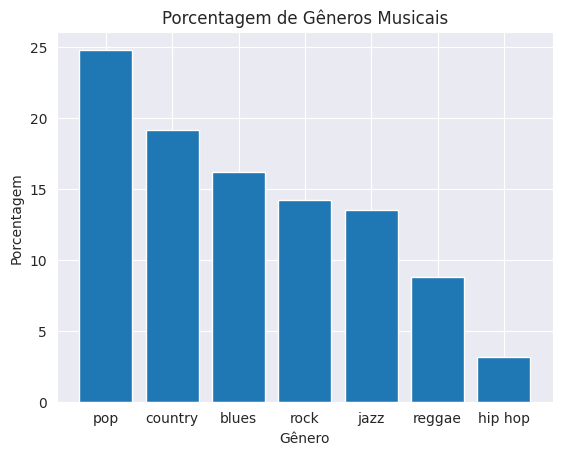

In [ ]:
plt.bar(generos, percent_genero)
plt.xlabel('Gênero')
plt.ylabel('Porcentagem')
plt.title('Porcentagem de Gêneros Musicais')

plt.show()

Como hip-hop é o gênero com menos músicas, consideramos que excluir até mesmo o único valor ausente associado à ele deve impactar negativamente nas análises. Portanto, uma vez que temos a letra da música, realizamos uma pesquisa manual e completamos esse aspecto

In [ ]:
df.loc[27976, 'lyrics']

'feel wall fall feel lose feel sweetest sound feel feel burn mind overdrive lose focus vision blur time line mistake cause know crave wanna control path take wanna feel wall fall feel lose feel sweetest sound feel feel feel feel face fear run feet firm grind sail ocean call land unfound mistake cause know crave wanna control path take wanna feel wall fall feel lose feel sweetest sound feel feel feel feel ohoh give ohoh feel ohoh give ohoh feel feel'

Ao pesquisar o trecho "feel sweetest sound feel feel burn mind overdrive lose", a música sugerida é "[How Does It Feel](https://www.youtube.com/watch?v=Dm-GwMVIDDM&ab_channel=3Beat)" de M-22. No entanto, ao contrário do esperado, o conjunto músical M-22 é composto por um DJ's/produtores musicais ([link para mais informações](https://en.wikipedia.org/wiki/M-22)). O gênero associado à letra pesquisada é mais associada ao gênero 'pop' ou 'eletrônica' (que não é uma classificação presente no nosso dataset). 

Dado esse cenário, já temos indícios de que as análises que serão realizadas podem não corresponder com a realidade dado que a classificação das respectivas músicas podem conter ruídos no processo de classificação (vide o erro ao associar tal música à hip-hop). 


Para a inserção manual, podemos utilizar a função `.iloc()` e acessar o valor através do número do índice e o nome da coluna. Além disso, vamos também trocar o gênero 'hip-hop' para 'pop' conforme a classificação presente no site [Discogs](https://www.discogs.com/release/12398871-M-22-How-Does-It-Feel).

In [ ]:
df.loc[27976, 'genre'] = 'pop'
df.loc[27976, 'artist_name'] = 'm-22'
df.loc[27976, 'track_name'] = 'how does it feel'

In [ ]:
# Verificando as alterações 
df.iloc[27976]

artist_name                                                              m-22
track_name                                                   how does it feel
release_date                                                             2016
genre                                                                     pop
lyrics                      feel wall fall feel lose feel sweetest sound f...
len                                                                        81
dating                                                                0.00081
violence                                                             0.239508
world/life                                                            0.00081
night/time                                                           0.020497
shake_the_audience                                                    0.00081
family/gospel                                                         0.00081
romantic                                                        

In [ ]:
hiphop = df.loc[df['genre'] == 'hip hop', 'artist_name']
hiphop.head(50)

27468             boogie down productions
27469             boogie down productions
27470             boogie down productions
27471             boogie down productions
27472             boogie down productions
27473             boogie down productions
27474                            einstein
27475                  the original squad
27476                             asher d
27477                             asher d
27478                       chris biscuit
27479                        nice  smooth
27480    diamond  the psychotic neurotics
27481    diamond  the psychotic neurotics
27482    diamond  the psychotic neurotics
27483    diamond  the psychotic neurotics
27484              lighter shade of brown
27485    diamond  the psychotic neurotics
27486    diamond  the psychotic neurotics
27487                          kris kross
27488    diamond  the psychotic neurotics
27489    diamond  the psychotic neurotics
27490                            en vogue
27491    diamond  the psychotic ne

Vamos fazer o mesmo para a música do gênero rock que contém os valores faltantes e excluir demais linhas referente ao gênero pop, já que é a classe com mais dados em detrimento das demais. 

In [ ]:
df.loc[26796, 'lyrics']

'tiptoe jordans come tiptoe jordans cop porsche tiptoe foreign motherfuckers borin sleep snorin worry cause tiptoe jordans come tiptoe jordans cop porsche tiptoe foreign motherfuckers borin sleep snorin worry cause partner haters fuck sing hook like baker neon icon city tourin class spain buy polo huaraches photo flip door porsche body shirt versace screen leave pocket california move texas dyslexic fourdoor mango lexus titty afraid throw pesos strippers rock fuck minimum wage leave neon rave tiptoe batcave cause tiptoe jordans come tiptoe jordans cop porsche tiptoe foreign motherfuckers borin sleep snorin worry cause tiptoe jordans wake crack redcam recordin girlfriends gorgeous probably afford brazilian twin flag deport ballers rock fresh jordans security gate finger scan panther porches door open pull lotus drive focus rock jordans california roll shrimp tempura rock seven ring like slumber party girls sleep outside versace sleep tiptoe jordans come tiptoe jordans cop porsche tiptoe

Quando pesquisamos manualmente a letra "leave pocket california move texas dyslexic fourdoor mango" fomos direcionados à música "[RiFF RAFF - TiP TOE WiNG iN MY JAWWDiNZ](https://www.youtube.com/watch?v=niHSDx4Y_zs&ab_channel=JodyHighRoller)" cuja classificação também se encontra inadequada, já que os elementos musicais de aproximam muito mais do hip hop do que do rock.  

In [ ]:
df.loc[26796, 'genre'] = 'hip hop'
df.loc[26796, 'track_name'] = 'tip toe wing in my jawwdinz'

In [ ]:
# Verificando se as alterações 
df.iloc[26796]

artist_name                                                               toe
track_name                                        tip toe wing in my jawwdinz
release_date                                                             2012
genre                                                                 hip hop
lyrics                      tiptoe jordans come tiptoe jordans cop porsche...
len                                                                       155
dating                                                               0.050489
violence                                                               0.0745
world/life                                                           0.000993
night/time                                                           0.085034
shake_the_audience                                                   0.000993
family/gospel                                                        0.065271
romantic                                                        

Vamos remover as demais colunas referentes ao gênero pop e que contém dados faltantes. 

In [ ]:
indices = [154, 155, 2597, 3870, 4766, 4778, 5412] 
df = df.drop(indices)

In [ ]:
# verificando se obtivemos um df sem dados faltantes
df.isnull().sum()

artist_name                 0
track_name                  0
release_date                0
genre                       0
lyrics                      0
len                         0
dating                      0
violence                    0
world/life                  0
night/time                  0
shake_the_audience          0
family/gospel               0
romantic                    0
communication               0
obscene                     0
music                       0
movement/places             0
light/visual_perceptions    0
family/spiritual            0
like/girls                  0
sadness                     0
feelings                    0
danceability                0
loudness                    0
acousticness                0
instrumentalness            0
valence                     0
energy                      0
topic                       0
age                         0
dtype: int64

Após trabalhar na formatação e estruturação do dataset em si, vamos verificar os aspectos estatísticos básicos referente à esses dados. 

In [ ]:
df.describe()

,release_date,len,dating,violence,world/life,night/time,shake_the_audience,family/gospel,romantic,communication,...,like/girls,sadness,feelings,danceability,loudness,acousticness,instrumentalness,valence,energy,age
count,28365.000000,28365.000000,28365.000000,28365.000000,28365.000000,28365.000000,28365.000000,28365.000000,28365.000000,28365.000000,...,28365.000000,28365.000000,28365.000000,28365.000000,28365.000000,2.836500e+04,28365.000000,28365.000000,28365.000000,28365.000000
mean,1990.238251,73.027076,0.021105,0.118421,0.120956,0.057388,0.017423,0.017045,0.048683,0.076671,...,0.028052,0.129383,0.031000,0.533339,0.665246,3.391415e-01,0.080069,0.532874,0.569911,0.425168
std,18.487243,41.832080,0.052365,0.178698,0.172203,0.111925,0.040672,0.041967,0.106105,0.109534,...,0.058469,0.181151,0.071660,0.173234,0.108445,3.266899e-01,0.211268,0.250971,0.244402,0.264103
min,1950.000000,1.000000,0.000291,0.000284,0.000291,0.000289,0.000284,0.000289,0.000284,0.000291,...,0.000284,0.000284,0.000289,0.005415,0.000000,2.811248e-07,0.000000,0.000000,0.000000,0.014286
25%,1975.000000,42.000000,0.000923,0.001120,0.001170,0.001032,0.000993,0.000923,0.000975,0.001144,...,0.000975,0.001144,0.000993,0.412975,0.595339,3.423598e-02,0.000000,0.329143,0.380361,0.185714
50%,1991.000000,63.000000,0.001462,0.002506,0.006579,0.001949,0.001595,0.001504,0.001754,0.002632,...,0.001595,0.005263,0.001754,0.538612,0.679050,2.248988e-01,0.000085,0.539365,0.580567,0.414286
75%,2007.000000,93.000000,0.004049,0.192632,0.197612,0.065856,0.010037,0.004785,0.042300,0.132121,...,0.026603,0.235112,0.032620,0.656666,0.749045,6.325298e-01,0.009352,0.738252,0.772766,0.642857
max,2019.000000,199.000000,0.647706,0.981781,0.962105,0.973684,0.497463,0.545303,0.940789,0.645829,...,0.594459,0.981424,0.958810,0.993502,1.000000,1.000000e+00,0.996964,1.000000,1.000000,1.000000


Apesar de ser informações importantes, ainda não conseguimos ter intuição sobre tais informações. Assim, é importante que façamos análises gráficas para compreender o comportamento de cada feature e tirar conclusões desses dados 

### Verificando qual a composição de cada coluna

In [ ]:
for i in df.columns: 
  print(f'coluna {i}\nValores únicos: {df[i].unique}\n')

coluna artist_name
Valores únicos: <bound method Series.unique of 0                      mukesh
1               frankie laine
2                 johnnie ray
3                  prez prado
4        giorgos papadopoulos
                 ...         
28367                 mack 10
28368                  m.o.p.
28369                    nine
28370              will smith
28371                   jeezy
Name: artist_name, Length: 28365, dtype: object>

coluna track_name
Valores únicos: <bound method Series.unique of 0                 mohabbat bhi jhoothi
1                            i believe
2                                  cry
3                             patricia
4                   apopse eida oneiro
                     ...              
28367                  10 million ways
28368    ante up (robbin hoodz theory)
28369                    whutcha want?
28370                           switch
28371                           r.i.p.
Name: track_name, Length: 28365, dtype: object>

coluna rele

In [ ]:
for i in df.columns: 
  print(f'coluna {i}\n  valor máximo: {df[i].max()}\n  valor mínimo:{df[i].min()}\n')

coluna artist_name
  valor máximo: zz top
  valor mínimo:"weird al" yankovic

coluna track_name
  valor máximo: zungguzungguguzungguzeng
  valor mínimo: 

coluna release_date
  valor máximo: 2019
  valor mínimo:1950

coluna genre
  valor máximo: rock
  valor mínimo:blues

coluna lyrics
  valor máximo: zoom zoom zoom zoom world mess politics tax people grind ax happiness zoom zoom zoom zoom rhythm lead future fret slap bass happiness riddle listen bass fiddle slap bass slap till dizzy slap bass rhythm busy zoom zoom zoom misery slap bass like tonic slap bass philharmonic zoom zoom zoom milk flow dictators better zoom zoom today happiest rhythm want bauble slap bass slap away trouble learn zoom zoom zoom slap bass bridge dictators better zoom zoom today happiest rhythm want bauble slap bass slap away trouble learn zoom zoom zoom slap bass zoom zoom zoom zoom zoom zoom zoom zoom zoom zoom zoom zoom
  valor mínimo:               baby    romanization neowa eonjenga nami dwieodo yeongyeong d

In [ ]:
df['len'].mean()

73.02707562136436

In [ ]:
df['len'].median()

63.0

## Análise gráfica

Antes de verificarmos como cada feature se comporta, é interessante verificar se há dados altamente correlacionados, já que podem representar características "duplicadas". 

<ipython-input-113-2309d0eb5a92>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  heatmap = sns.heatmap(df.corr(), annot=True, cmap='BrBG')


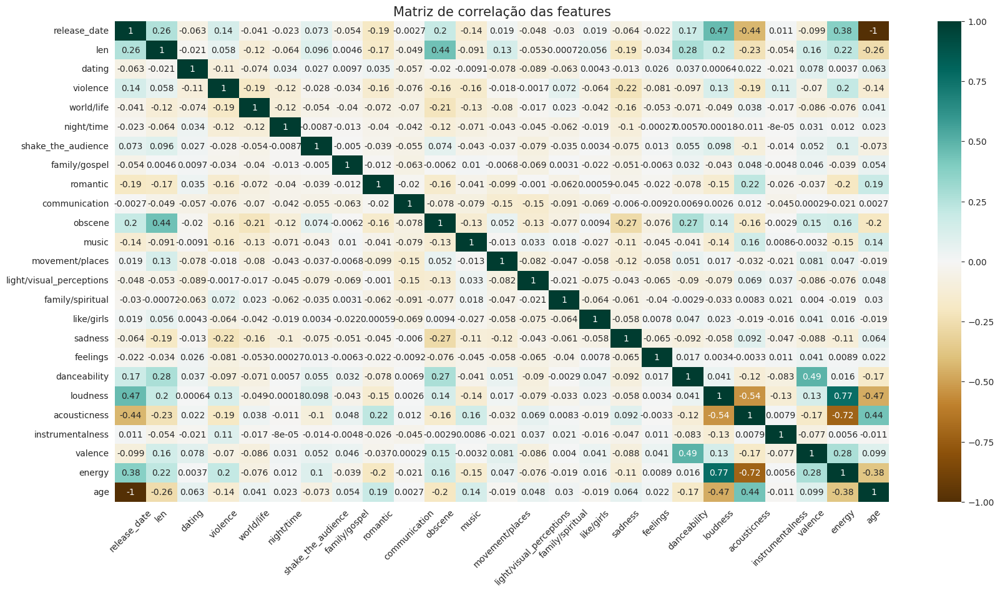

In [ ]:
plt.figure(figsize=(20, 10))
plt.title('Matriz de correlação das features', fontsize = 15)
heatmap = sns.heatmap(df.corr(), annot=True, cmap='BrBG')
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45)
plt.show()

Correlações observadas:
- release_date e age (age pode ser a normalização de release_date)
- energy e loudness (positiva)
- energy e acousticness (negativa)



Essas correlações podem ser também observadas em gráficos relacionando as duas variáveis:

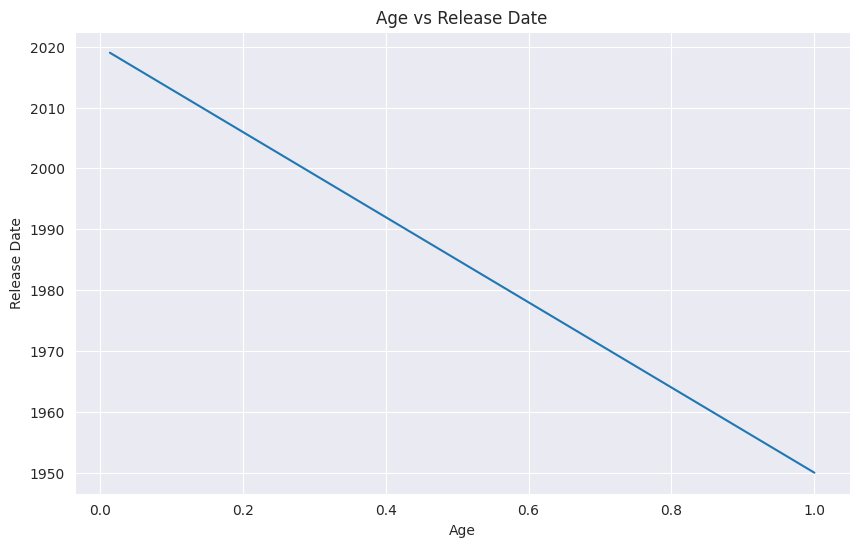

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df['age'], df['release_date'])
plt.xlabel('Age')
plt.ylabel('Release Date')
plt.title('Age vs Release Date')

plt.show()

A curva que descreve release date e age indica que quanto mais atual, menor a idade. Ou seja, há duas colunas que descrevem uma mesma característica. 

Sabendo que iremos estabelecer análises referente à decada nos próximos passos da análise, optamos por remover a coluna 'age'. 

In [ ]:
df = df.drop('age', axis=1)

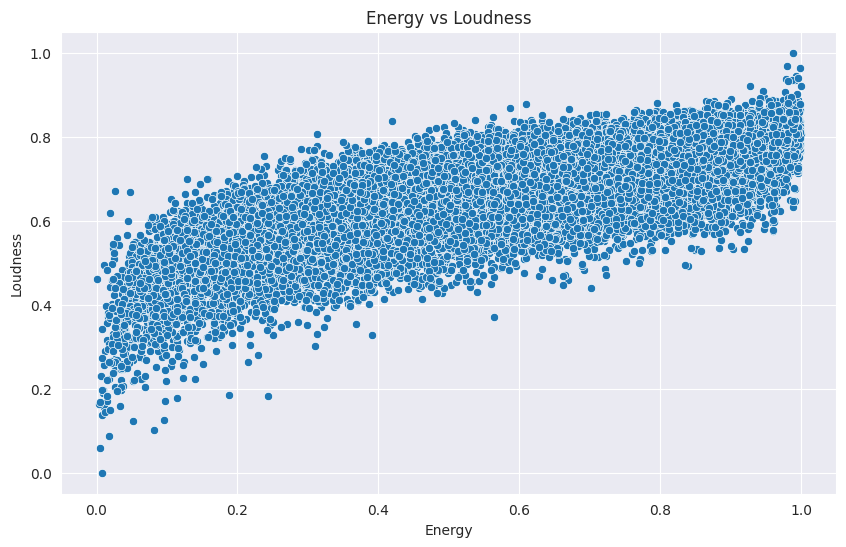

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='energy', y='loudness')
plt.xlabel('Energy')
plt.ylabel('Loudness')
plt.title('Energy vs Loudness')

plt.show()

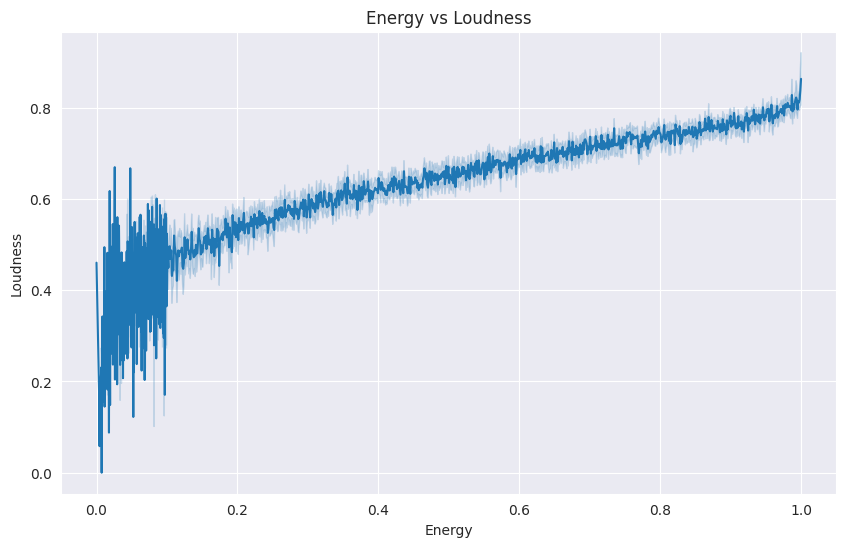

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='energy', y='loudness')
plt.xlabel('Energy')
plt.ylabel('Loudness')
plt.title('Energy vs Loudness')

plt.show()

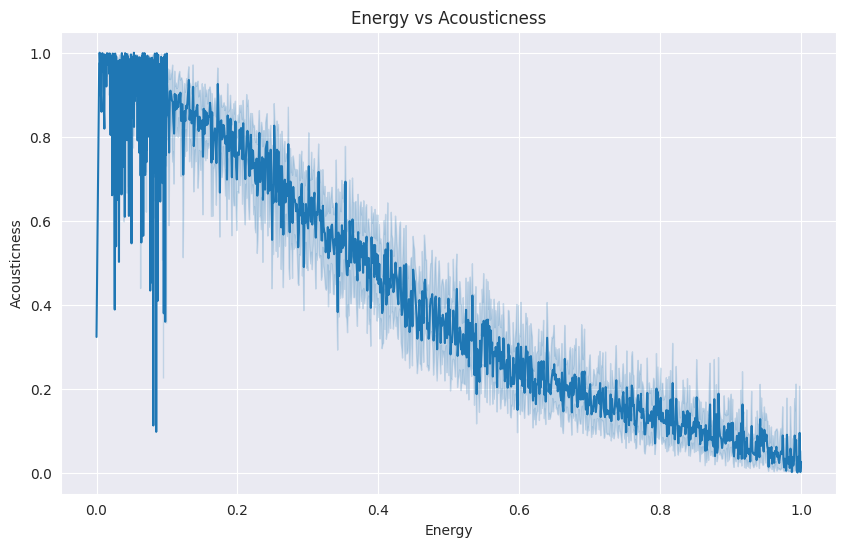

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='energy', y='acousticness')
plt.xlabel('Energy')
plt.ylabel('Acousticness')
plt.title('Energy vs Acousticness')

plt.show()

## Histogramas

Podemos plotar histogramas para observar a distibuição de frequência em cada atribuito.

Text(0.5, 1.0, 'Histograma - release_date (década)')

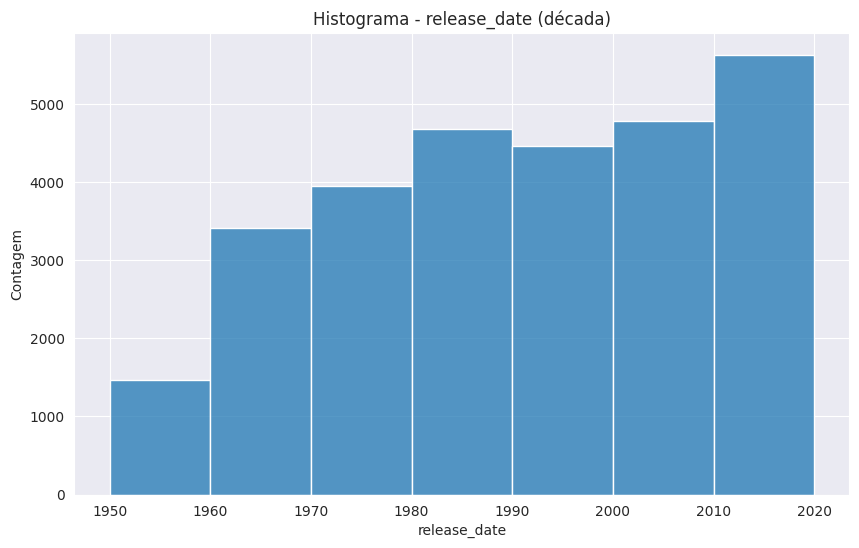

In [ ]:
# release_date por década
plt.figure(figsize = (10,6))
sns.histplot(data=df, x='release_date', binwidth=10)
plt.ylabel('Contagem')
plt.title('Histograma - release_date (década)')

Podemos perceber que a década de 1950 possui bem menos observações que as demais décadas e, em geral, a frequência aumentou com o passar as décadas.

Text(0.5, 1.0, 'Histograma - release_date (ano)')

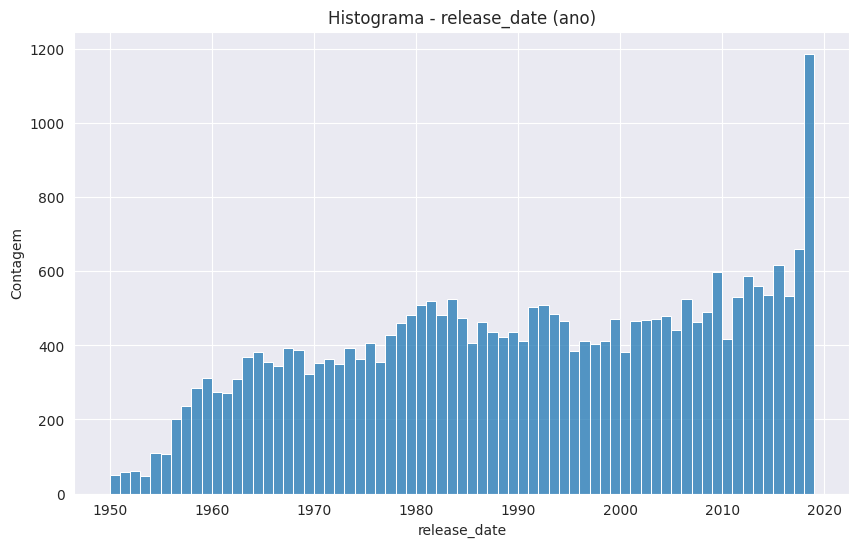

In [ ]:
# release_date por ano
plt.figure(figsize = (10,6))
sns.histplot(data=df, x='release_date', binwidth=1)
plt.ylabel('Contagem')
plt.title('Histograma - release_date (ano)')

Podemos observar que o número de músicas no dataset aumentou ao longo dos anos, mas o ano de 2018 tem quase o dobro de músicas que o segundo ano com mais músicas.

Text(0.5, 1.0, 'Histograma - len')

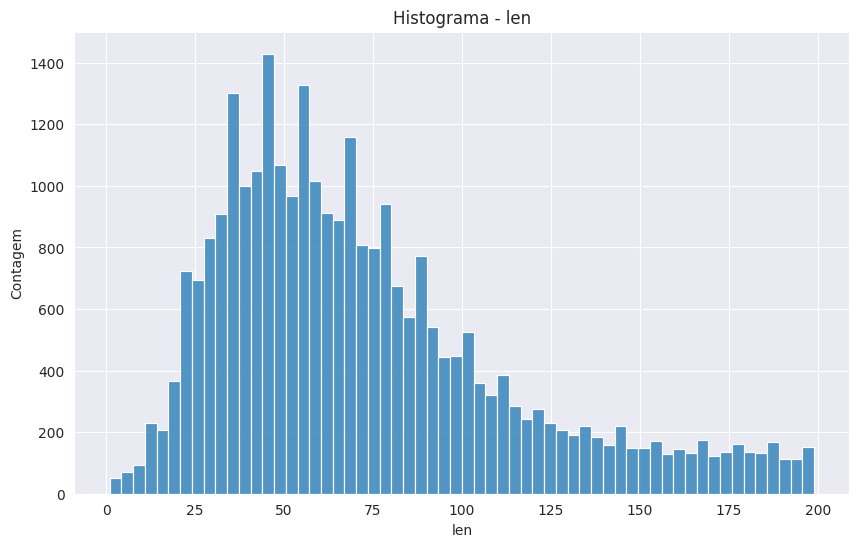

In [ ]:
# len
plt.figure(figsize = (10,6))
sns.histplot(data=df, x='len')
plt.ylabel('Contagem')
plt.title('Histograma - len')

O formato do histograma do atributo len lembra uma normal assimétrica, com alguns picos em valores específicos.

Mas ainda não sabemos o que essa coluna significa. Não parece coerente que seja alguma unidade de tempo. Vamos testar o tamanho da string com a letra da música ('lyrics'). Abaixo, criamos uma função que conta o número de palavras na letra da música e em seguida plotamos um gráfico relacionando esses valores com a coluna 'len'.

In [ ]:
def conta_palavras (line):
    line['n_palavras'] = len(line['lyrics'].split())
    return line

In [ ]:
df = df.apply(conta_palavras, axis='columns')

Text(0.5, 1.0, 'len vs. n_palavras')

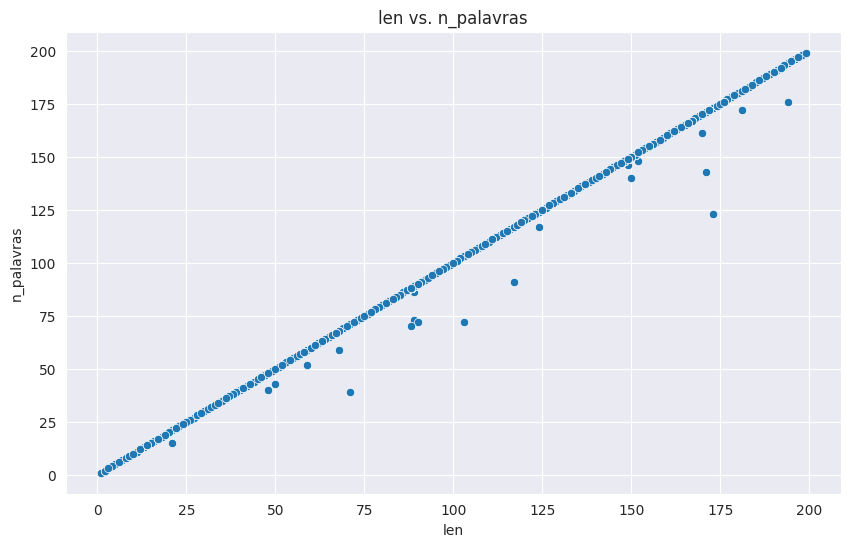

In [ ]:
plt.figure(figsize = (10,6))
sns.scatterplot(data=df, x='len', y='n_palavras')
plt.title('len vs. n_palavras')

Pode-se perceber que a relação entre os atributos é direta. Portanto, podemos concluir que 'len' se refere ao comprimento da música em palavras. Com isso, podemos excluir a coluna recém criada 'n_palavras'.

In [ ]:
df = df.drop(labels=['n_palavras'], axis='columns')

Retornando, vamos plotar todos os histogramas das variáveis restantes de uma vez, usando um laço for:

<ipython-input-126-1dbc13d4cf31>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10,6))


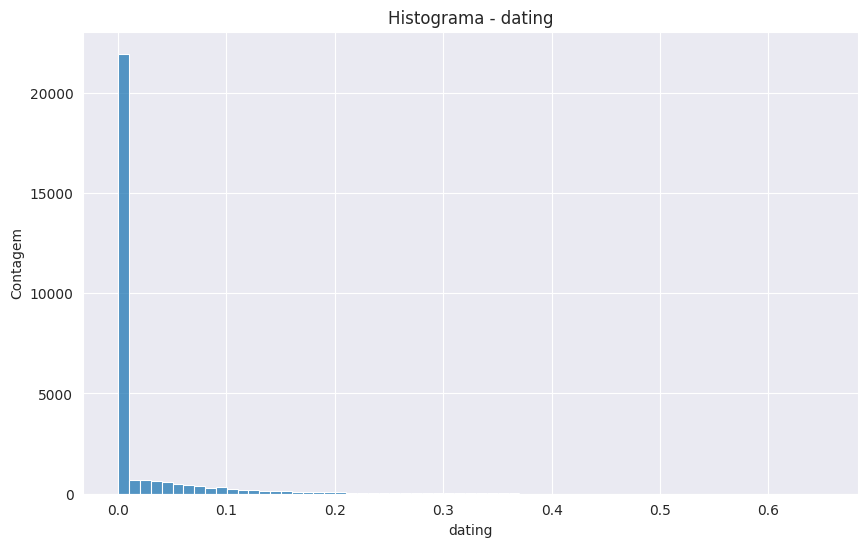

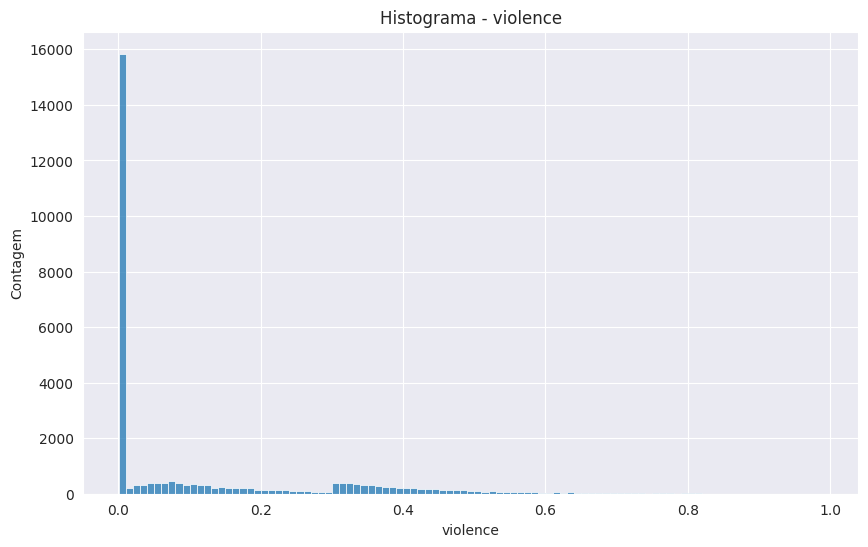

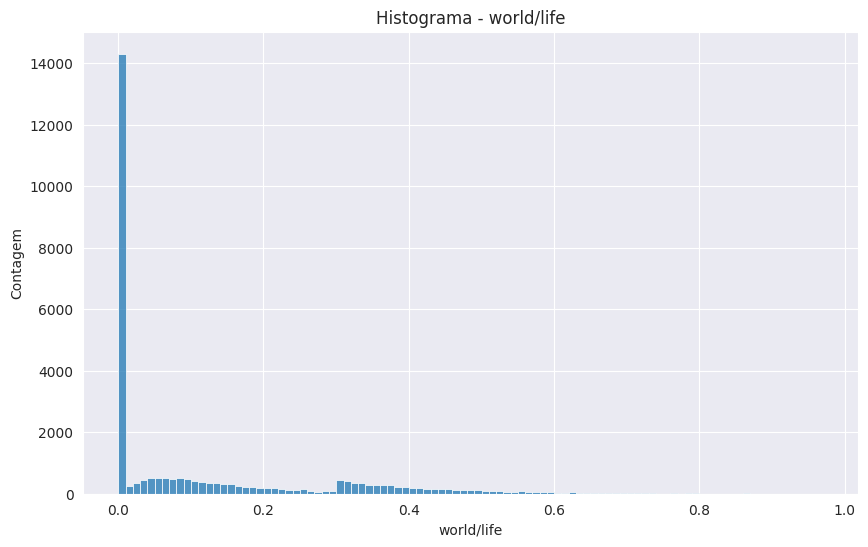

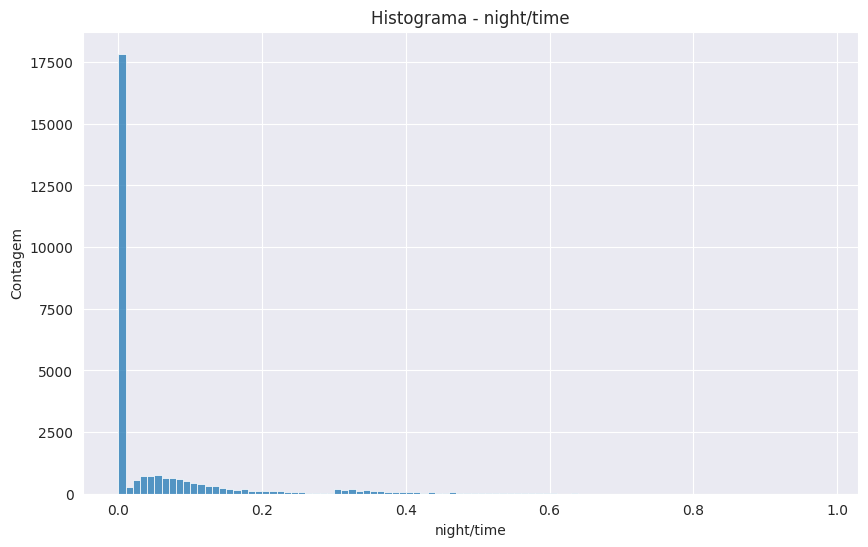

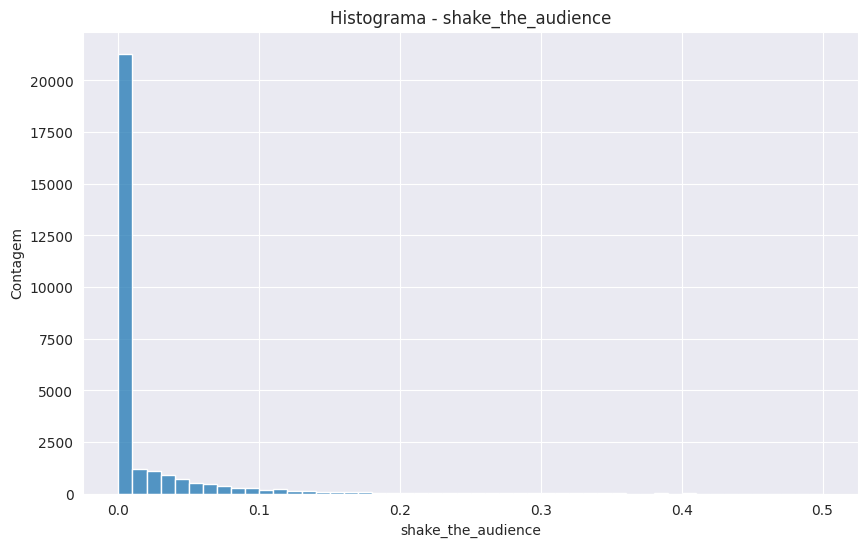

...

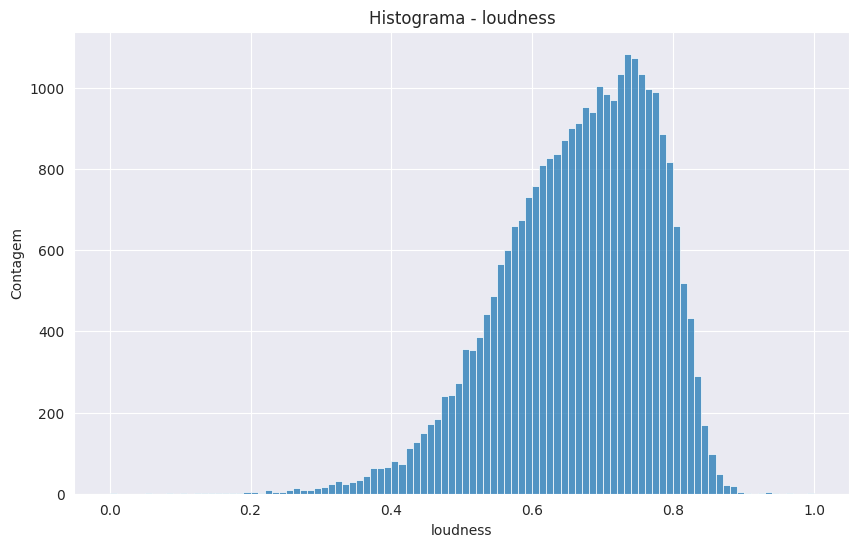

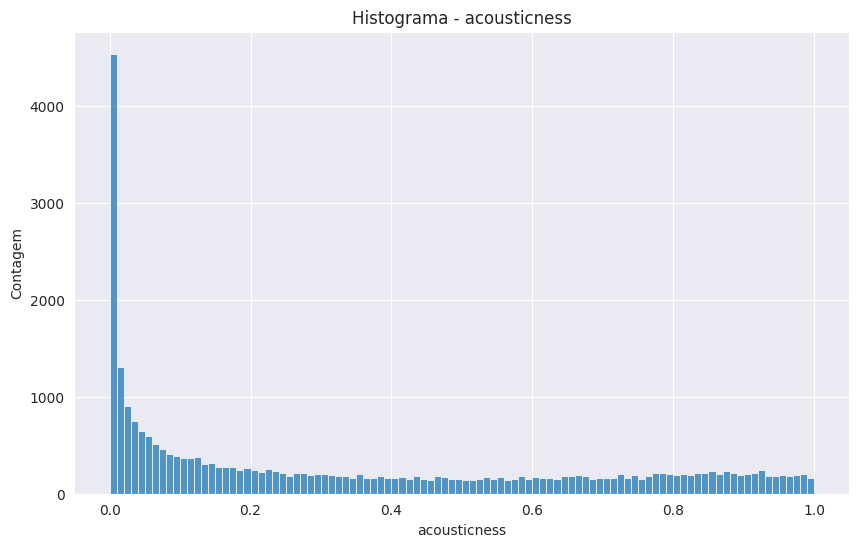

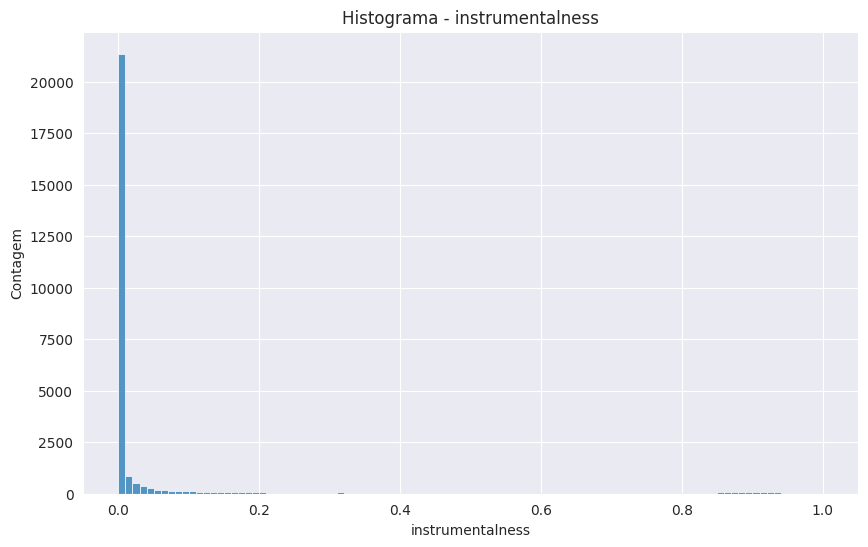

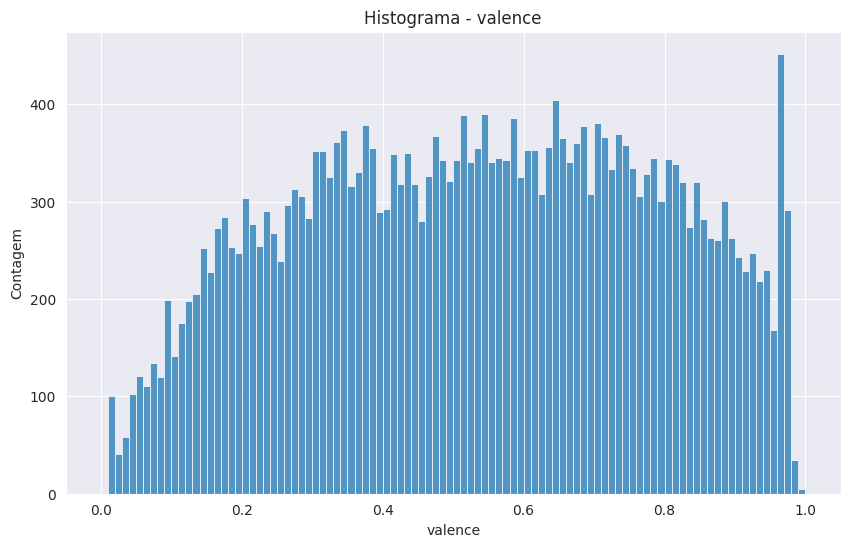

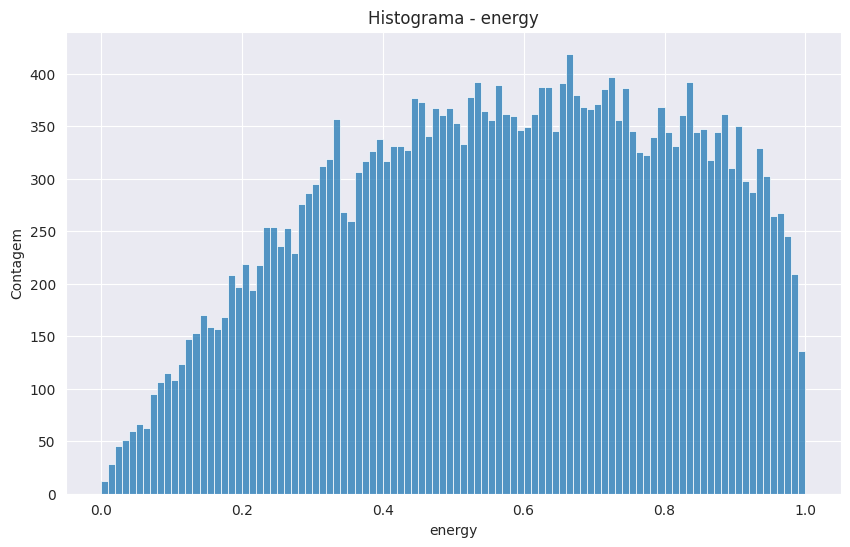

In [ ]:
for i in ['dating', 'violence', 'world/life', 'night/time', 'shake_the_audience',
          'family/gospel', 'romantic', 'communication', 'obscene', 'music',
          'movement/places', 'light/visual_perceptions', 'family/spiritual',
          'like/girls', 'sadness', 'feelings', 'danceability', 'loudness',
          'acousticness', 'instrumentalness', 'valence', 'energy']:
    plt.figure(figsize = (10,6))
    sns.histplot(data=df, x=i, binwidth=0.01)
    plt.ylabel('Contagem')
    plt.title('Histograma - '+i)

Desses histogramas, podemos fazer as seguintes observações:

As colunas 'dating', 'violence', 'world/life', 'night/time', 'shake_the_audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual_perceptions', 'family/spiritual', 'like/girls', 'sadness' e 'feelings' têm um grande número de músicas com pouca ou nenhuma dessas características.

O atributo 'dance' segue uma distribuição aproximadamente normal simétrica:

Text(0.5, 1.0, 'Histograma - danceability')

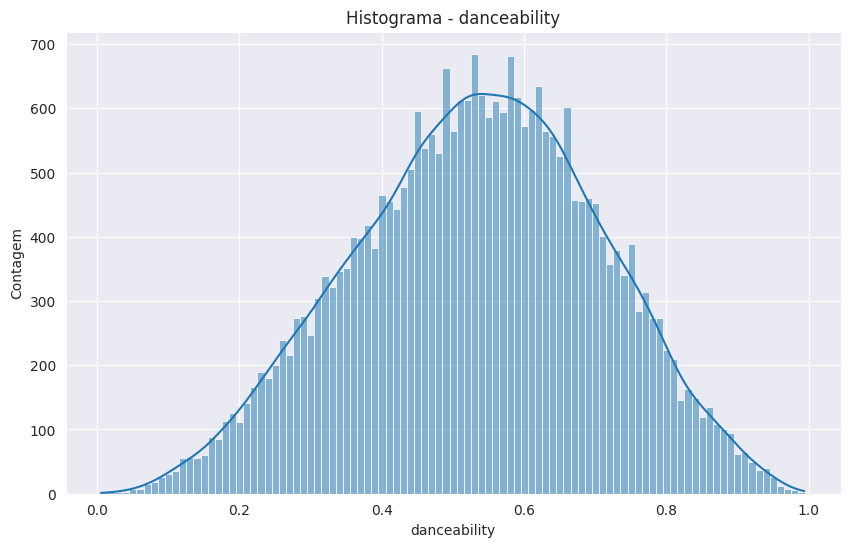

In [ ]:
plt.figure(figsize = (10,6))
sns.histplot(data=df, x='danceability', binwidth=0.01, kde=True)
plt.ylabel('Contagem')
plt.title('Histograma - danceability')

Já o atributo 'loudness' se aproxima à uma normal assimétrica:

Text(0.5, 1.0, 'Histograma - loudness')

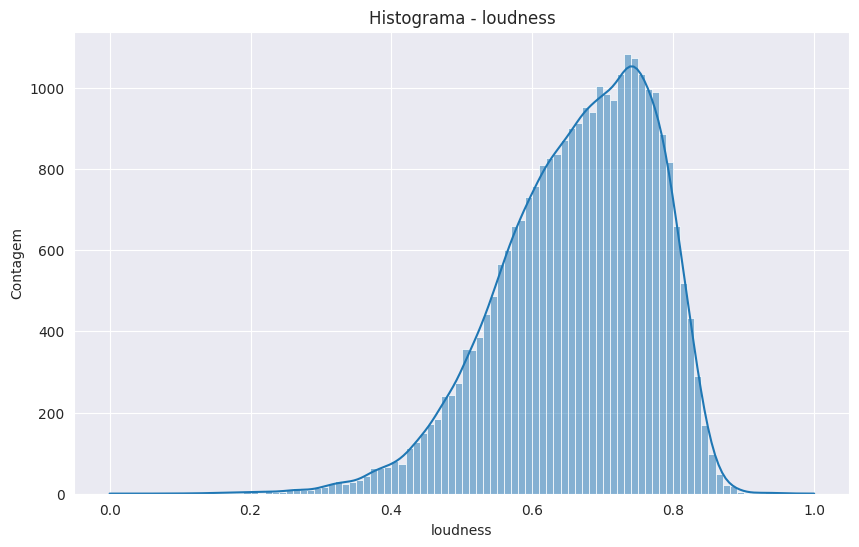

In [ ]:
plt.figure(figsize = (10,6))
sns.histplot(data=df, x='loudness', binwidth=0.01, kde=True)
plt.ylabel('Contagem')
plt.title('Histograma - loudness')

## Evolução dos atributos por ano

Vamos observar a relação entre cada atributo e o ano de lançamento plotando gráficos de linha. Podemos plotar todos os gráficos de uma vez usando um laço for:

<ipython-input-129-48dba353f86b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10,6))


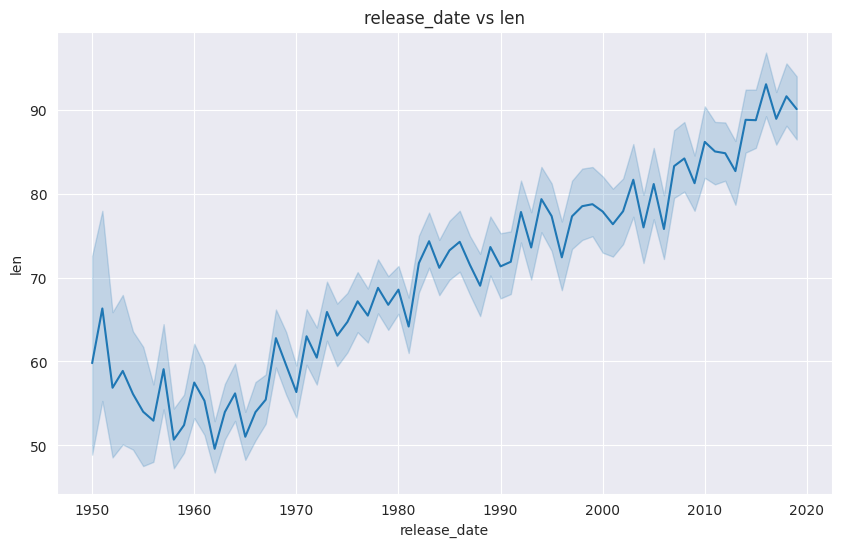

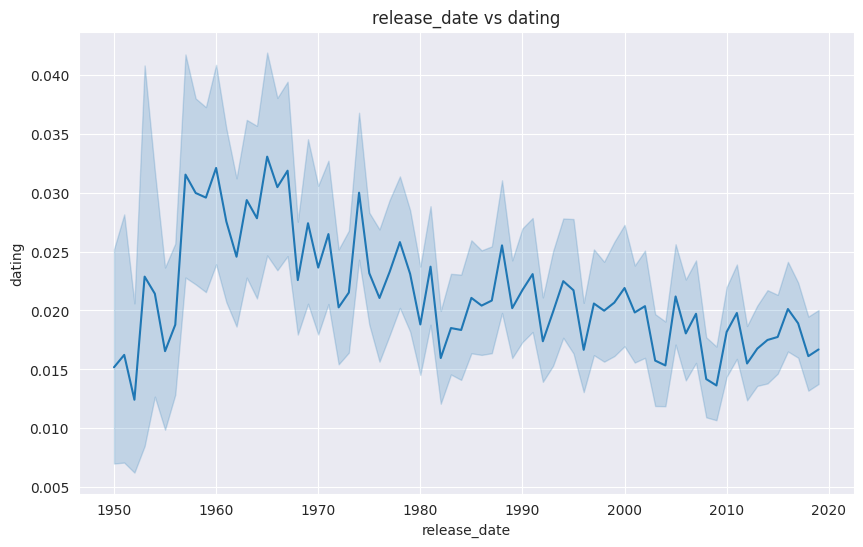

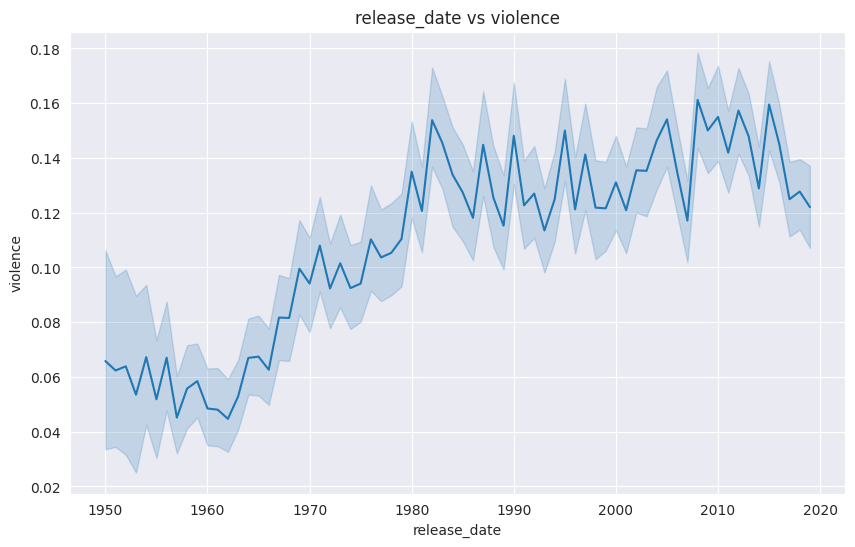

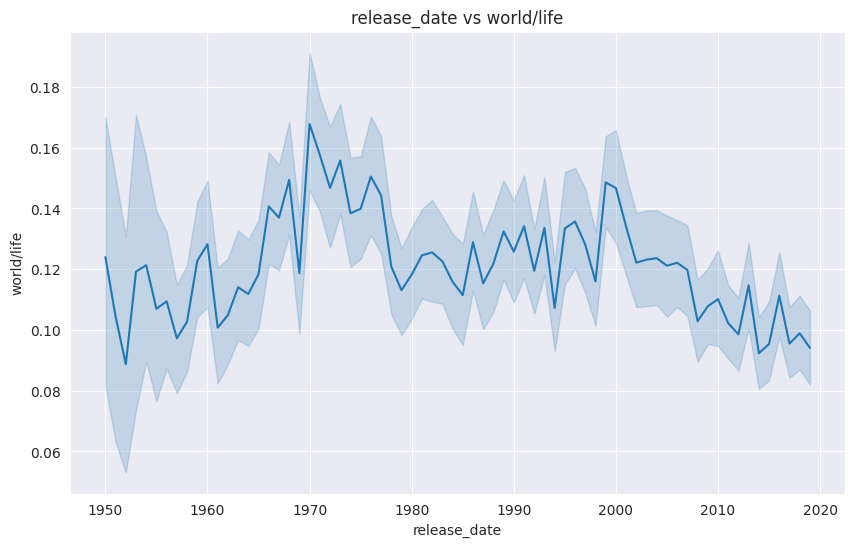

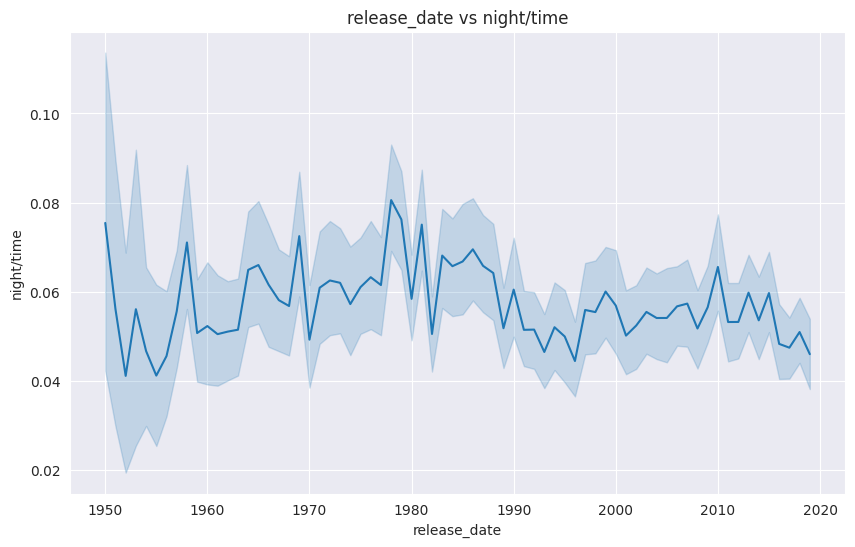

...

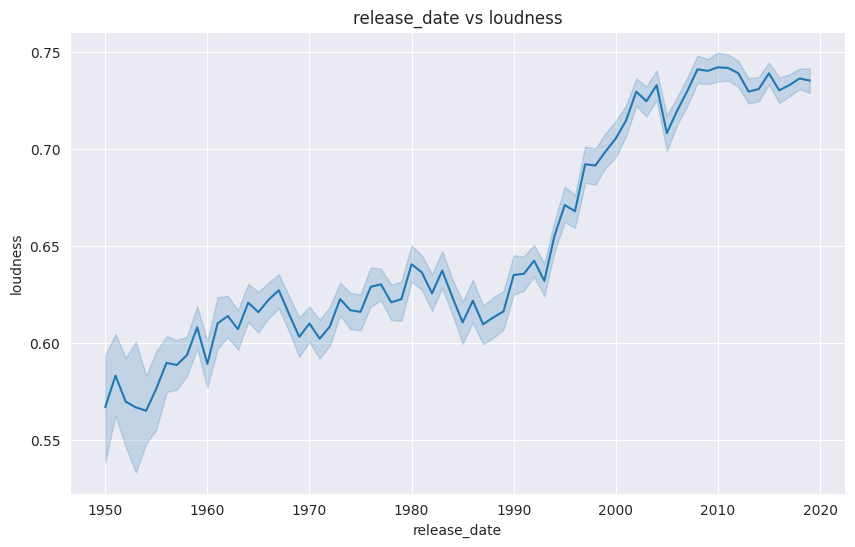

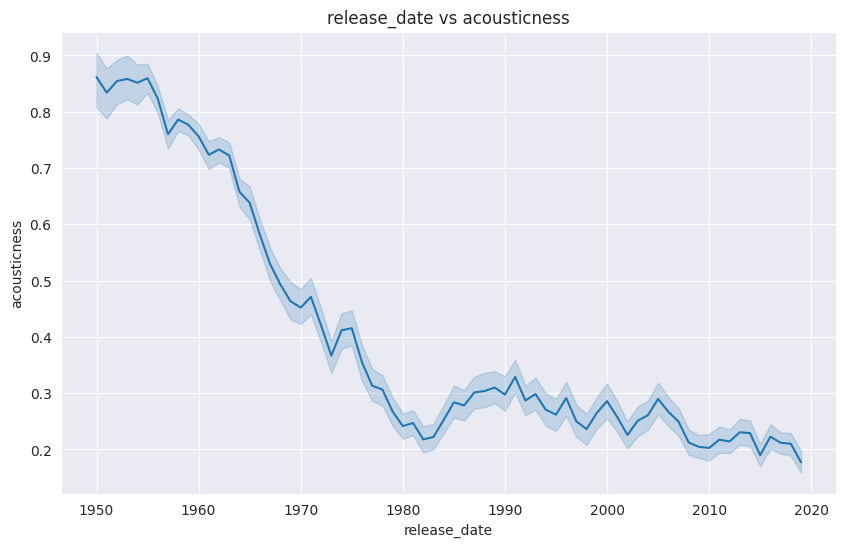

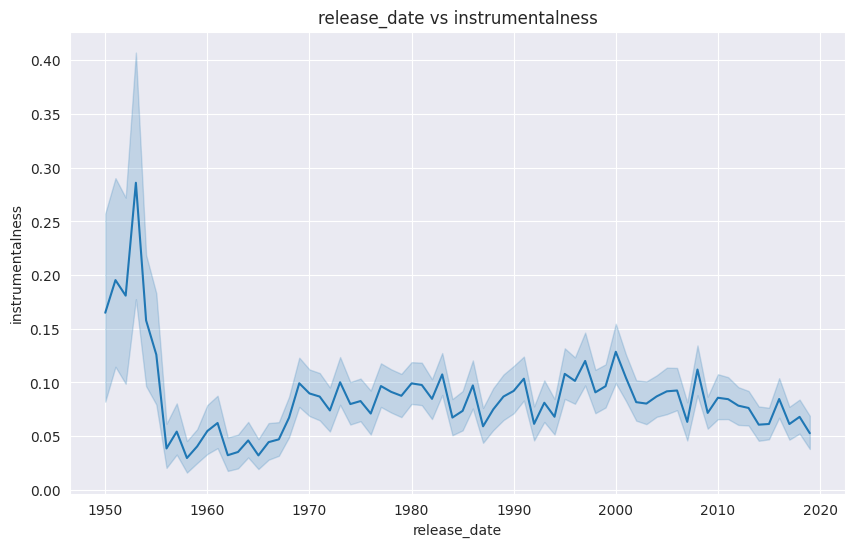

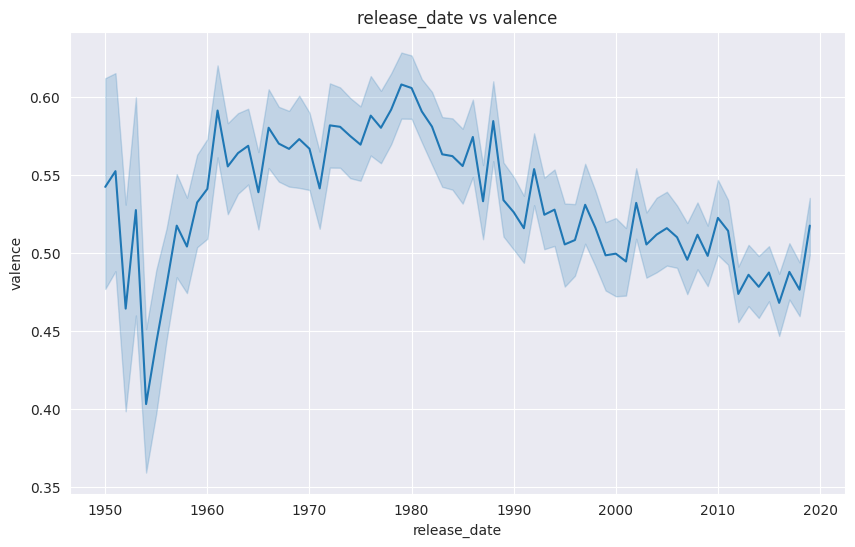

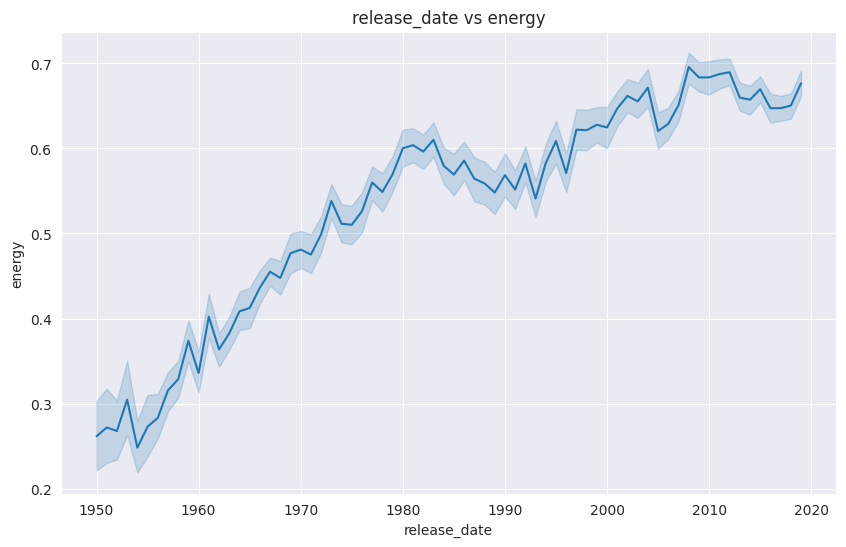

In [ ]:
for i in ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake_the_audience',
          'family/gospel', 'romantic', 'communication', 'obscene', 'music',
          'movement/places', 'light/visual_perceptions', 'family/spiritual',
          'like/girls', 'sadness', 'feelings', 'danceability', 'loudness',
          'acousticness', 'instrumentalness', 'valence', 'energy']:
    plt.figure(figsize = (10,6))
    sns.lineplot(data=df, x='release_date', y=i)
    plt.title('release_date vs '+i)

Muitas tendências podem ser observadas nesses gráficos, entre elas, destacam-se as seguintes:

* Len: podemos observar queda até meados da década de 1960, com posterior aumento ao longo das décadas.
* Dating: podemos observar aumento até meados da década de 60, diminuindo ligeiramente ao longo dos anos desde então.
* Violence: podemos observar um aumento expressivo entre as décadas de 1960 e 1980, mantendo certa estabilidade desde então.
* Shake the audience: em geral, tem crescido ao longo do tempo.
* Family/gospel: tem diminuído ligeiramente desde o final dos anos 1950.
* Romantic: tem diminuído desde o início da década de 60.
* Obscene: aumentou ligeiramente ao longo do tempo, com aumento expressivo na segunda metade da década de 2010.
* Music: tem diminuído ao longo dos anos.
* Sadness: quedas expressivas nas décadas de 1970 e 2010.
* Danceability: Estabilidade nas décadas de 1980, 1990 e 2000 e aumento expressivo na década de 2010.
* Loudness: tem aumentado ao longo do tempo, com aumento muito intenso nos anos 90.
* Acousticness: forte queda até o início da década de 80.
* Instrumentalness: forte queda ainda no meio da década de 50.
* Energy: tem aumentado ao longo do tempo.


## Atributos por gênero musical

Agora, vamos visualizar a distribuição de cada atributo por gênero musical usando gráficos de barras. Vamos plotar todos de uma vez usando um laço for:

<ipython-input-130-024f28295d5c>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10,6))


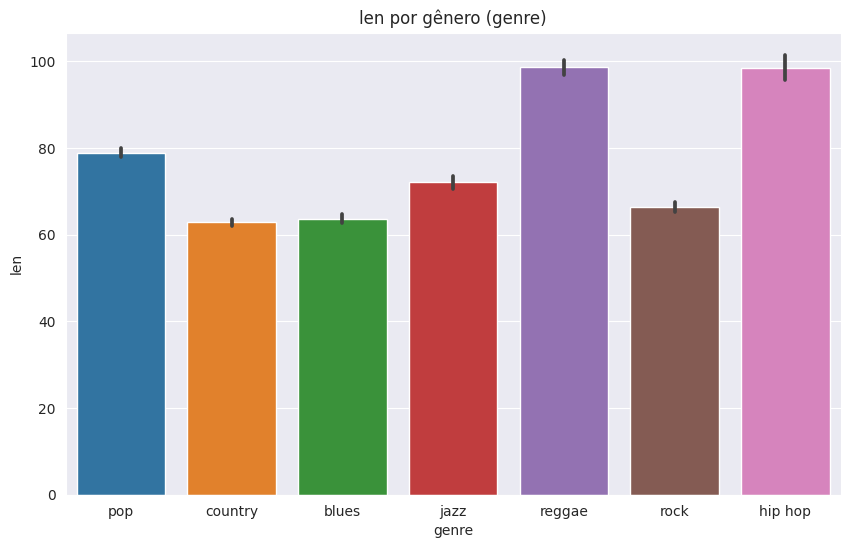

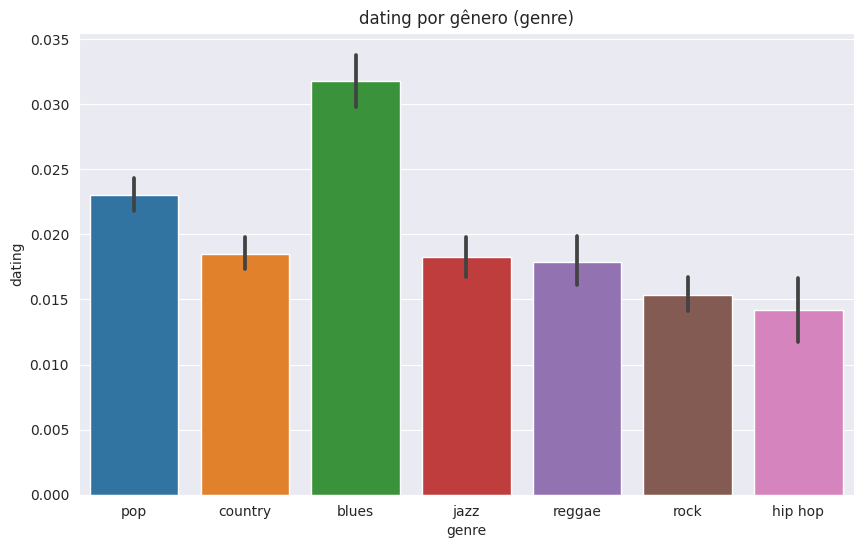

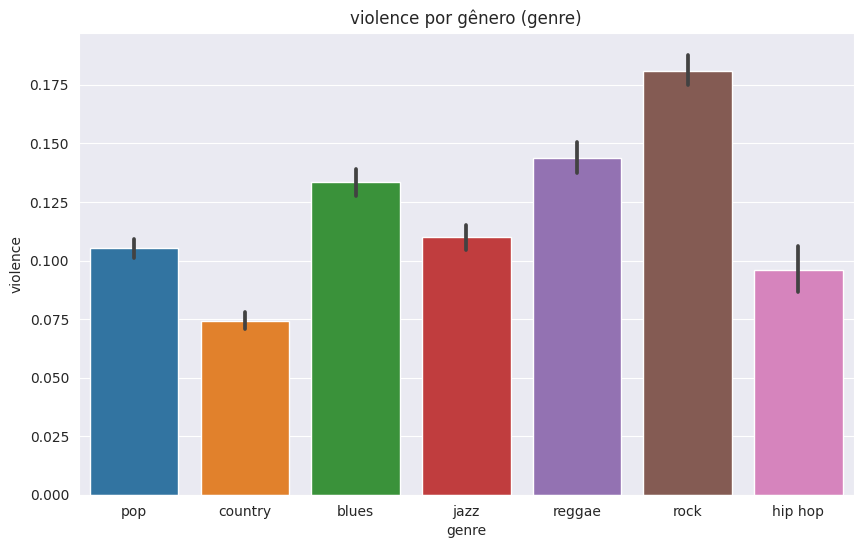

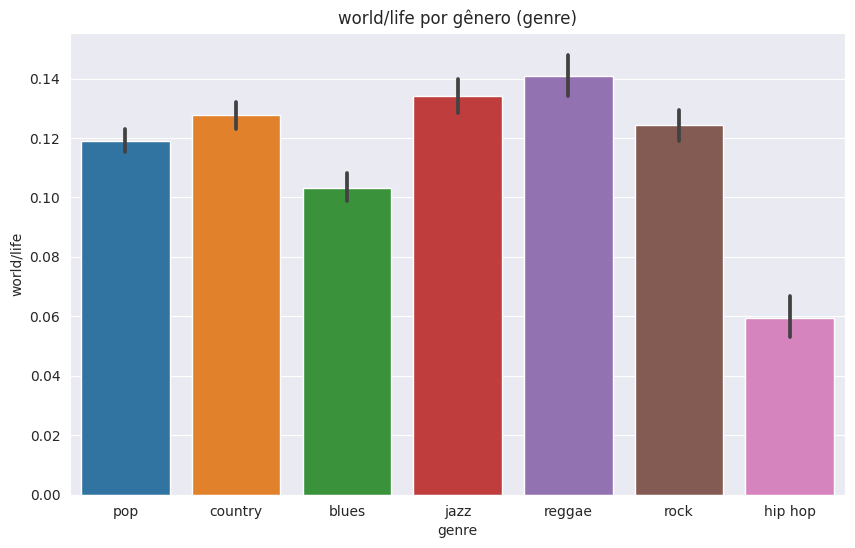

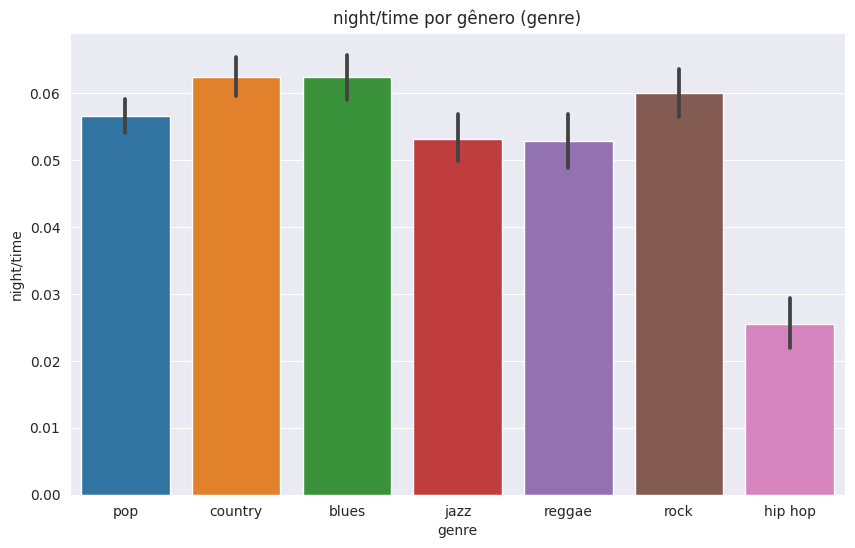

...

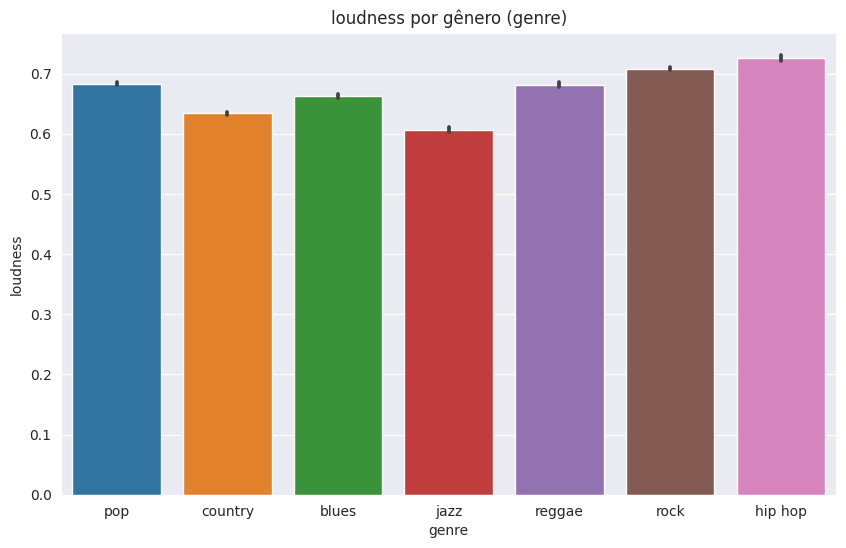

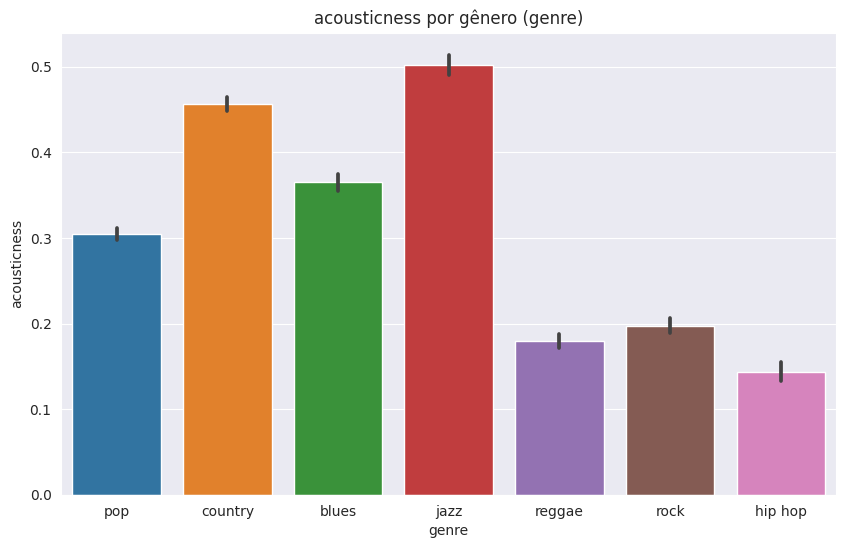

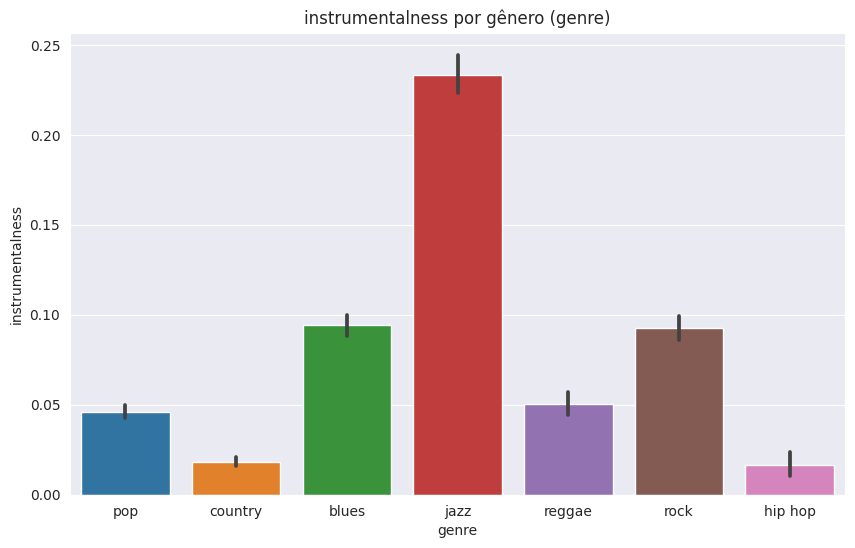

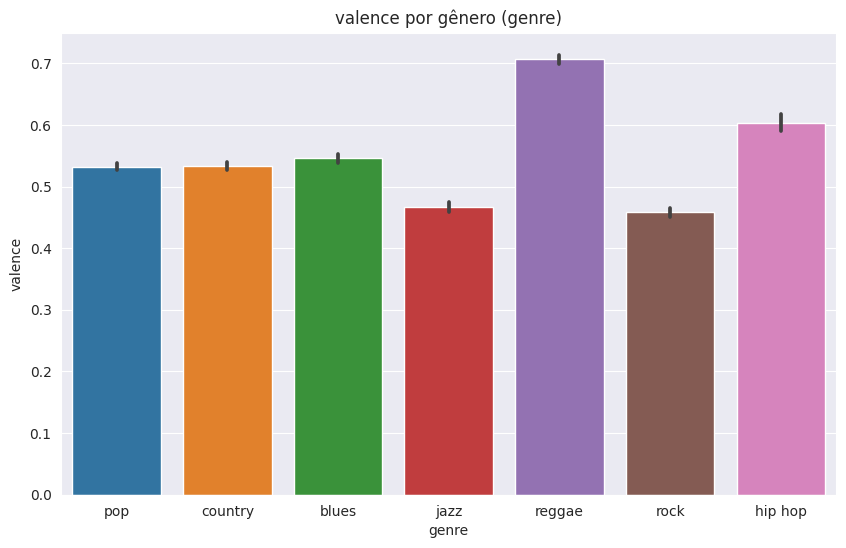

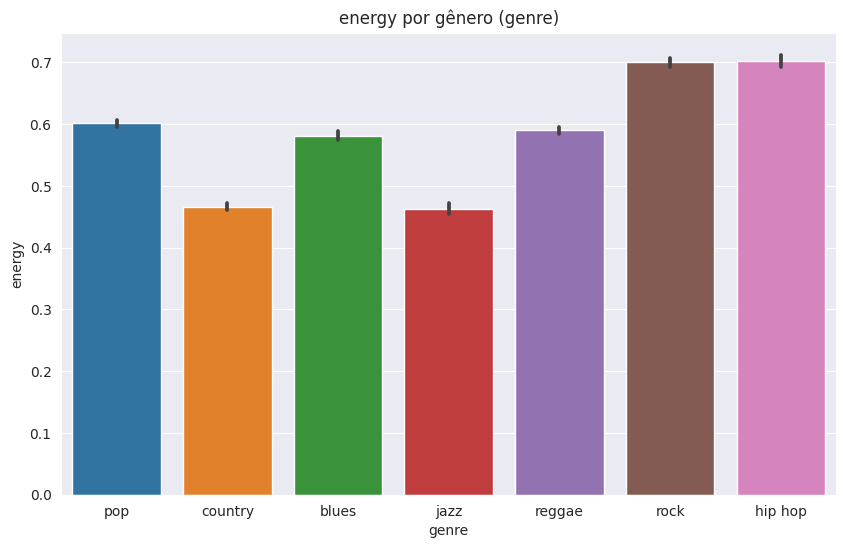

In [ ]:
for i in ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake_the_audience',
          'family/gospel', 'romantic', 'communication', 'obscene', 'music',
          'movement/places', 'light/visual_perceptions', 'family/spiritual',
          'like/girls', 'sadness', 'feelings', 'danceability', 'loudness',
          'acousticness', 'instrumentalness', 'valence', 'energy']:
    plt.figure(figsize = (10,6))
    sns.barplot(data=df, x='genre', y=i)
    plt.title(i+' por gênero (genre)')

As seguintes observações podem ser feitas a partir desses gráficos:
* Len: os maiores números médios de palavras pertencem aos gêneros reggae e hip hop.
* Dating: o blues se sobressai, com média bem maior que os demais.
* Violence: maior média pertence ao rock, e a menor, ao country.
* World/life: o hip hop tem uma média bem inferior aos demais gêneros.
* Night/time: novamente, o hip hop tem uma média bem menor que as demais.
* Shake the audience: a música country tem a menor media.
* Family/gospel: o blues tem a maior média e o hip hop, a menor.
* Romantic: reggae, rock e sobretudo o hip hop, tem uma média bem menor que os outros gêneros.
* Obscene: o hip hop tem uma média expressivamente maior que os demais gêneros.
* Music: o hip hop tem uma média menor que as demais, enquanto o jazz, a maior.
* Movement/places: a maior média é do country.
* Light/visual perceptions: a maior média é do jazz e a menor, do hip hop.
* Family/spiritual: a reggae tem um média relativamente maior que os demais gêneros.
* Like/girls: todos os gêneros têm uma média parecida, sendo a maior no pop.
* Sadness: o hip hop tem uma média bem menor que os outros gêneros.
* Feelings: o blues tem uma média relativamente maior que os demais gêneros, enquanto o hip hop, relativamente menor.
* Danceability: reggae e hip hop têm medias maiores que os demais gêneros.
* Loudness: as médias são parecidas entre todos os gêneros, mas é maior no hip hop.
* Acousticness: Jazz e country se destacam com as maiores médias, e reggae, rock e hip hop, com médias bem menores que os demais gêneros.
* Instrumentalness: O jazz tem uma média bem maior que os outros gêneros, e o country e o hip hop, bem menores.
* Valence: a média do reggae é ligeiramente maior que as demais.
* Energy: rock e hip hop têm as maiores médias, enquanto country e jazz, as menores.


## Atributos por tópico

Agora, visualizaremos a relação entre o tópico da música (atributo 'topic') e os demais atributos por meio de gráficos de barras. Plotaremos todos de uma vez com um laço for:

<ipython-input-131-e98d2dfeba44>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10,6))


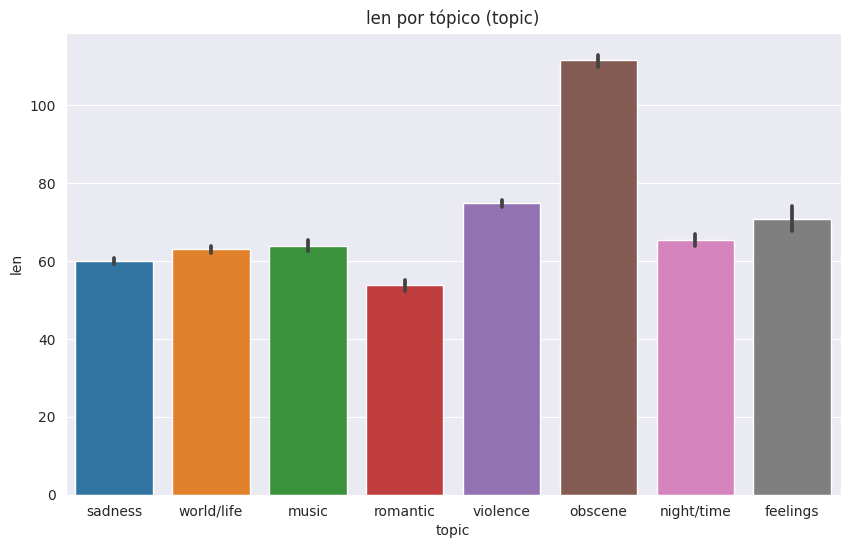

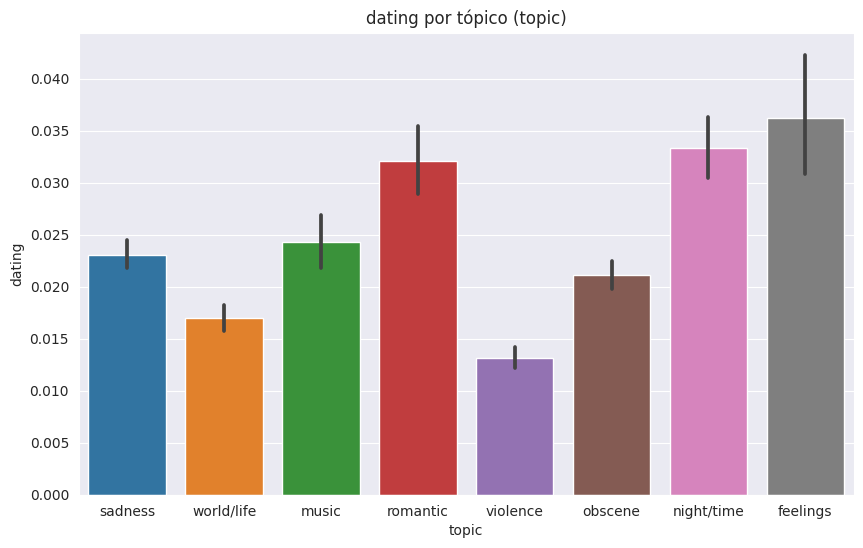

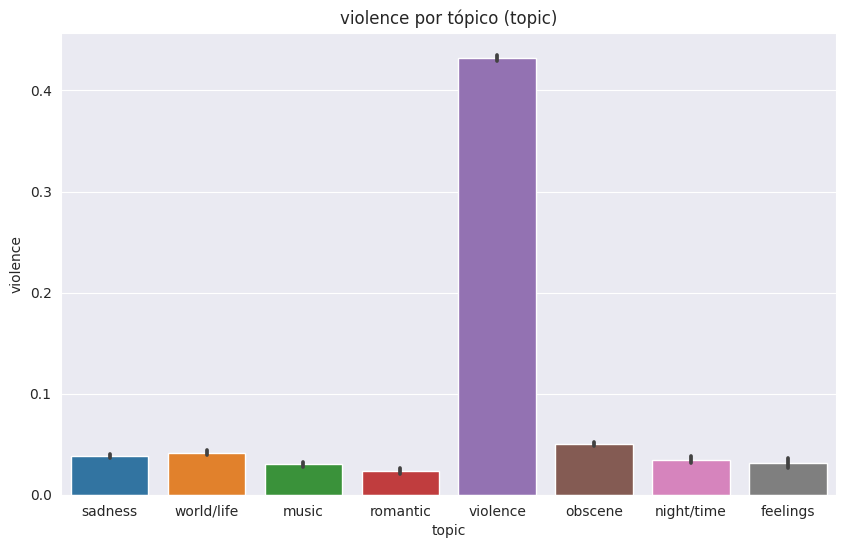

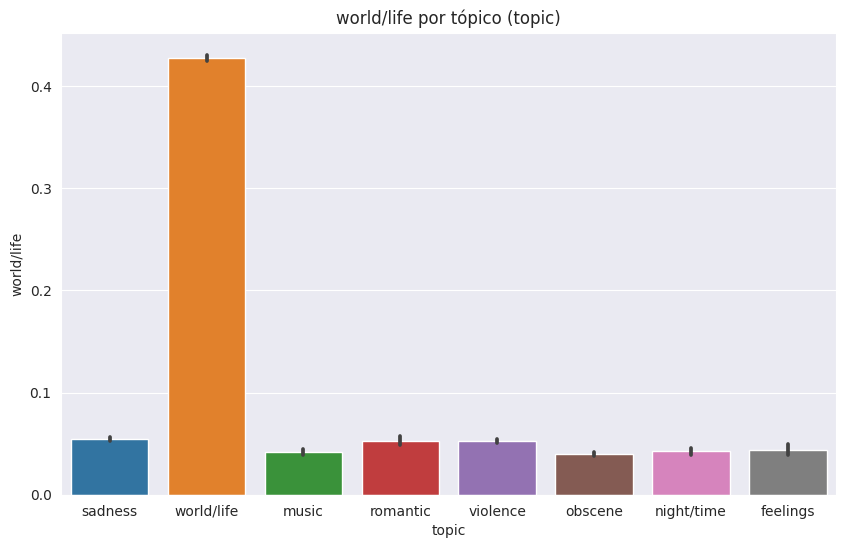

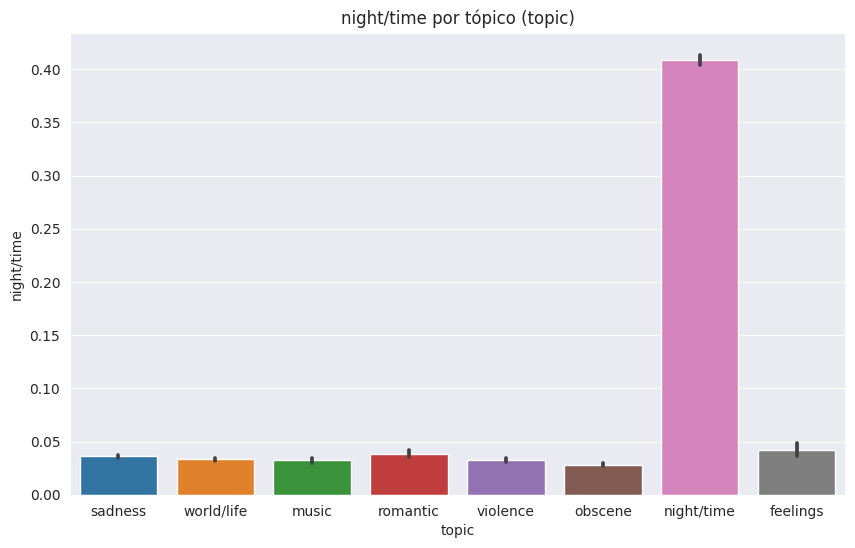

...

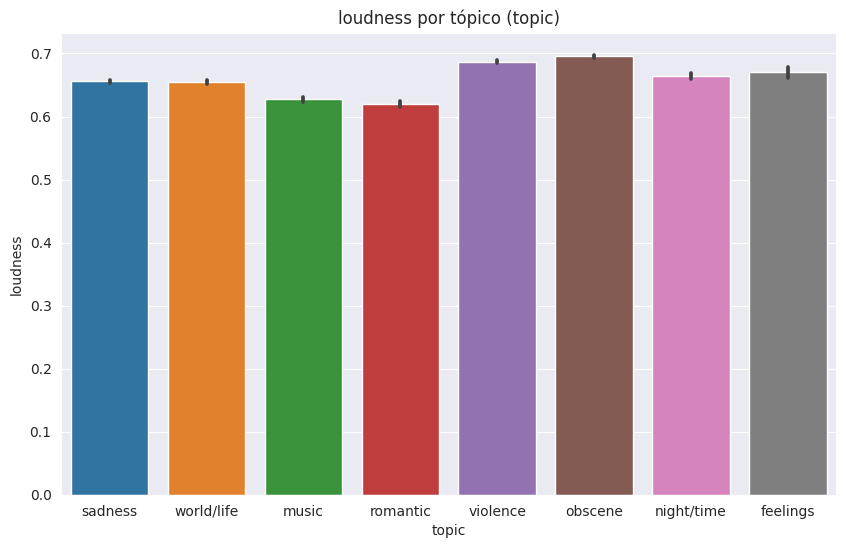

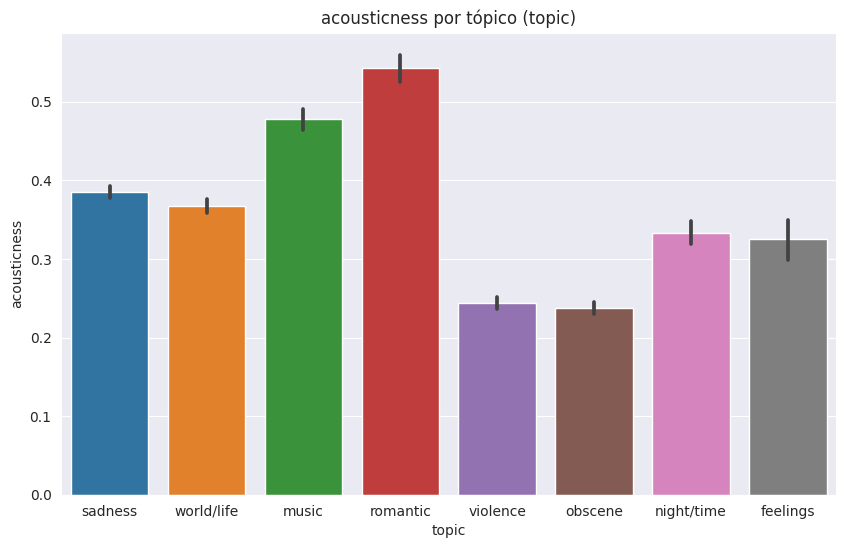

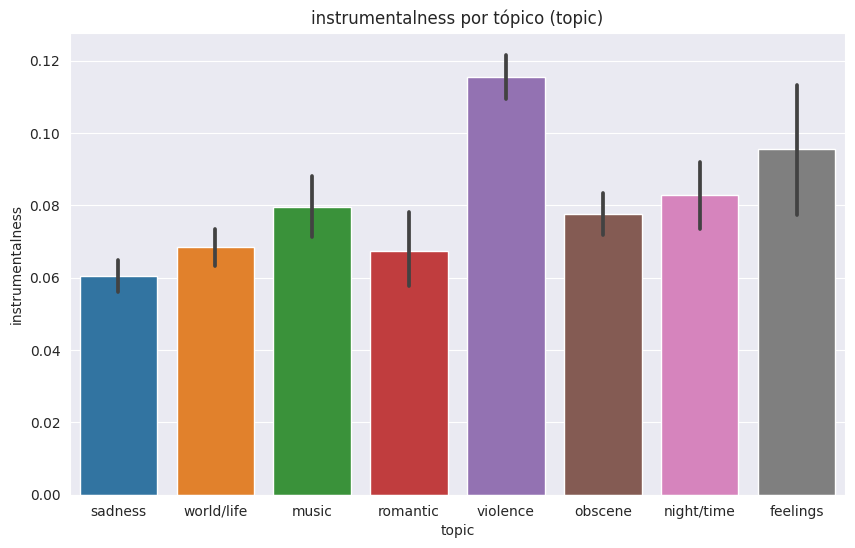

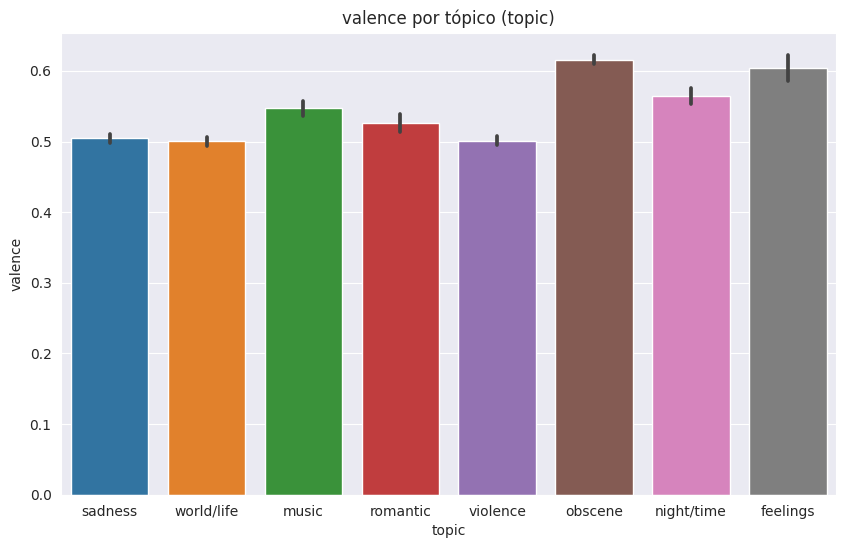

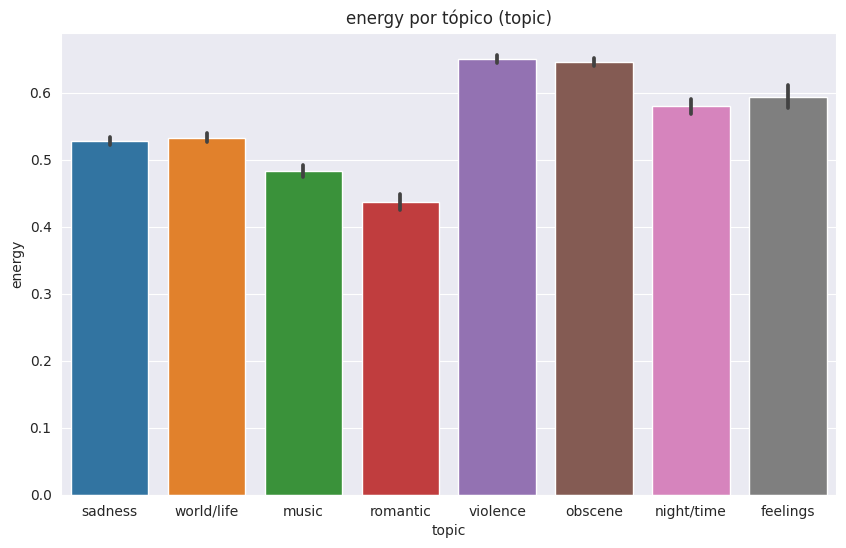

In [ ]:
for i in ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake_the_audience',
          'family/gospel', 'romantic', 'communication', 'obscene', 'music',
          'movement/places', 'light/visual_perceptions', 'family/spiritual',
          'like/girls', 'sadness', 'feelings', 'danceability', 'loudness',
          'acousticness', 'instrumentalness', 'valence', 'energy']:
    plt.figure(figsize = (10,6))
    sns.barplot(data=df, x='topic', y=i)
    plt.title(i+' por tópico (topic)')

As seguintes observações podem ser feitas a partir desses gráficos:
* Len: obscene tem uma média bem maior que as demais.
* Dating: feelings tem a menor média, enquanto violence tem uma média bem menor que as demais.
* Shake the audience: obscene e feelings têm uma média maior que as demais.
* Family/gospel: music tem a maior média.
* Communication: feelings tem a maior média e music, a menor.
* Movement/places: obscene tem média ligeiramente maior, enquanto para romantic, é bem menor que os demais tópicos.
* Light/visual perceptions: obscene tem média bem menor que os demais tópicos.
* Family/spiritual: violence tem a maior média.
* Like/girs: feelings tem a maior média.
* Danceability: obscene tem média ligeiramente maior que as demais.
* Loudness: a média é relativamente parecida entre todos os tópicos.
* Acousticness: romantic tem média maior que as demais e, violence e obscene, menor que as demais.
* Instrumentalness: violence tem média maior que as demais.
* Valence: obscene e feelings têm media ligeiramente maior que os demais.
* Energy: violence e obscene têm as maiores médias, enquanto romantic, a menor.


Os atributos sadness, world/life, music, romantic, violence, obscene, night/time e feelings estão relacionados com os tópicos com os mesmos nomes. Em todos os casos, o tópico com o mesmo nome que o atributo tem uma média bem maior que os demais tópicos. Para visualizar melhor a relação entre esses atributos e os demais tópicos, faremos os gráficos descartando as músicas na qual o tópico é igual ao atributo:

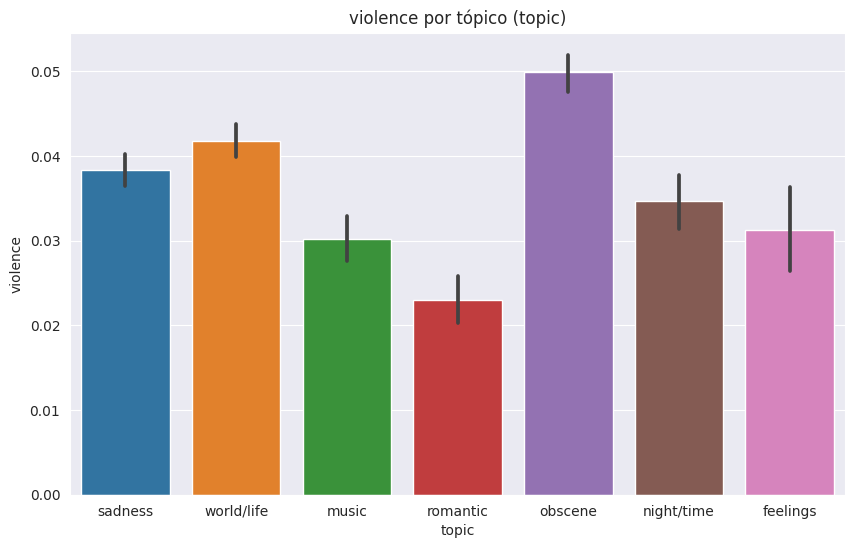

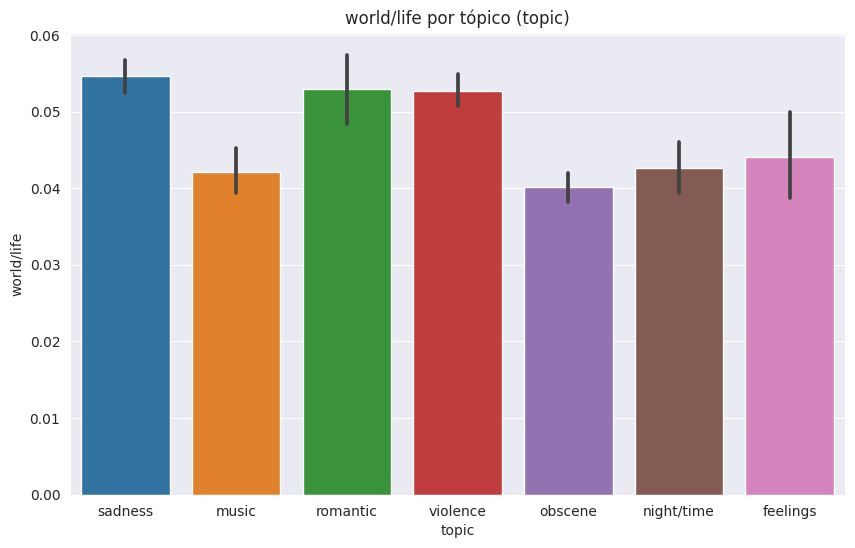

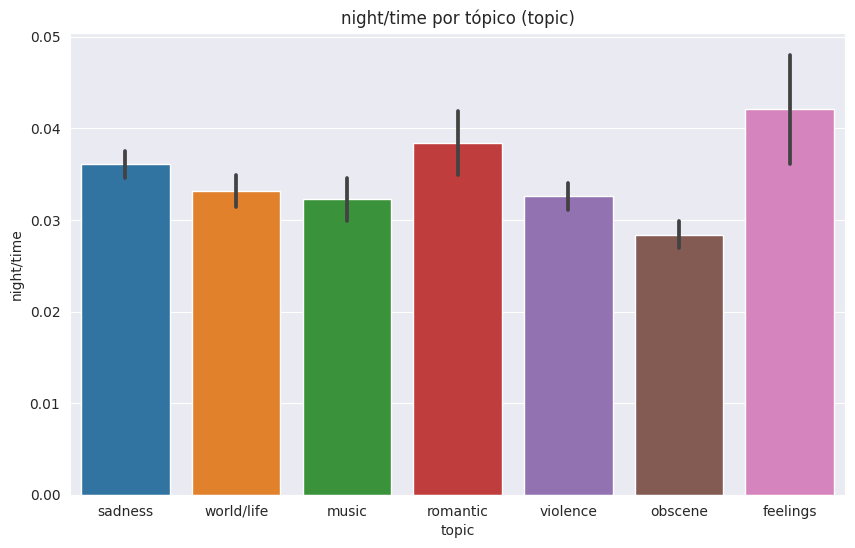

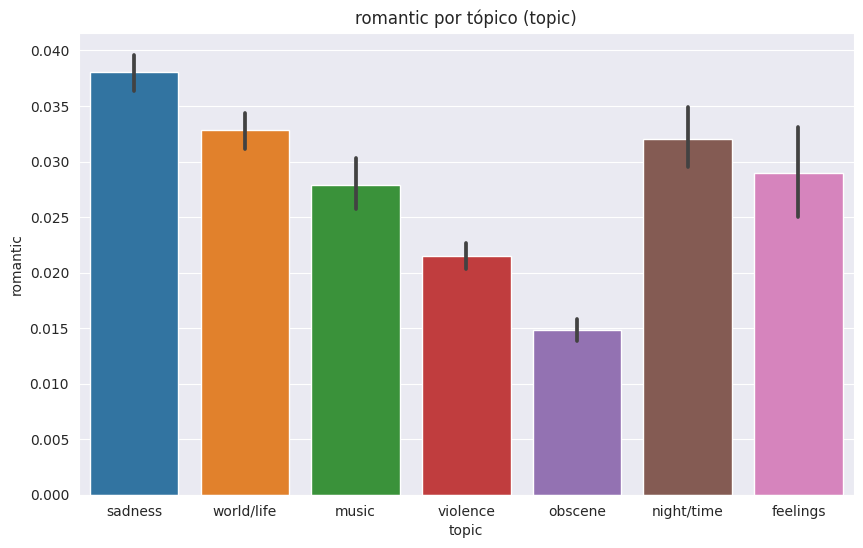

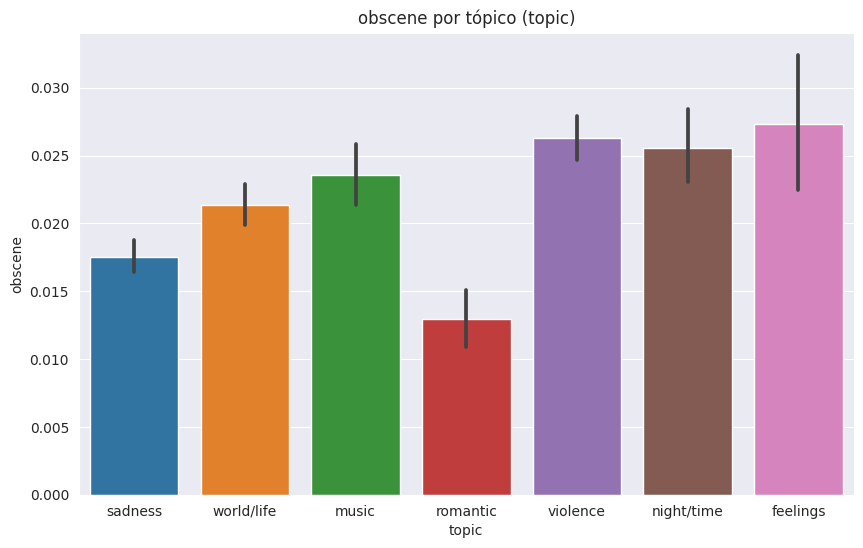

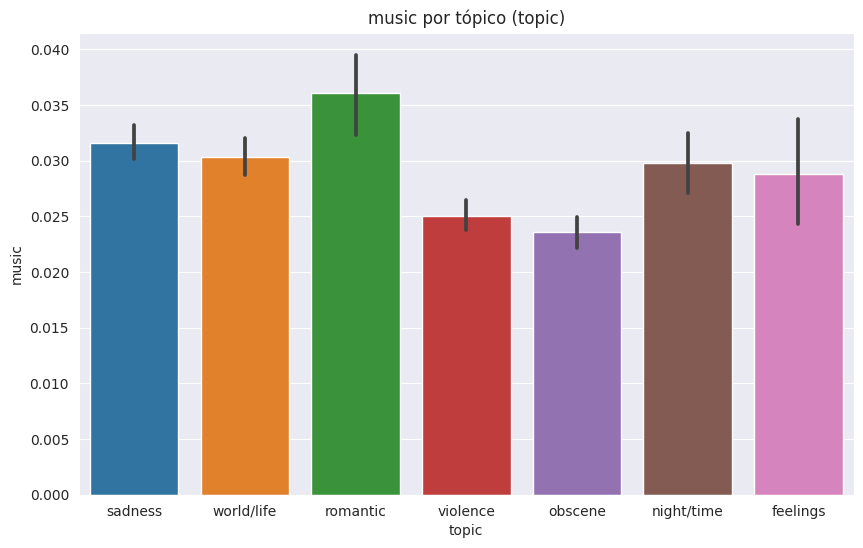

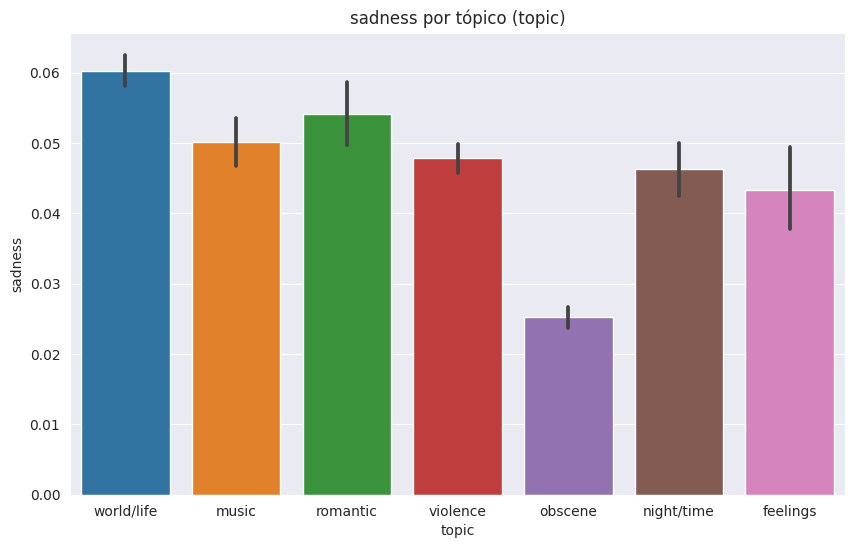

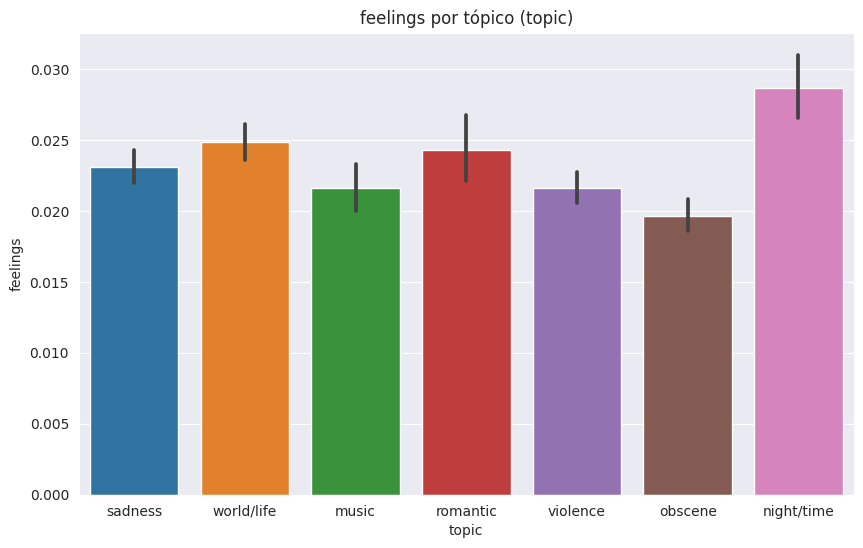

In [ ]:
for i in ['violence', 'world/life', 'night/time', 
          'romantic',  'obscene', 'music',
          'sadness', 'feelings']:
    plt.figure(figsize = (10,6))
    sns.barplot(data=df[df['topic'] != i], x='topic', y=i)
    plt.title(i+' por tópico (topic)')

As seguintes observações podem ser feitas:
* Violence: obscene tem uma média relativamente maior que os demais e romantic, menor.
* World/life: sadness, romantic e violence têm uma média relativamente maior que os demais.
* Night/time: feeling tem a maior média.
* Romantic: sadness tem a maior média e obscene, a menor.
* Obscene: romantic tem uma média bem menor que as demais.
* Music: romantic tem a maior média.
* Sadness: obscene tem média bem menor que os demais.
* Feelings: night/time tem média relativamente maior que os demais.


## Qual gênero se sobressaiu em cada década? 

Para realizar tal análise buscamos agrupar as músicas conforme a década que foram lançadas. Para isso construímos um loop que percorre o dataframe df, fornecendo o índice e a linha correspondente em cada iteração.

Dentro do loop, acessamos o valor da coluna 'release_date' para cada linha usando row['release_date'].

Em seguida, extraímos o ano da data usando .year. Essa operação nos dá um valor inteiro representando o ano de lançamento da música.

Para obter a década correspondente, pegamos a parte inteira da divisão e multiiplicamos por 10.

Finalmente, tomando como base o conceito de feature engineering, criamos a feature 'decade' e atribuímos o valor da década à coluna.

In [ ]:
df['decade'] = None

for index, row in df.iterrows():  
    year = row['release_date']
    decade = ((year // 10) * 10)
    df.at[index, 'decade'] = decade

# Agrupar por década e contar o número de ocorrências de cada gênero em cada década
df_genre_counts = df.groupby(['decade', 'genre']).size().reset_index(name='count')

In [ ]:
df_genre_counts

,decade,genre,count
0,1950,blues,360
1,1950,country,268
2,1950,jazz,408
3,1950,pop,323
4,1950,rock,107
5,1960,blues,567
6,1960,country,963
7,1960,jazz,404
8,1960,pop,1096
9,1960,reggae,80


Lembre-se que o df foi reduzido de 28372 para 28365 dado as 7 músicas pop removidas pelos valores ausentes. Vamos verificar se a coluna 'count' nos fornece esse valor. 

In [ ]:
df_genre_counts['count'].sum()

28365

## Visualizando a evolução dos gêneros no tempo

Criando um gráfico dos gêneros em relação à contagem de músicas presentes no df. 

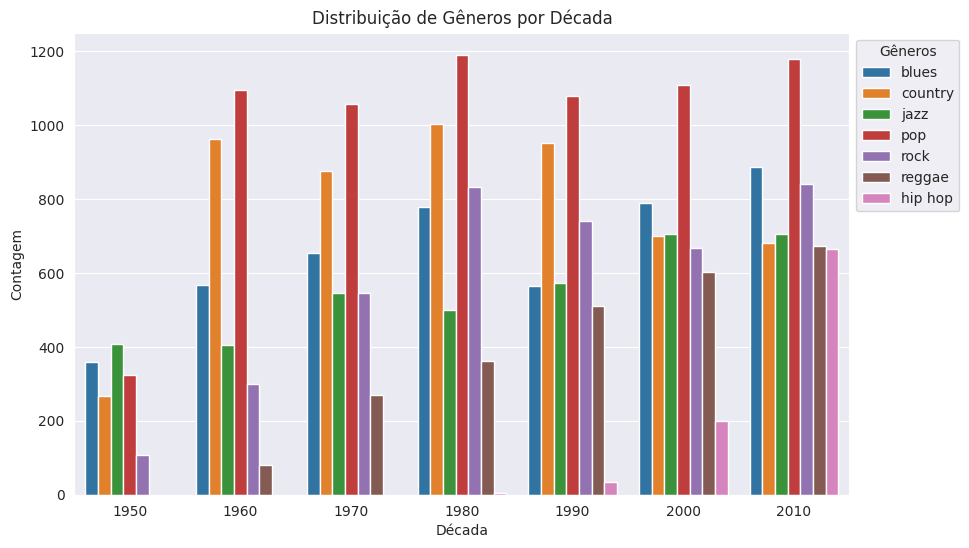

In [ ]:
plt.figure(figsize=(10, 6))

sns.barplot(x='decade', y='count', hue='genre', data=df_genre_counts)
plt.xlabel('Década')
plt.ylabel('Contagem')
plt.title('Distribuição de Gêneros por Década')
plt.legend(title='Gêneros', bbox_to_anchor=(1.0, 1)) 

plt.show()

Apresentando o comportamento com um gráfico de linha

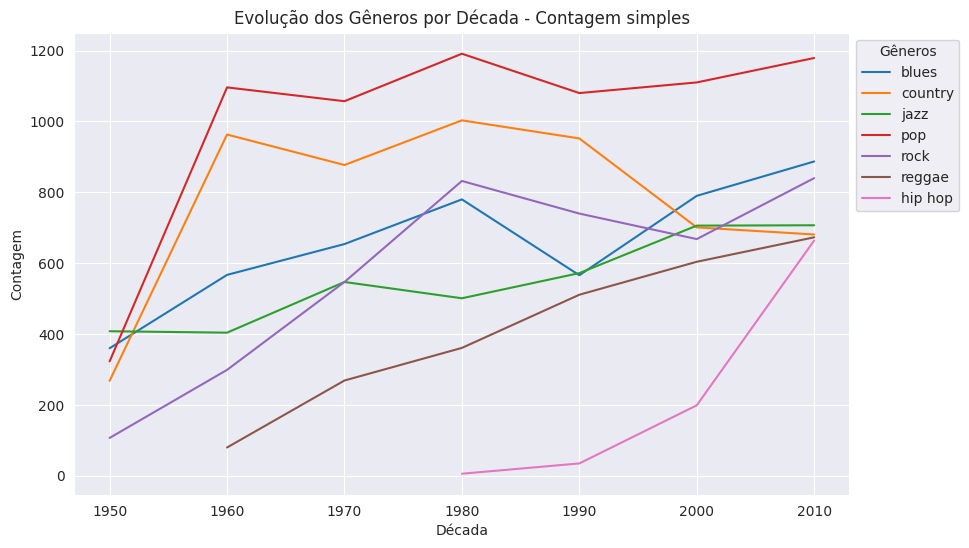

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='decade', y='count', hue='genre', data=df_genre_counts)

plt.xlabel('Década')
plt.ylabel('Contagem')
plt.title('Evolução dos Gêneros por Década - Contagem simples')
plt.legend(title='Gêneros', bbox_to_anchor=(1.0, 1)) 
plt.show()

No entanto, essa visualização pode não ser muito justa com os gêneros que não se sobressaíram tanto dado que a porcentagem das classes não são igualitárias.

Vamos refazer o gráfico acima utilizando a densidade de gêneros, ou seja, fazendo com que fiquem entre 0 e 1.

Detalhando a parte do código `.transform(lambda x: x / x.sum())` :

Como queremos obter a requência relativa, devemos dividir cada valor pelo total do seu respectivo grupo. Isso foi feito através da função lambda. 
Após, aplicamos `.transform()` para aplicar uma transformação em 'count' em cada grupo .

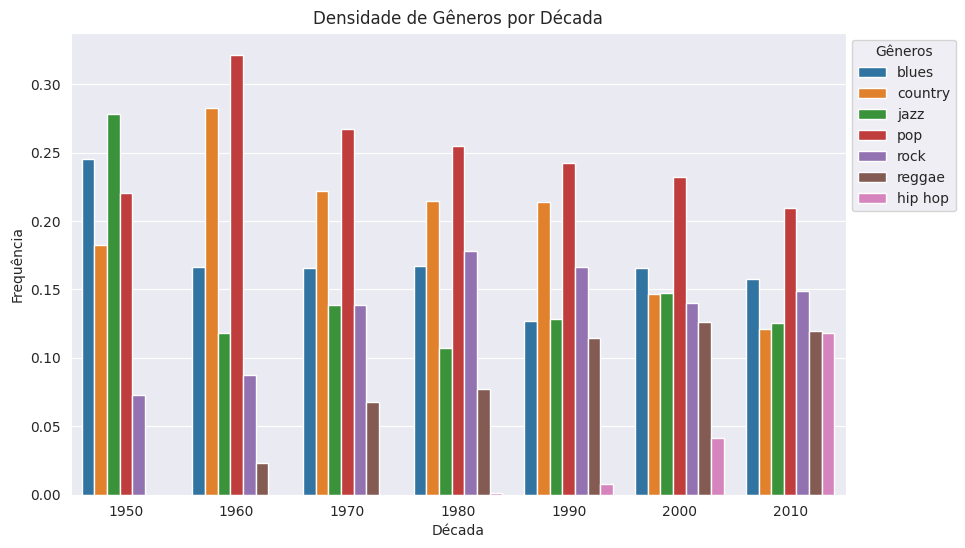

In [ ]:
# Frequencia relativa - cada grupo tem um sum(). Aplicamos com a função lambda
genre_freq = df_genre_counts.groupby('decade')['count'].transform(lambda x: x / x.sum())
df_genre_counts['frequency'] = genre_freq

plt.figure(figsize=(10, 6))
sns.barplot(x='decade', y='frequency', hue='genre', data=df_genre_counts)
plt.xlabel('Década')
plt.ylabel('Frequência')
plt.title('Densidade de Gêneros por Década')
plt.legend(title='Gêneros', bbox_to_anchor=(1.0, 1)) 

plt.show()

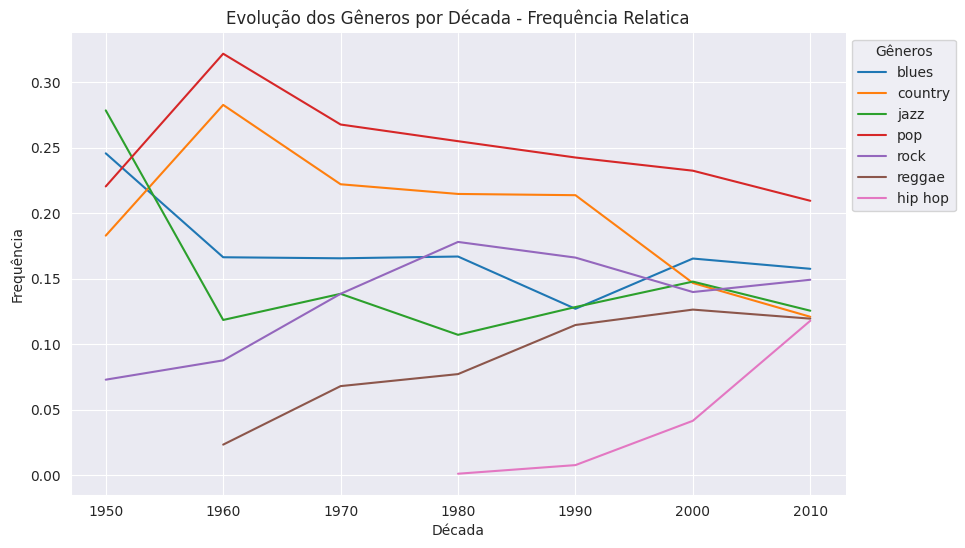

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='decade', y='frequency', hue='genre', data=df_genre_counts)
plt.xlabel('Década')
plt.ylabel('Frequência')
plt.title('Evolução dos Gêneros por Década - Frequência Relatica')
plt.legend(title='Gêneros', bbox_to_anchor=(1.0, 1)) 

sns.despine()
plt.show()

A partir dos gráficos anteriores podemos verificar o comportamento dos gêneros musicais no decorrer das décadas. 
- Pico do Pop na década de 60 e decrescimo desde então; 
- Apesar do decréscimo, pop ainda continua com maior frequência;
- Jazz tem uma grande queda a partir de 50 e se mantem num mesmo range a partir de 1960 com algumas oscilações;
- Pico do rock na década de 80;
- Queda da frequência relacionada ao Country; 
- Crescimento do Reggae a partir de 1960 e relativa estabilização a partir de 90;
- Crescimento expressivo do hip hop a partir da década de 80.


## Qual autor mais lançou músicas em cada década?

In [ ]:
author_counts = df.groupby(['decade', 'artist_name']).size().reset_index(name='songs_count')
author_counts

,decade,artist_name,songs_count
0,1950,a. m. rajah,2
1,1950,ahmad jamal,1
2,1950,andy williams,6
3,1950,anita o'day,7
4,1950,aretha franklin,4
...,...,...,...
8060,2010,zona ganjah,1
8061,2010,zontanoi nekroi,1
8062,2010,zoot sims,1
8063,2010,zul hip hop jam,3


In [ ]:
more_songs = author_counts.nlargest(5, 'songs_count')
print(more_songs)

     decade      artist_name  songs_count
60     1950  ella fitzgerald          126
48     1950      dean martin           80
477    1960      johnny cash           75
403    1960     george jones           70
685    1960   the beach boys           65


## Quais foram as músicas mais obscenas por década e quem são os autores?

In [ ]:
artist_genre_obscene_avg = df.groupby(['decade', 'artist_name', 'genre'])['obscene'].mean().reset_index()

In [ ]:
obscene_songs = artist_genre_obscene_avg.nlargest(5, 'obscene')
print(obscene_songs)

      decade         artist_name    genre   obscene
4412    2000          (hed) p.e.     rock  0.953647
6948    2010       evil ebenezer  hip hop  0.948944
4734    2000           club 1600     jazz  0.922254
7312    2010      julia michaels      pop  0.881579
8305    2010  the sugarhill gang  hip hop  0.875756


## Quais autores possuem músicas com maior caráter violento seus respectivos generos 

In [ ]:
artist_genre_violence_avg = df.groupby(['decade', 'artist_name', 'genre'])['violence'].mean().reset_index()

In [ ]:
violent_songs = artist_genre_violence_avg.nlargest(5, 'violence')
print(violent_songs)

      decade          artist_name    genre  violence
404     1960          eric morris   reggae  0.964912
6193    2000  tord gustavsen trio     jazz  0.947368
6123    2000          the stooges    blues  0.910486
7164    2010               j-live  hip hop  0.823307
6864    2010            dj tomekk  hip hop  0.806061


## Quais gêneros são mais "dançáveis" em cada década? 

In [ ]:
artist_genre_danceability_avg = df.groupby(['decade', 'artist_name', 'genre'])['danceability'].mean().reset_index()
artist_genre_danceability_avg

,decade,artist_name,genre,danceability
0,1950,a. m. rajah,pop,0.436261
1,1950,ahmad jamal,jazz,0.642586
2,1950,andy williams,pop,0.236435
3,1950,anita o'day,jazz,0.563986
4,1950,aretha franklin,blues,0.399708
...,...,...,...,...
8546,2010,zona ganjah,reggae,0.809379
8547,2010,zontanoi nekroi,hip hop,0.727066
8548,2010,zoot sims,jazz,0.419474
8549,2010,zul hip hop jam,hip hop,0.650529


In [ ]:
danceable_songs = artist_genre_danceability_avg.nlargest(5, 'danceability')
print(danceable_songs)

      decade        artist_name    genre  danceability
6169    2000          timbaland      pop      0.987003
5021    2000        georg levin     jazz      0.979422
7513    2010  machine gun kelly  hip hop      0.976172
7948    2010          rund.m.c.  hip hop      0.970757
7568    2010          mc hammer  hip hop      0.968591


In [ ]:
danceable_songs = artist_genre_danceability_avg.nsmallest(10, 'danceability')
print(danceable_songs)

      decade      artist_name genre  danceability
3310    1990   edge of sanity  jazz      0.014405
2086    1980             felt   pop      0.021878
1586    1970          suicide   pop      0.034333
4818    2000      dean martin  jazz      0.047980
1677    1970  the moody blues  rock      0.049063
157     1950   norrie paramor   pop      0.070725
5944    2000        sunn 0)))  jazz      0.073974
525     1960    johnny mathis   pop      0.084805
107     1950    johnny mathis  jazz      0.086971
6633    2010             bush   pop      0.088054


Note que temos musica pop com baixo grau de danceabilidade. Podemos verificar qual a correlação disso.

              danceability       len    dating  violence  world/life
danceability      1.000000  0.276743  0.037267 -0.097115   -0.071341
len               0.276743  1.000000 -0.021066  0.058214   -0.122416
dating            0.037267 -0.021066  1.000000 -0.107424   -0.073717
violence         -0.097115  0.058214 -0.107424  1.000000   -0.186782
world/life       -0.071341 -0.122416 -0.073717 -0.186782    1.000000


<ipython-input-144-643e2d98e9a9>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df[['danceability', 'genre', 'lyrics', 'len', 'dating', 'violence', 'world/life']].corr()


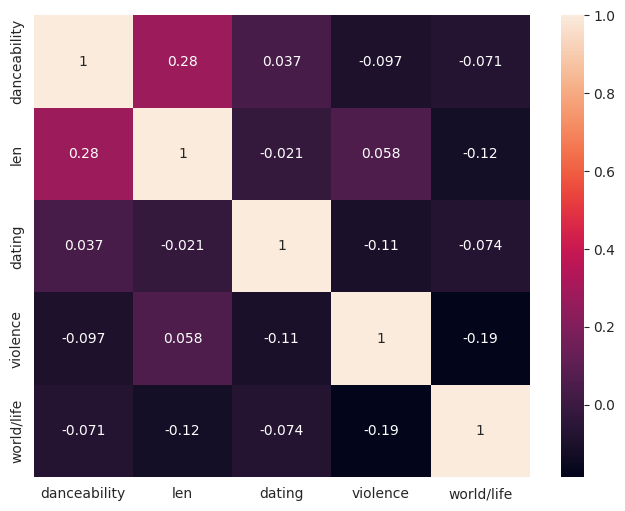

In [ ]:
correlation_matrix = df[['danceability', 'genre', 'lyrics', 'len', 'dating', 'violence', 'world/life']].corr()
print(correlation_matrix)
plt.figure(figsize = (8, 6))
sns.heatmap(correlation_matrix, annot=True);

Nota-se que a dançabilidade é inversamente proporcional à tópicos como violência e world/life. Além disso, há uma correlação positiva com a quantidade de palavras na letra da música (apesar de não ser uma grande correlação). 

## Analisando 'danceability' apenas por genero

In [ ]:
genre_mean_danceability = df.groupby('genre')['danceability'].mean().sort_values(ascending=False)

print(genre_mean_danceability)

genre
hip hop    0.728789
reggae     0.705711
country    0.539954
pop        0.525372
jazz       0.516471
blues      0.480965
rock       0.463605
Name: danceability, dtype: float64


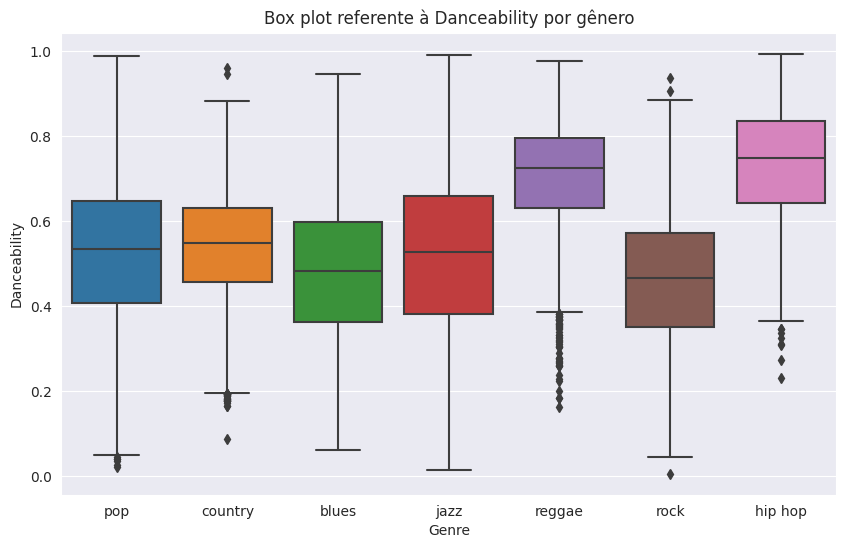

In [ ]:
plt.figure(figsize = (10,6))
sns.boxplot(x='genre', y='danceability', data=df)
plt.xlabel('Genre')
plt.ylabel('Danceability')
plt.title('Box plot referente à Danceability por gênero')
plt.show()

Dentre os gêneros presentes, observamos uma média relativamente próxima, cujos maiores valores são associados à hip hop e reggae, respectivamente. 
Apesar desses dois gêneros serem os com maiores médias, nota-se a presença de vários outliers inferiores (o que influencia para decrescimo da média) em reggae. 

Contrariando o esperado, vimos que pop não é o gênero com maior danceability nesse dataframe. Apesar disso, não podemos afirmar categoricamente tal análise posto que vimos que o df contém incongruências referentes ao processo de classificação.

## "Não se faz mais música como antigamente..."

É muito comum ouvirmos de pessoas mais velhas a máxima: "Não se faz mais música como antigamente...". Será mesmo que isso é verdade?

Tomando como base as medidas presentes no dataset (acústica, romanticidade, instrumentalidade, etc), buscamos analisar o comportamento dessas labels no tempo. 

Lembre-se que esse é um cenário limitado que possui músicas apenas em inglês, além de não possuir gêneros importantes da música brasileira como samba, funk, axé, bossa nova, etc. É extremamente necessário manter em mente que esse é apenas um recorte construido a partir da base de dados utilizada. 

In [ ]:
decade_avg = df.groupby('decade')[['acousticness', 'instrumentalness', 'music', 'romantic','violence', 'obscene', 'sadness']].mean()
decade_avg

,acousticness,instrumentalness,music,romantic,violence,obscene,sadness
decade,,,,,,,
1950,0.804667,0.079488,0.105362,0.121303,0.057582,0.057558,0.141303
1960,0.622914,0.051580,0.084773,0.081477,0.066468,0.054842,0.154476
1970,0.371590,0.086485,0.077300,0.050219,0.101586,0.065129,0.118324
1980,0.263348,0.085757,0.054105,0.045166,0.132262,0.075070,0.145041
1990,0.279857,0.091324,0.052903,0.042497,0.128463,0.098405,0.135137
2000,0.248177,0.090238,0.050418,0.035089,0.139108,0.112398,0.121571
2010,0.210393,0.070707,0.039931,0.028194,0.140535,0.160010,0.107926


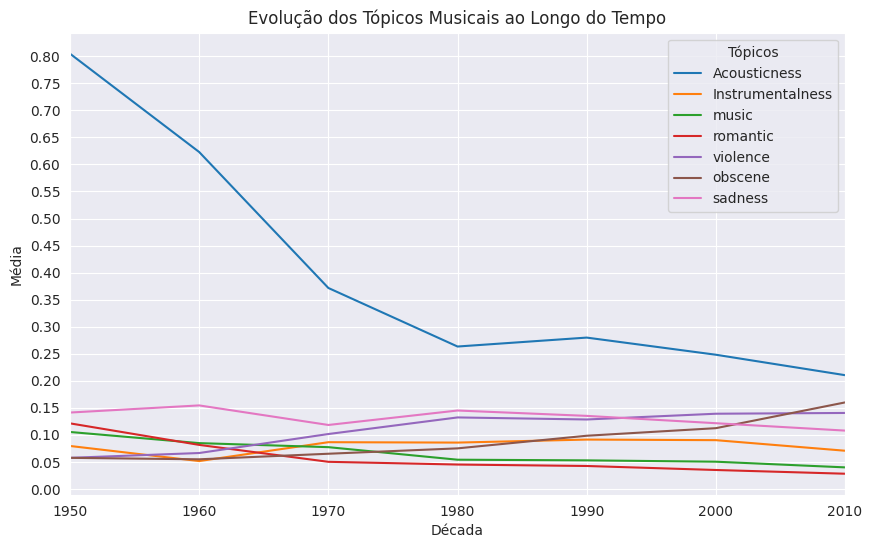

In [ ]:
plt.figure(figsize=(10, 6))

decade_avg['acousticness'].plot(label='Acousticness')
decade_avg['instrumentalness'].plot(label='Instrumentalness')
decade_avg['music'].plot(label='music')
decade_avg['romantic'].plot(label='romantic')
decade_avg['violence'].plot(label='violence')
decade_avg['obscene'].plot(label='obscene')
decade_avg['sadness'].plot(label='sadness')

plt.title('Evolução dos Tópicos Musicais ao Longo do Tempo')
plt.legend(title='Tópicos') 

plt.xlabel('Década')
plt.ylabel('Média')

plt.yticks(np.arange(0, 0.85, 0.05))
plt.xlim(1950, 2010)
plt.show()

Do grafico anterior podemos observar uma queda abrupta da acustica média no decorrer dos anos (aproximadamente de 0.8 para 0.20). Além disso, uma ascensão considerável da obscenidade (aproximadamente 0,05 para 0,16) e da violência (0,05 para 0,15 aproximadament). Os demais aspectos oscilaram no tempo, mas não se sobressaíram tanto quanto essas medidas anteriores. 

Portanto, podemos concordar com nossos familiares quando ouvirmos alguma frase que critica as músicas atuais referente à aspectos técnicos e caráter obsceno/violento, por exemplo. 

Além disso, "acústica" no df é referente a músicas feitas com instrumentistas reais e não com instrumentos sintetizados (não é o "acústico" do qual estamos acostumados, referido a músicas com instrumentos mais 'sertanejos' como violão). É possível ver com bons olhos o fato das músicas serem tocadas por pessoas em vez de máquinas, sendo este outro fator que afeta na impressão que temos de que as músicas atuais são inferiores, também por serem sintetizadas demais.

Vamos analisar individualmente 

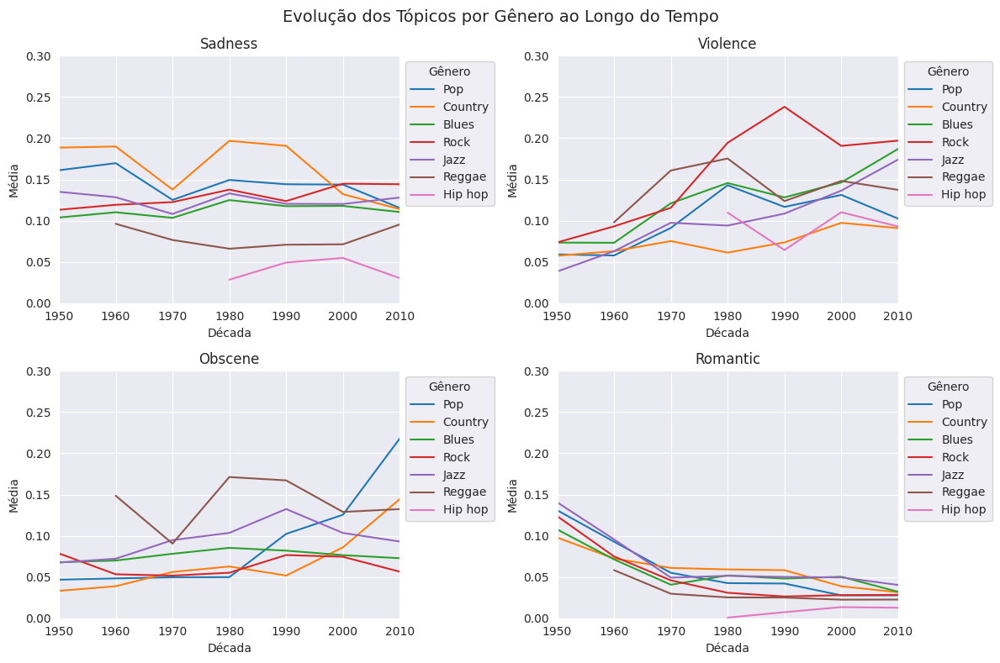

In [ ]:
rotulos = ['sadness', 'violence', 'obscene', 'romantic']

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Evolução dos Tópicos por Gênero ao Longo do Tempo', fontsize=14)

for i, rotulos in enumerate(rotulos):
    ax = axes[i // 2, i % 2]  # posição do subgráfico no grid
    ax.set_title(rotulos.capitalize())  # titulo de cada subgrafo
    for genre in generos:
        genre_data = df[df['genre'] == genre].groupby('decade')[rotulos].mean()
        genre_data.plot(ax=ax, label=genre.capitalize())

    ax.set_xlabel('Década')
    ax.set_ylabel('Média')
    ax.legend(title='Gênero', bbox_to_anchor=(1, 1), loc='upper left')
    ax.set_ylim(0, 0.3)
    ax.set_xlim(1950, 2010)

plt.tight_layout()  # ajustar o espaçamento entre os subgraficos
#plt.subplots_adjust(wspace=0.7)
plt.show()


## Gráfico radar para visualizar medidas resumo 

In [ ]:
categories = ['danceability', 'dating', 'violence', 'shake_the_audience',
              'sadness', 'feelings', 'loudness', 'acousticness', 'instrumentalness',
              'valence', 'energy', 'light/visual_perceptions']

N = len(categories)

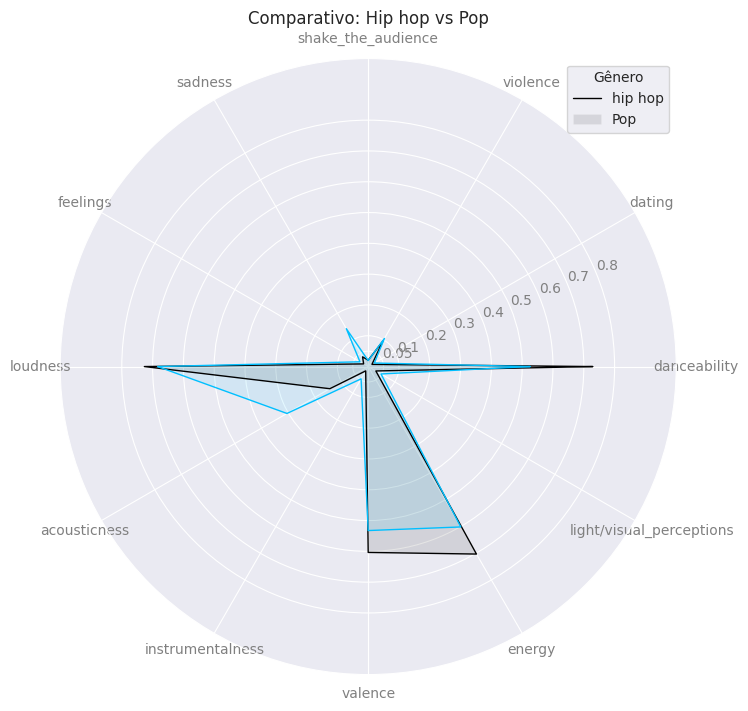

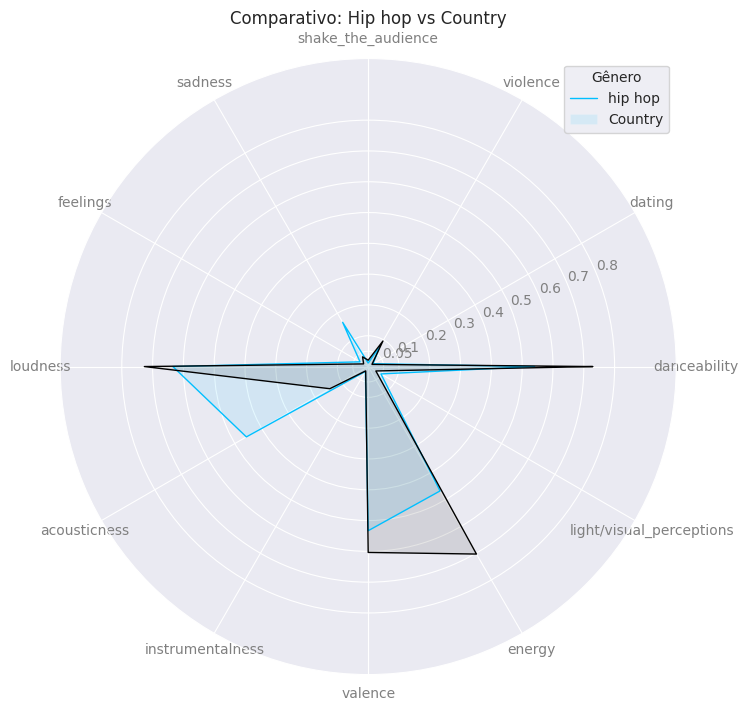

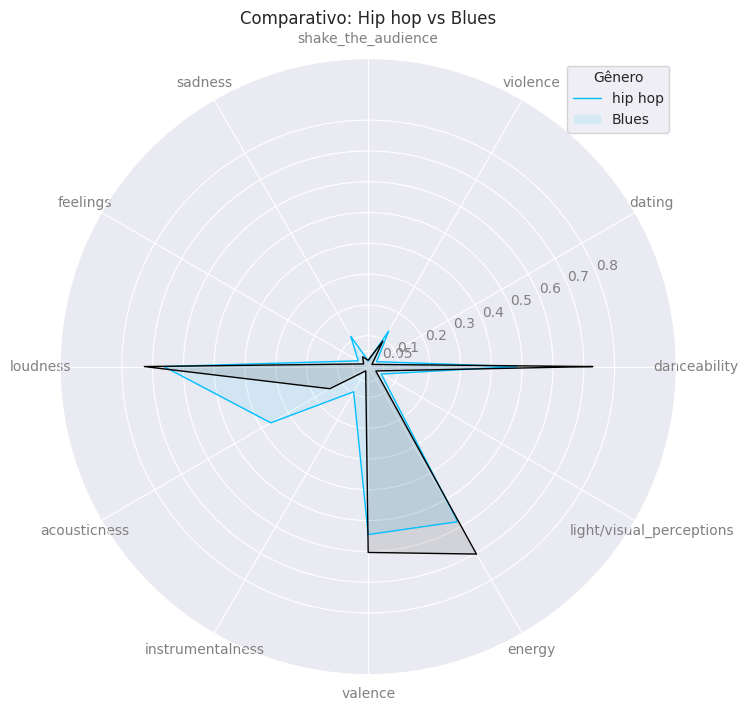

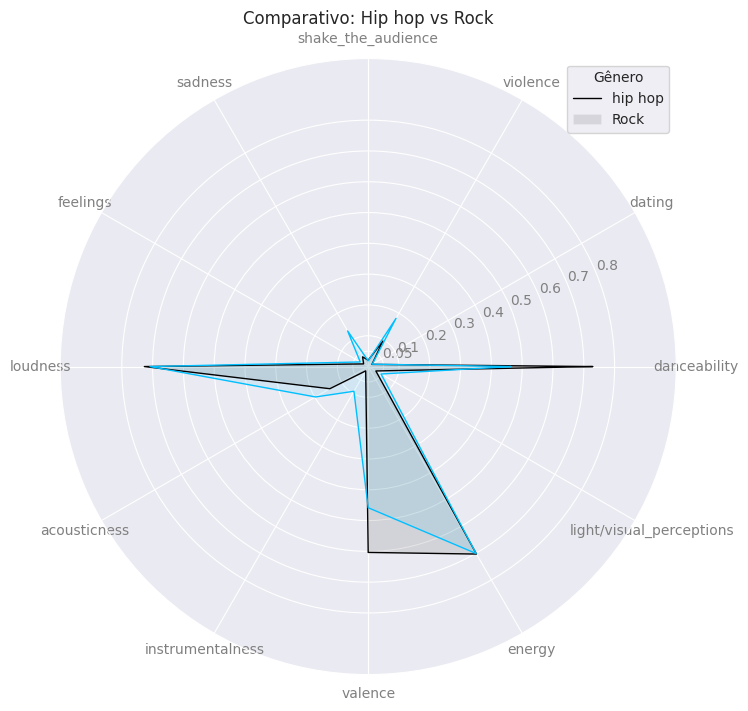

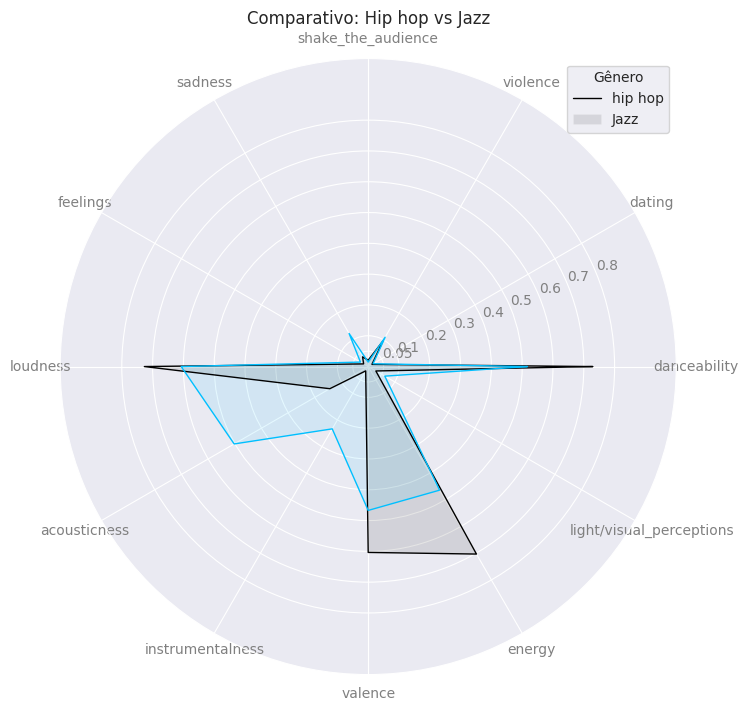

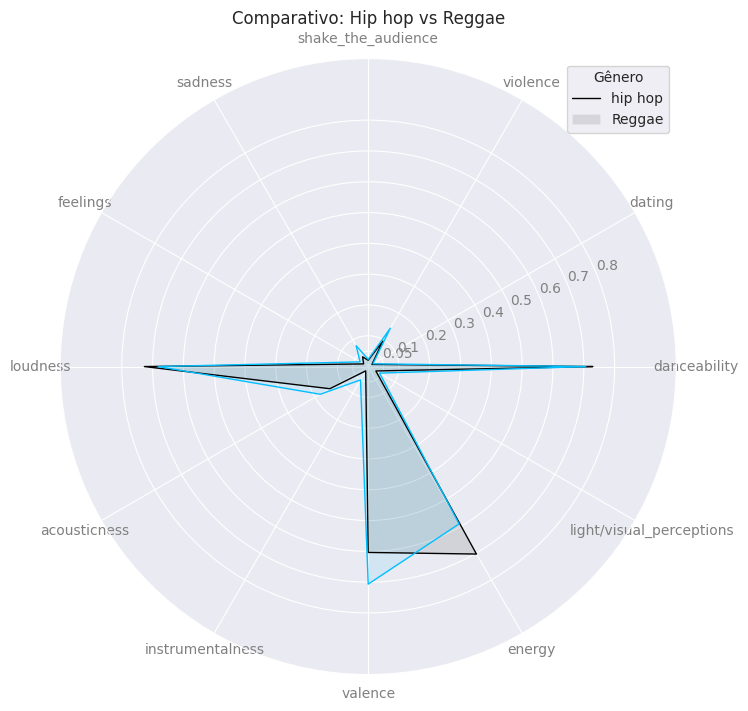

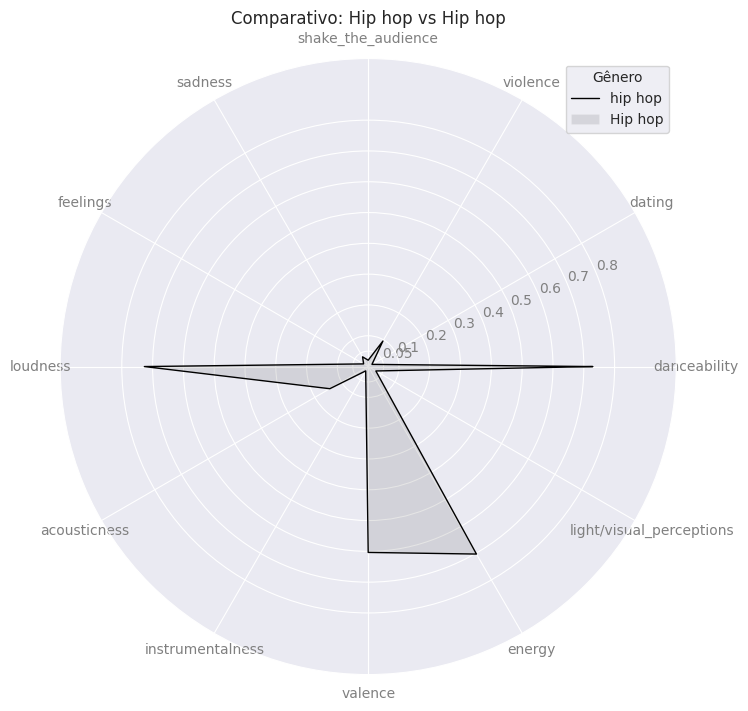

In [ ]:
for genre in generos:

    filtered_hiphop = df[df['genre'].isin(['hip hop', genre])]
    grouped_hiphop = filtered_hiphop.groupby('genre')[categories].mean()

    # gera uma lista de ângulos com igual espaçamento de 0 a 2pi conforme o N (número de categorias que estamos avaliando)
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()

    # adiciona o primeiro ângulo da lista angles novamente ao final -> grafico fechado
    angles += angles[:1]

    # duvida aqui 
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for indice, rotulo in enumerate(grouped_hiphop.index):
        values = grouped_hiphop.loc[rotulo].values.tolist()
        values += values[:1]
        if rotulo == 'hip hop':
            color = 'black'
        else:
            color = 'deepskyblue'
        ax.plot(angles, values, linewidth=1, linestyle='solid', color=color)
        ax.fill(angles, values, color, alpha=0.1) 

    # exclui o ultimo ponto para não repetir (já inserimos no angles += angles[:1])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color='grey', size=10)

    ax.set_yticks([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8])
    ax.set_yticklabels(['0.05', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8'], color='grey', size=10)
    ax.set_ylim(0, 1)
    
    ax.set_title(f'Comparativo: Hip hop vs {genre.capitalize()}')
    legend_labels = ['hip hop', genre.capitalize()]
    ax.legend(legend_labels, loc='upper right', title='Gênero')

    plt.show()


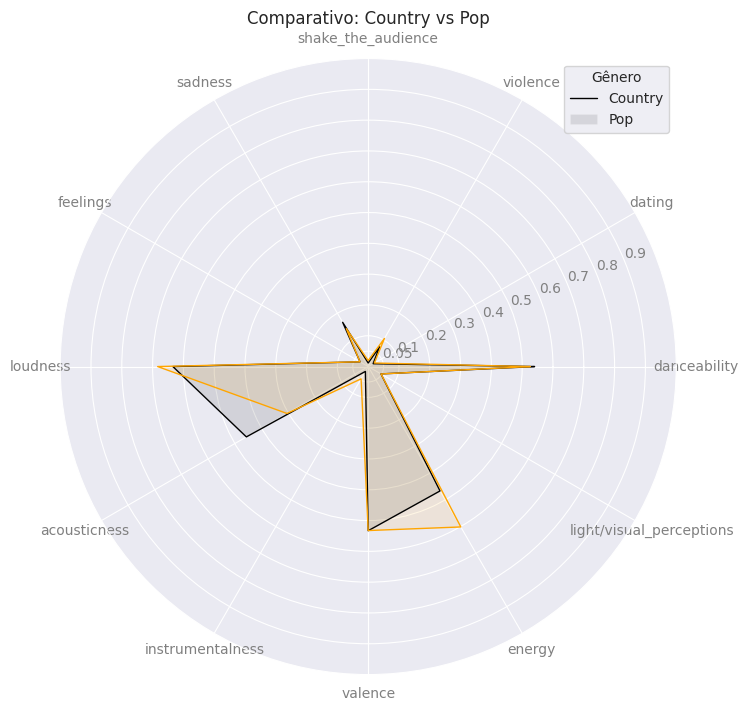

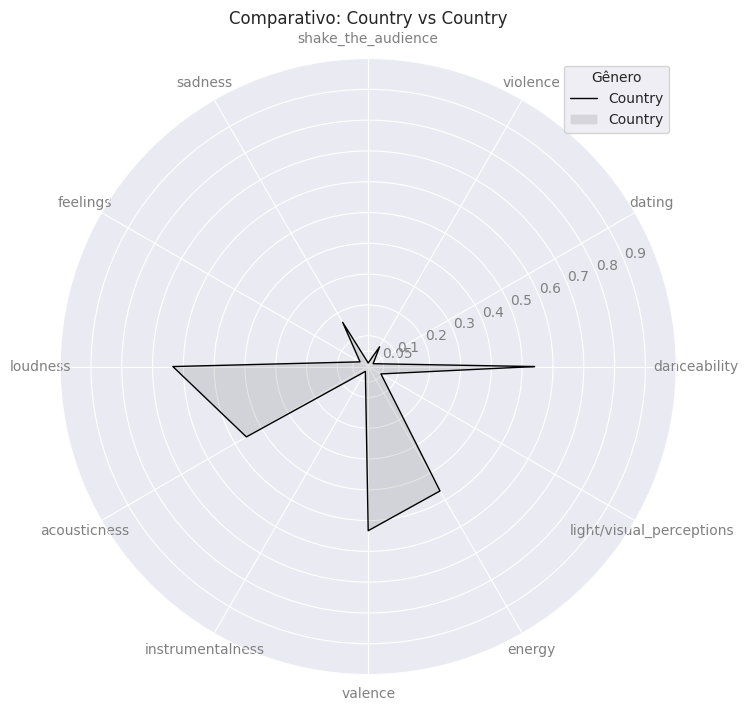

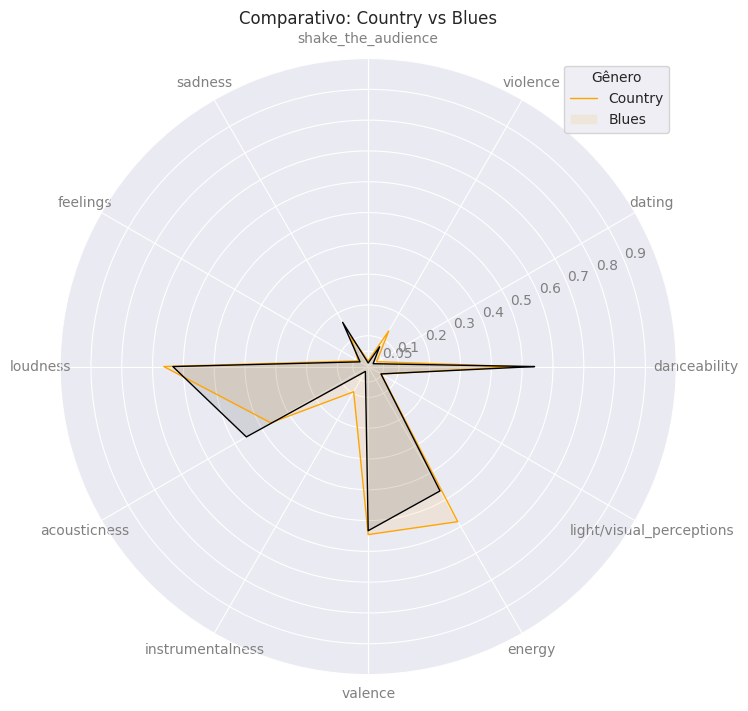

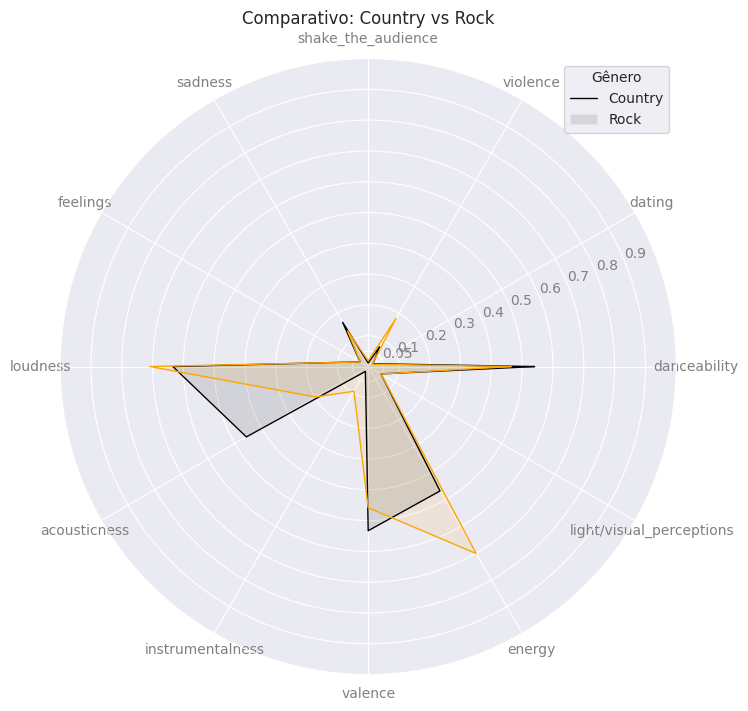

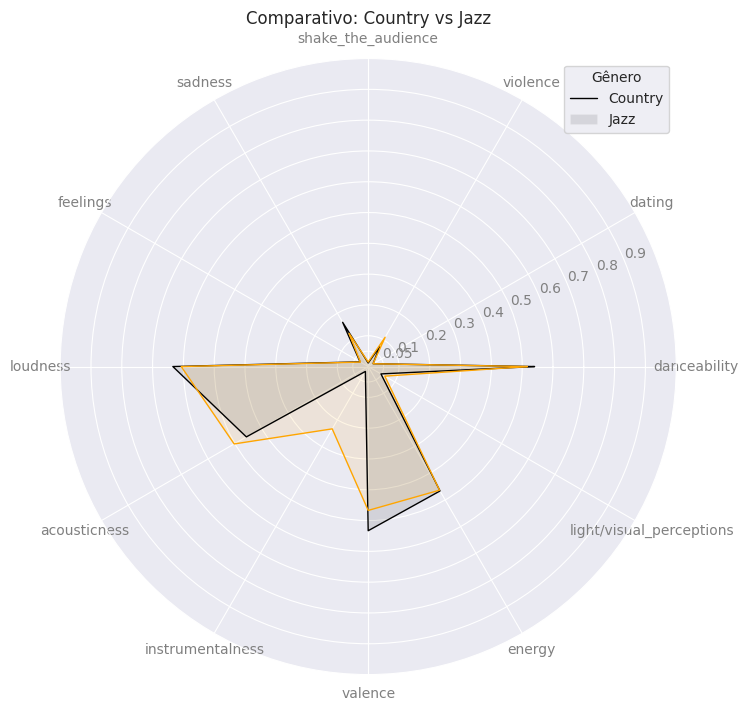

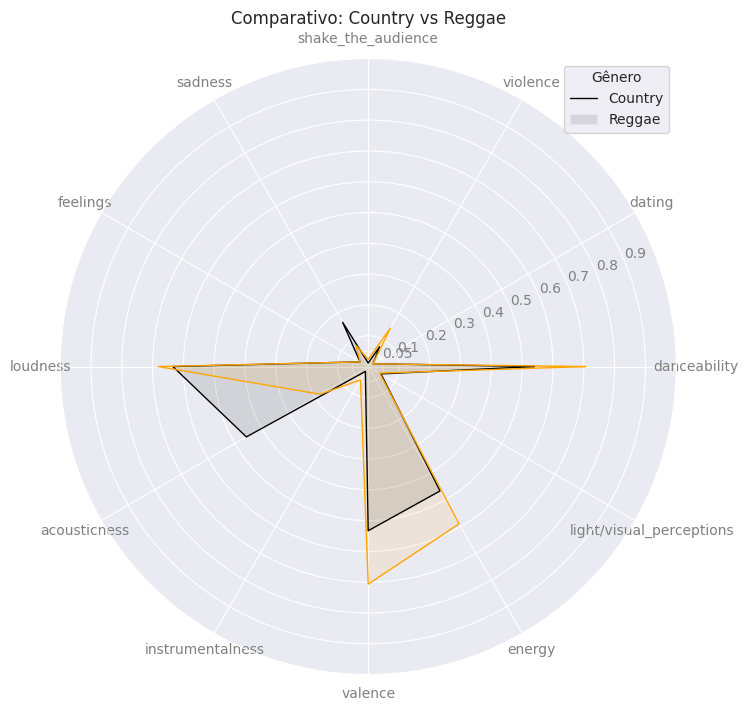

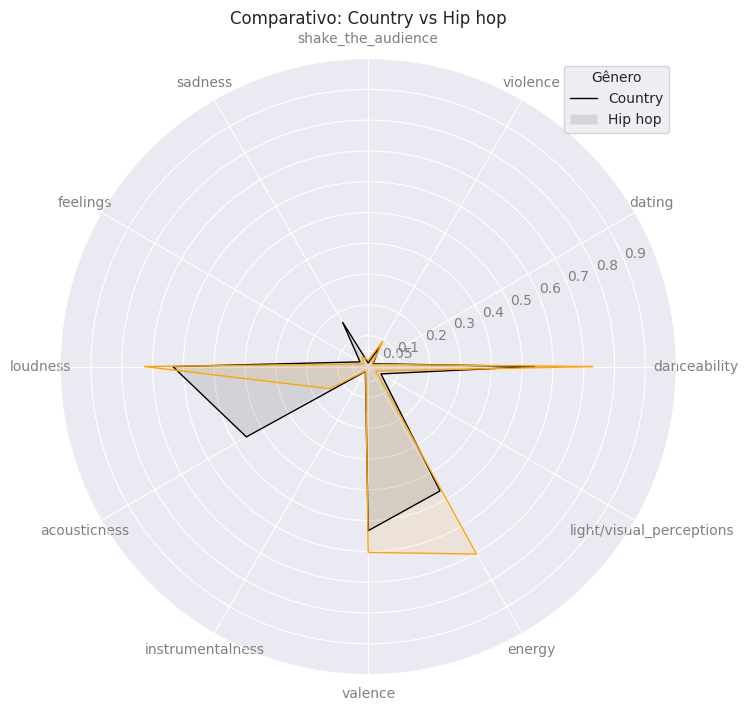

In [ ]:
for genre in generos:

    filtered_country = df[df['genre'].isin(['country', genre])]
    grouped_country = filtered_country.groupby('genre')[categories].mean()

    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for i, rotulo in enumerate(grouped_country.index):
        values = grouped_country.loc[rotulo].values.tolist()
        values += values[:1]
        if rotulo == 'country':
            color = 'black'
        else:
            color = 'orange'
        ax.plot(angles, values, linewidth=1, linestyle='solid', color=color)
        ax.fill(angles, values, color, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color='grey', size=10)
    ax.set_yticks([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
    ax.set_yticklabels(['0.05', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'], color='grey', size=10)
    ax.set_ylim(0, 1)
    ax.set_title('Comparativo: Country vs {}'.format(genre.capitalize()))
    legend_labels = ['Country', genre.capitalize()]
    ax.legend(legend_labels, loc='upper right', title='Gênero')

    plt.show()


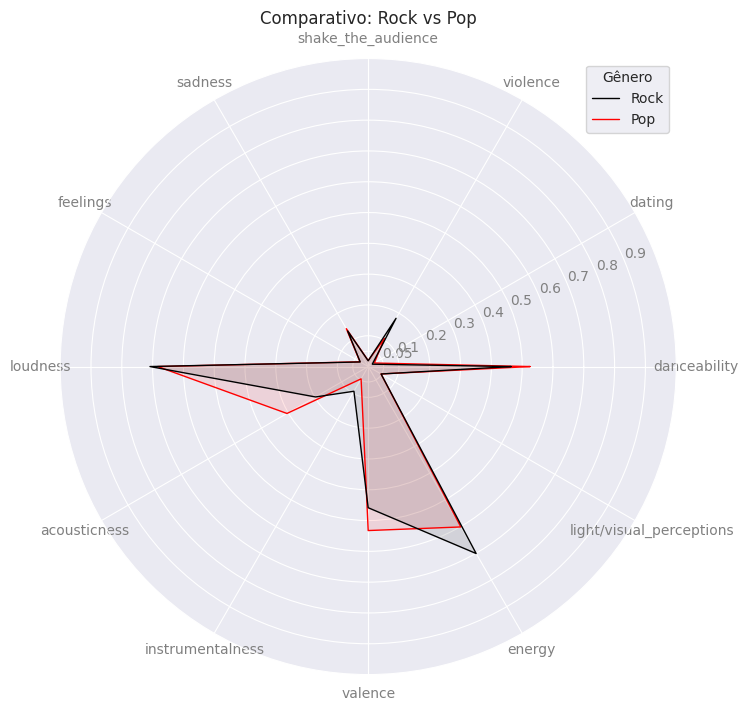

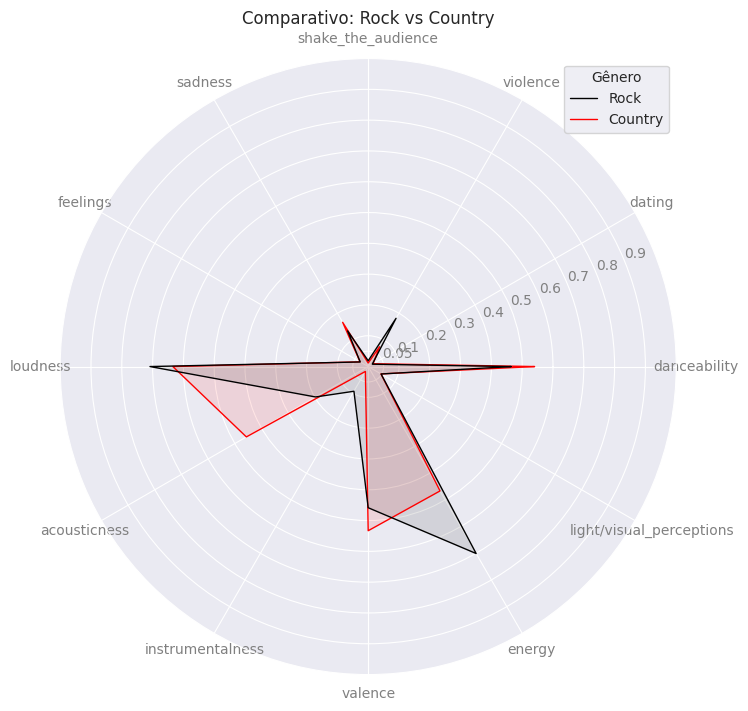

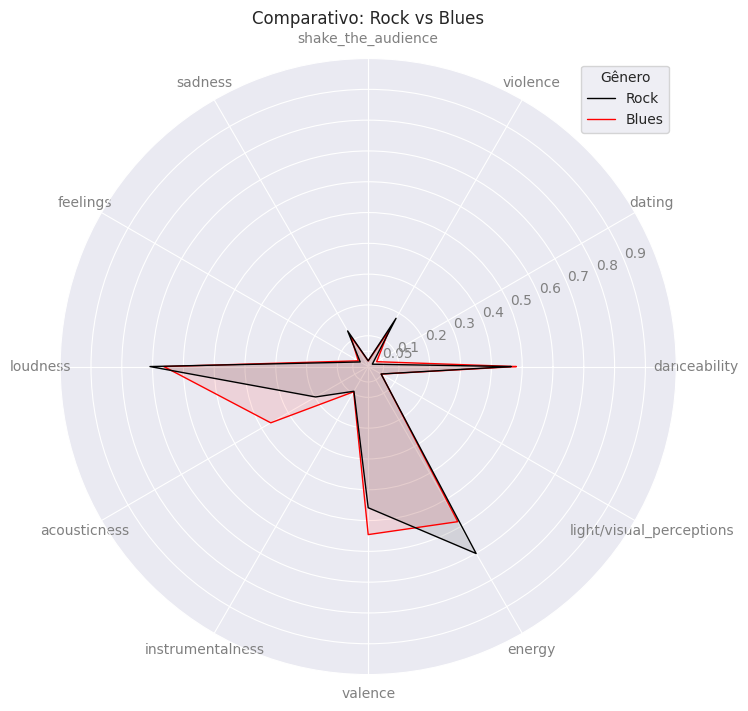

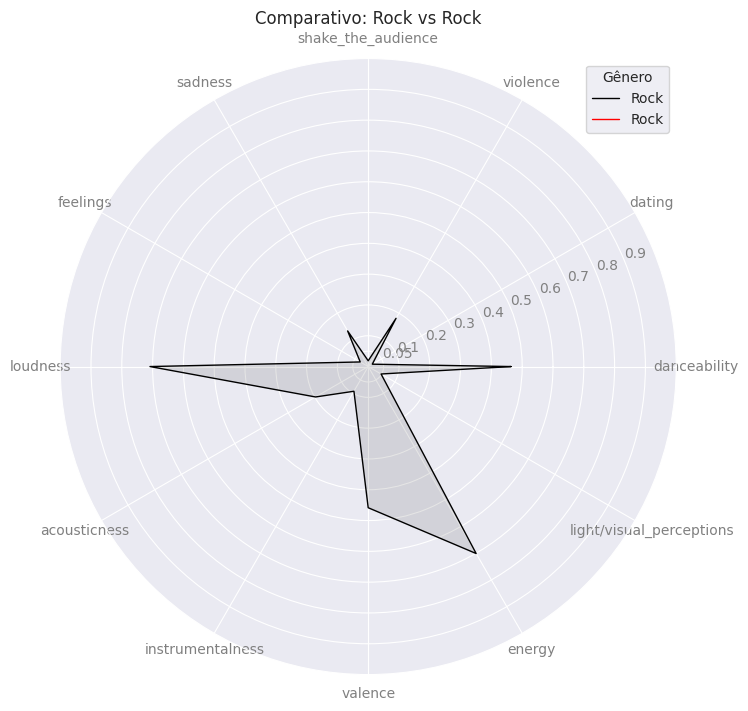

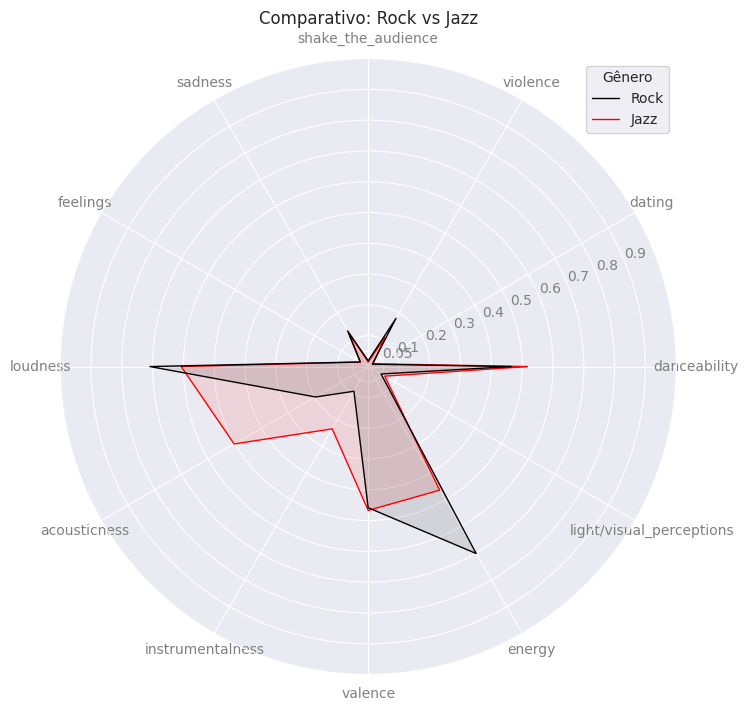

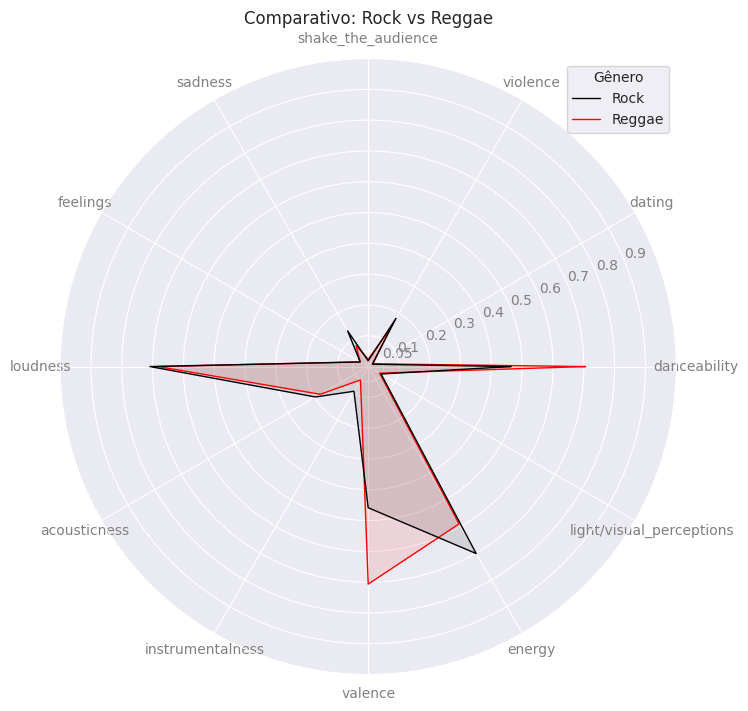

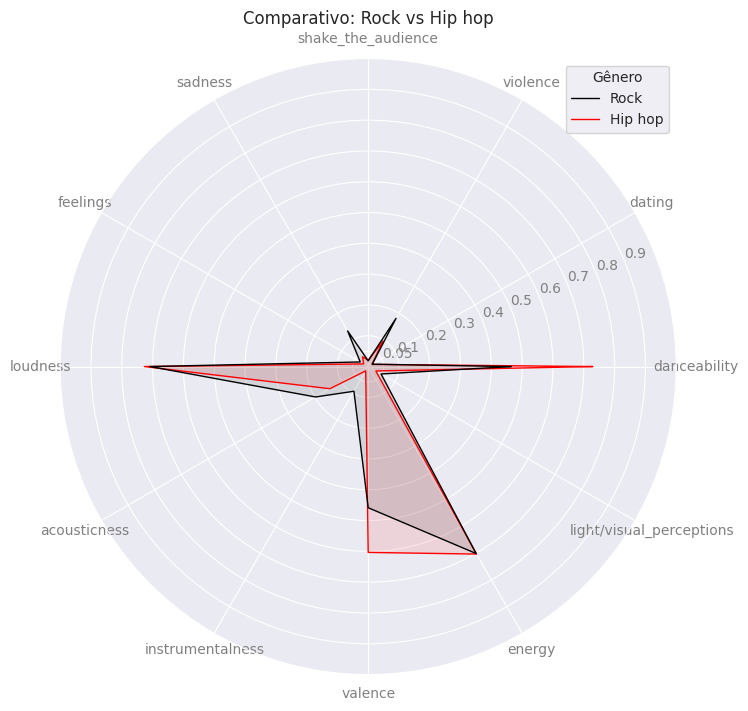

In [ ]:
for genre in generos:

    filtered_rock = df[df['genre'].isin(['rock', genre])]
    grouped_rock = filtered_rock.groupby('genre')[categories].mean()

    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for i, rotulo in enumerate(grouped_rock.index):
        values = grouped_rock.loc[rotulo].values.tolist()
        values += values[:1]
        if rotulo == 'rock':
            color = 'black'
        else:
            color = 'red'
        ax.plot(angles, values, linewidth=1, linestyle='solid', color=color)
        ax.fill(angles, values, color, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color='grey', size=10)
    ax.set_yticks([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
    ax.set_yticklabels(['0.05', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'], color='grey', size=10)
    ax.set_ylim(0, 1)
    ax.set_title(f'Comparativo: Rock vs {genre.capitalize()}')
    legend_labels = ['Rock', genre.capitalize()]
    #ax.legend(legend_labels, loc='upper right', title='Gênero')

    # Solução que encontrei para corrigir a cor da legenda
    legend_labels = ['Rock', genre.capitalize()]
    legend_lines = [Line2D([0], [0], color='black', linewidth=1, linestyle='solid'),
                Line2D([0], [0], color='red', linewidth=1, linestyle='solid')]

    ax.legend(legend_lines, legend_labels, loc='upper right', title='Gênero')
    plt.show()

In [ ]:
from matplotlib.lines import Line2D

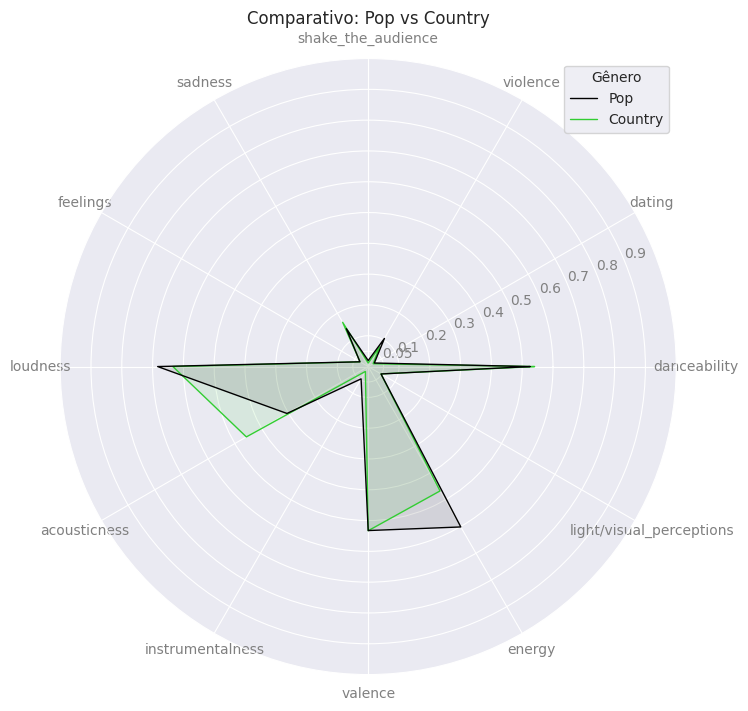

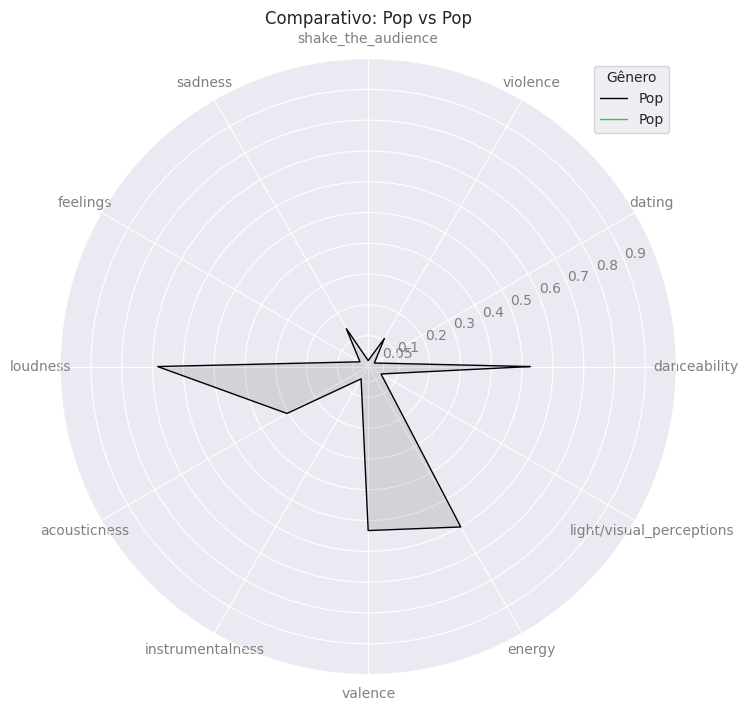

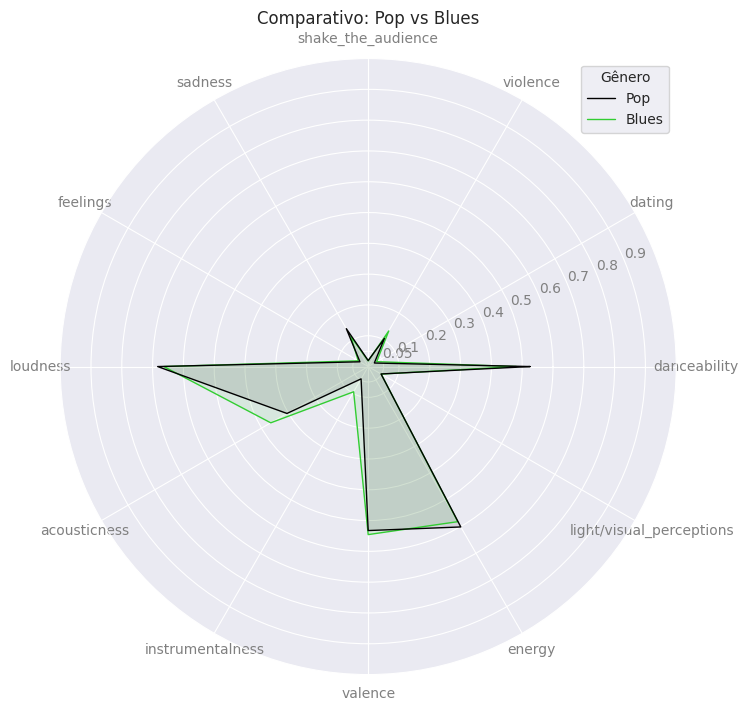

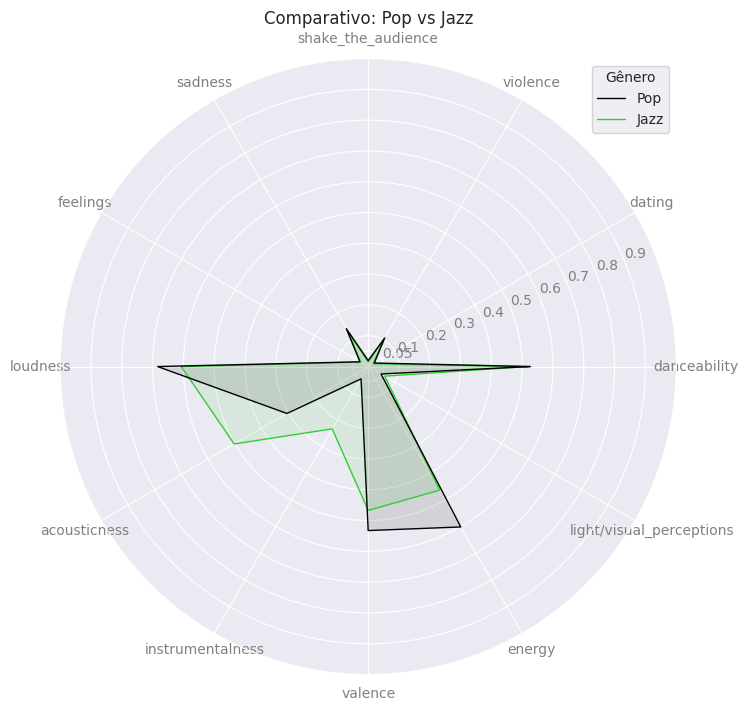

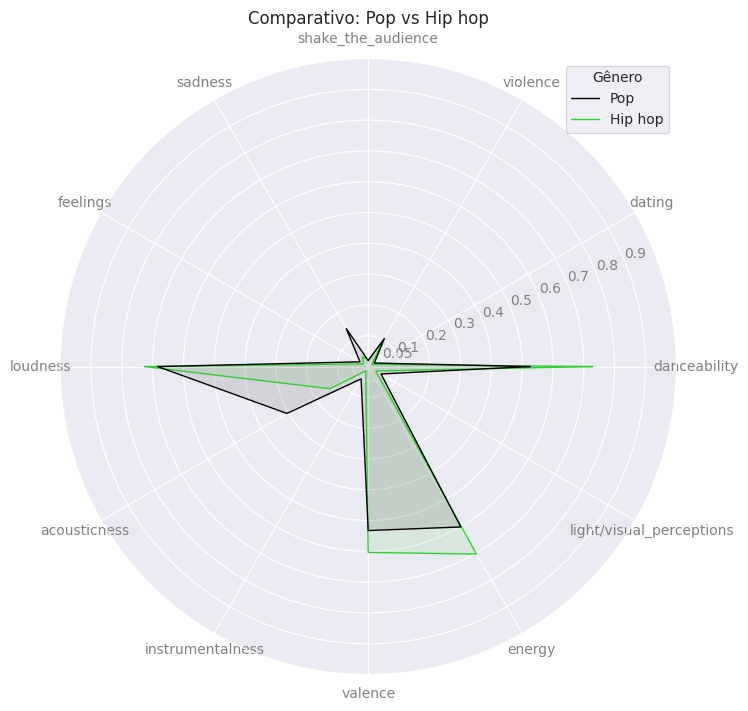

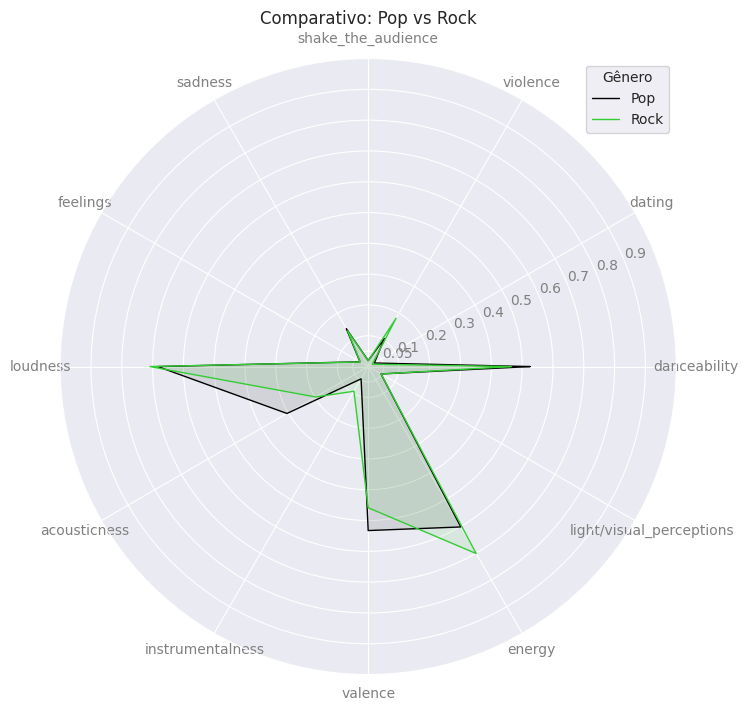

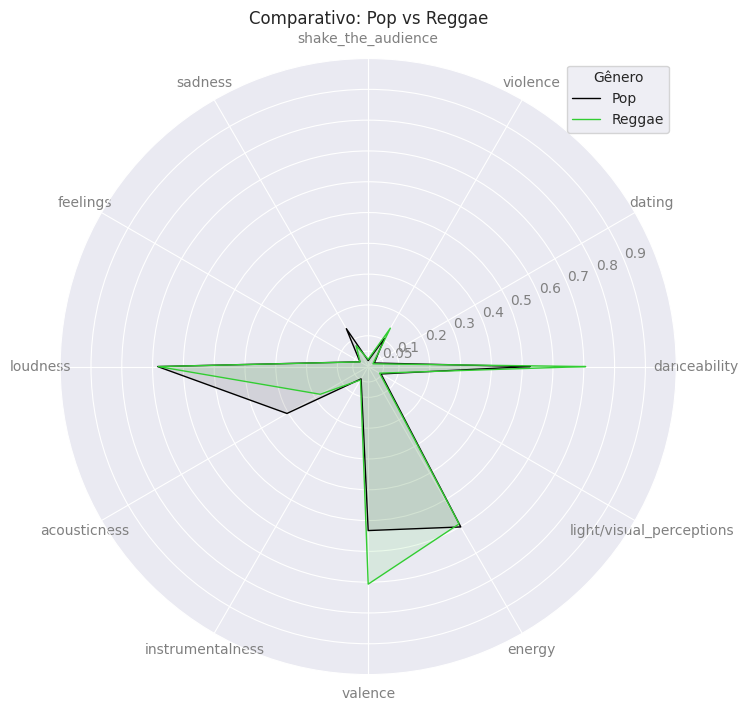

In [ ]:
for genre in genres_to_compare:
    df_filtered = df[df['genre'].isin(['pop', genre])]

    # Agrupando por gênero e obtendo a média de cada categoria
    grouped_data = df_filtered.groupby('genre')[categories].mean()

    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)


    for i, g in enumerate(grouped_data.index):
        values = grouped_data.loc[g].values.tolist()
        values += values[:1]
        if g == 'pop':
            color = 'black'
        else:
            color = 'limegreen'
        ax.plot(angles, values, linewidth=1, linestyle='solid', color=color)
        ax.fill(angles, values, color, alpha=0.1)


    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color='grey', size=10)
    ax.set_yticks([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
    ax.set_yticklabels(['0.05', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'], color='grey', size=10)
    ax.set_ylim(0, 1)
    ax.set_title(f'Comparativo: Pop vs {genre.capitalize()}')
    #ax.legend(legend_labels, loc='upper right', title='Gênero')

    # Solução que encontrei para corrigir a cor da legenda
    legend_labels = ['Pop', genre.capitalize()]
    legend_lines = [Line2D([0], [0], color='black', linewidth=1, linestyle='solid'),
                Line2D([0], [0], color='limegreen', linewidth=1, linestyle='solid')]

    ax.legend(legend_lines, legend_labels, loc='upper right', title='Gênero')
    plt.show()

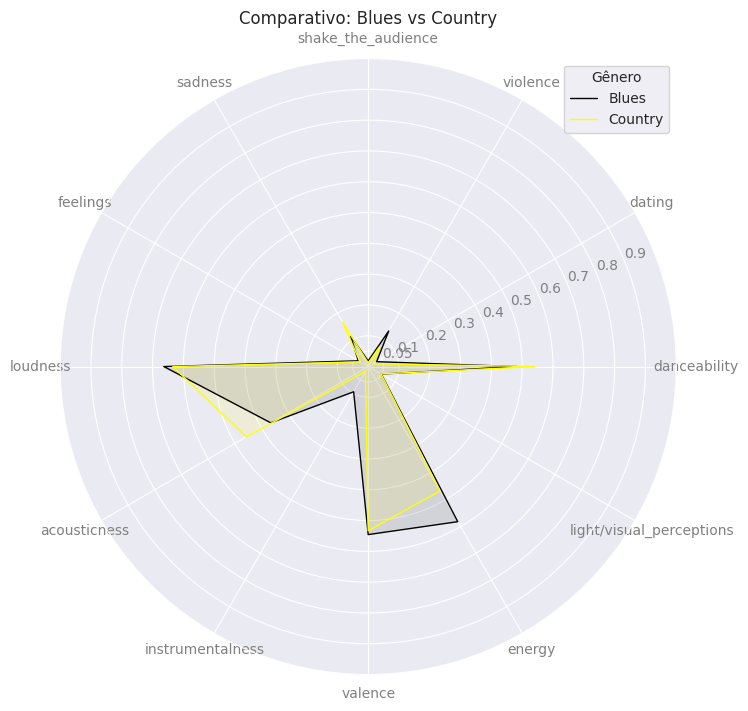

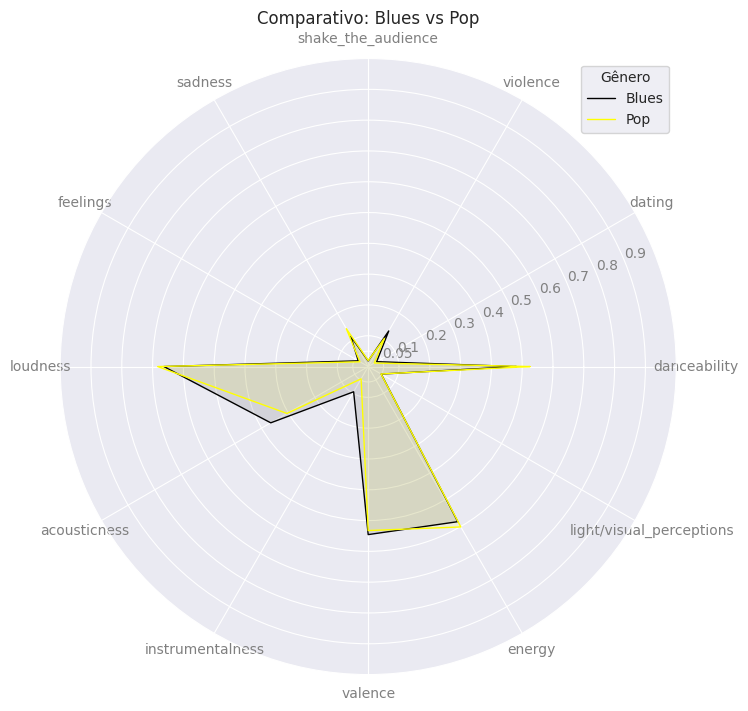

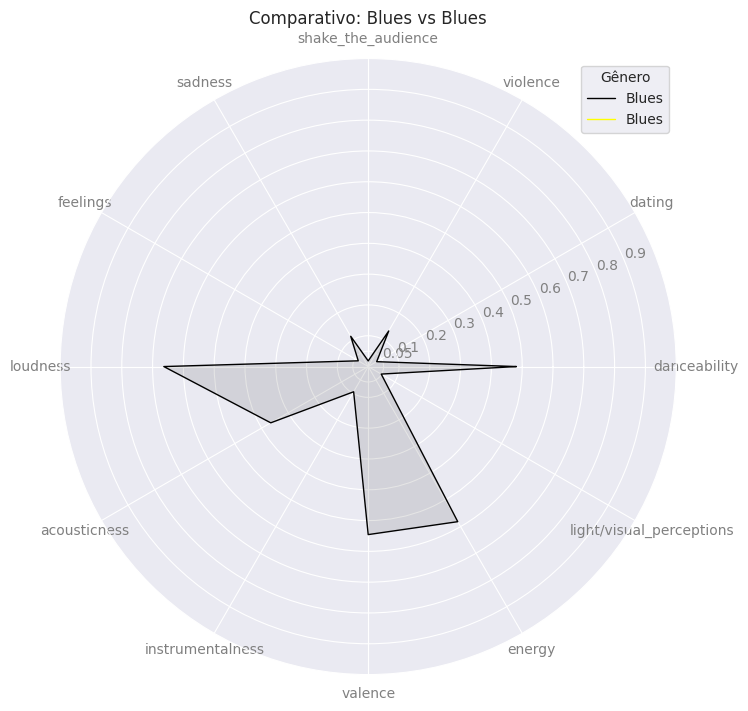

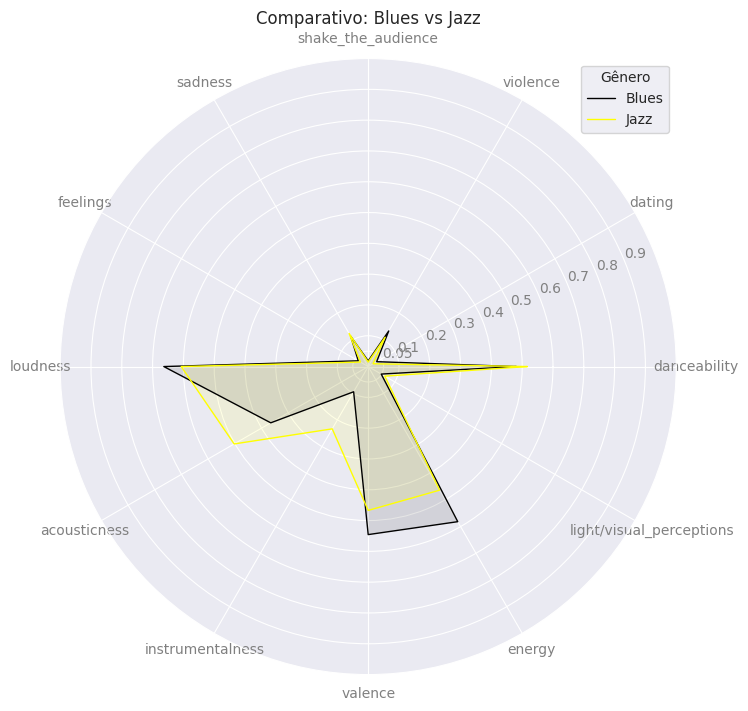

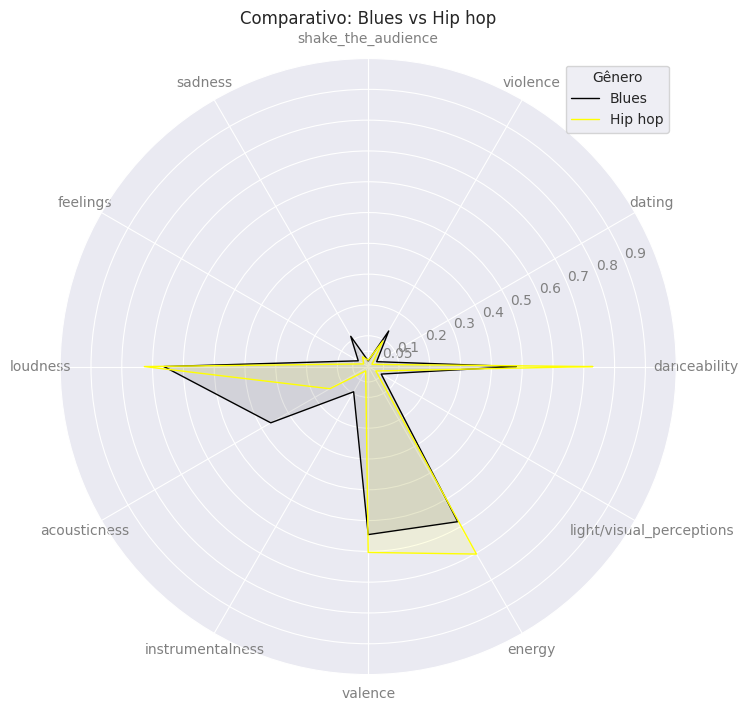

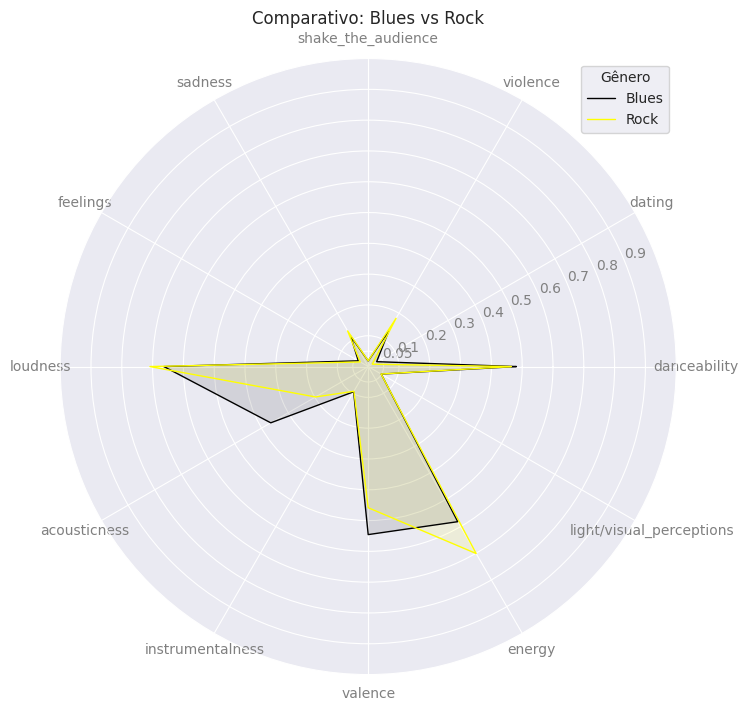

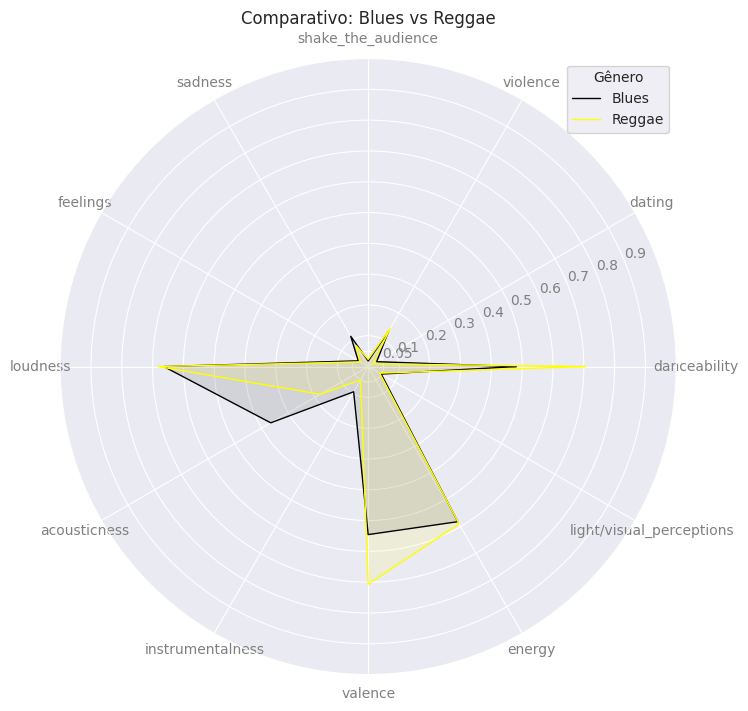

In [ ]:
for genre in genres_to_compare:
    df_filtered = df[df['genre'].isin(['blues', genre])]

    # Agrupando por gênero e obtendo a média de cada categoria
    grouped_data = df_filtered.groupby('genre')[categories].mean()

    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)


    for i, g in enumerate(grouped_data.index):
        values = grouped_data.loc[g].values.tolist()
        values += values[:1]
        if g == 'blues':
            color = 'black'
        else:
            color = 'yellow'
        ax.plot(angles, values, linewidth=1, linestyle='solid', color=color)
        ax.fill(angles, values, color, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color='grey', size=10)
    ax.set_yticks([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
    ax.set_yticklabels(['0.05', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'], color='grey', size=10)
    ax.set_ylim(0, 1)
    ax.set_title(f'Comparativo: Blues vs {genre.capitalize()}')
    # ax.legend(legend_labels, loc='upper right', title='Gênero')

    # Solução que encontrei para corrigir a cor da legenda
    legend_labels = ['Blues', genre.capitalize()]
    legend_lines = [Line2D([0], [0], color='black', linewidth=1, linestyle='solid'),
                Line2D([0], [0], color='yellow', linewidth=1, linestyle='solid')]

    ax.legend(legend_lines, legend_labels, loc='upper right', title='Gênero')
    plt.show()

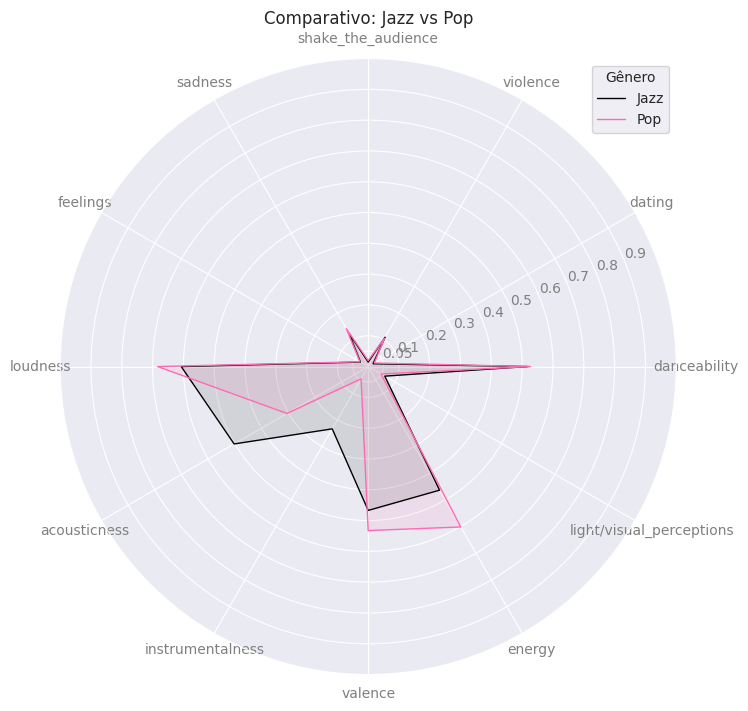

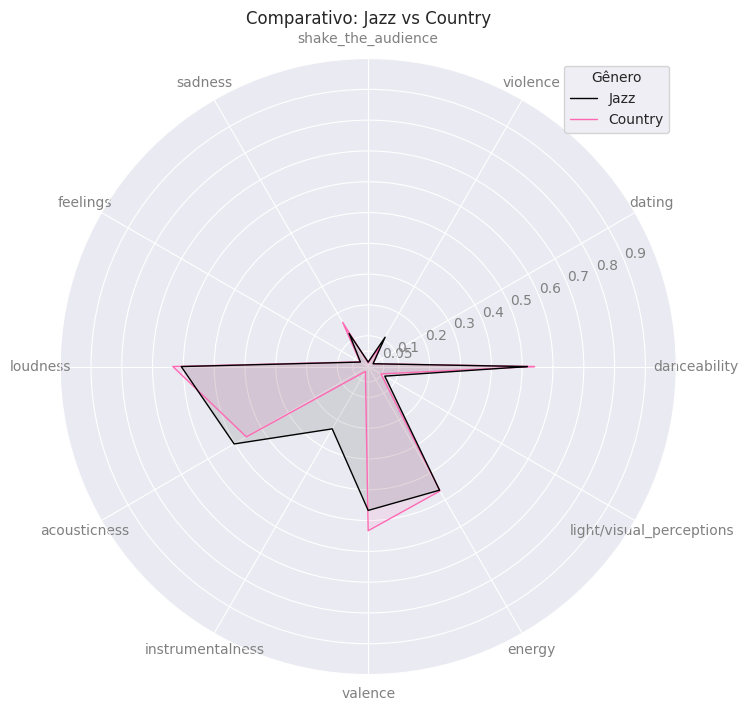

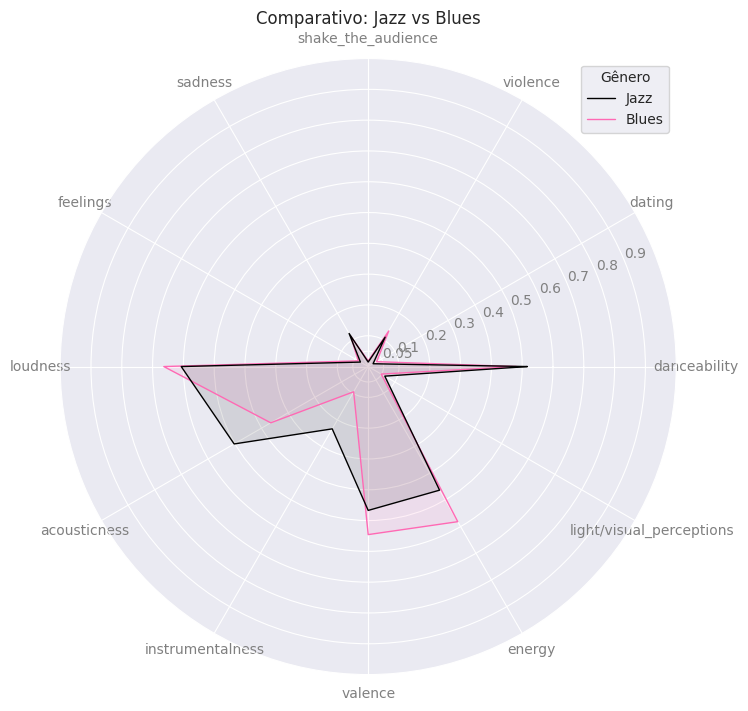

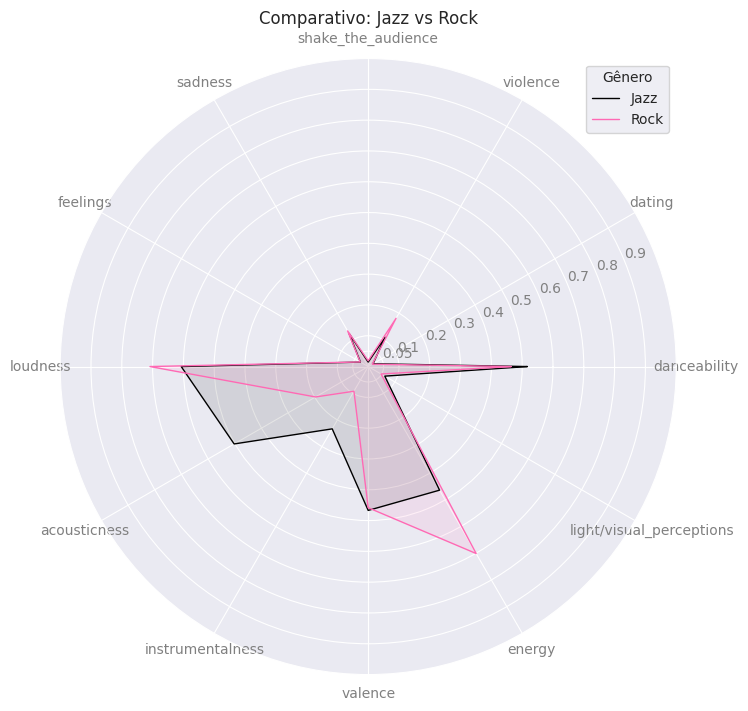

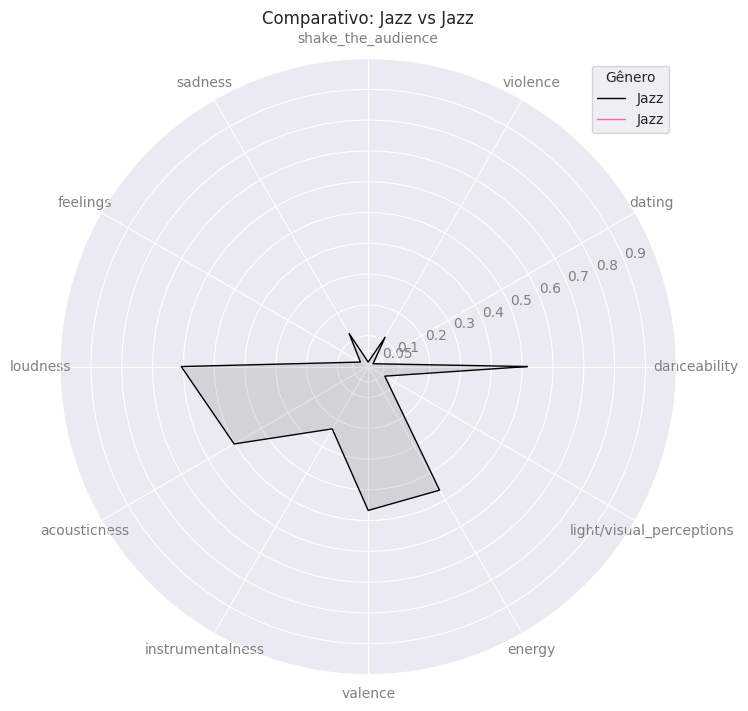

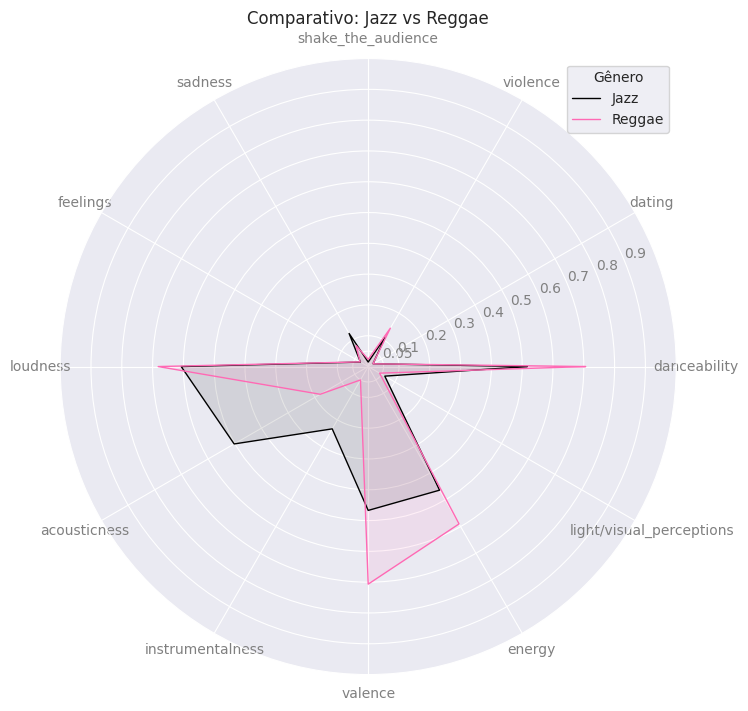

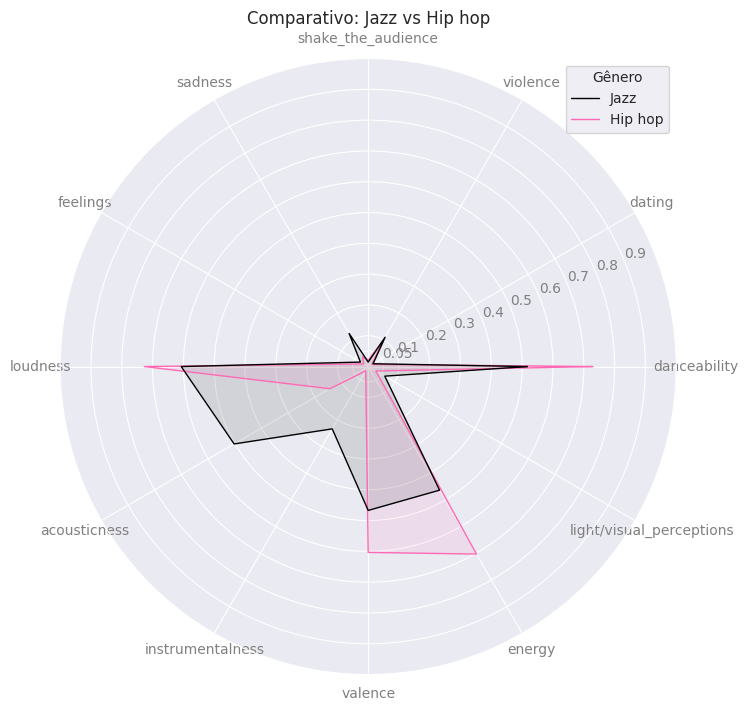

In [ ]:
for genre in generos:

    filtered_jazz = df[df['genre'].isin(['jazz', genre])]
    grouped_jazz = filtered_jazz.groupby('genre')[categories].mean()

    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for i, rotulo in enumerate(grouped_jazz.index):
        values = grouped_jazz.loc[rotulo].values.tolist()
        values += values[:1]
        if rotulo == 'jazz':
            color = 'black'
        else:
            color = 'hotpink'
        ax.plot(angles, values, linewidth=1, linestyle='solid', color=color)
        ax.fill(angles, values, color, alpha=0.1)


    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color='grey', size=10)
    ax.set_yticks([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
    ax.set_yticklabels(['0.05', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'], color='grey', size=10)
    ax.set_ylim(0, 1)
    ax.set_title(f'Comparativo: Jazz vs {genre.capitalize()}')
    # ax.legend(legend_labels, loc='upper right', title='Gênero')

    # Solução que encontrei para corrigir a cor da legenda
    legend_labels = ['Jazz', genre.capitalize()]
    legend_lines = [Line2D([0], [0], color='black', linewidth=1, linestyle='solid'),
                Line2D([0], [0], color='hotpink', linewidth=1, linestyle='solid')]

    ax.legend(legend_lines, legend_labels, loc='upper right', title='Gênero')
    plt.show()

## Conclusão 
Ao longo das décadas, observamos mudanças significativas nos gêneros musicais trabalhados aqui. Após nossas análises, fomos capazes de responder às nossas hipóteses e questionamentos iniciais, além de identificar insights interessantes.

Sobre as hipóteses e questionamentos iniciais:
- Qual gênero se sobressaiu em cada década?
  - Pop foi o gênero predominante ao longo de quase todas as décadas, com exceção apenas da década de 1950, onde o Jazz foi o gênero mais predominante.

- Qual autor lançou mais músicas em cada década?
  - 1950: Hank Mobley - Jazz;
  - 1960: Lorne Greene - Country;
  - 1970: Frank Zappa - Jazz; 
  - 1980: The Replacements - Country;
  - 1990: Project Pat - Pop;
  - 2000: (hed) p. e. - Rock;
  - 2010: Rihanna - Pop.

- Idosos costumam comentar que não se faz música como antigamente. O quanto isto é verdade?
  - Apesar de “qualidade musical” ser subjetivo, se tomarmos como métrica a frequência de músicas com letras agressivas e obscenas, ao lado do uso de músicos reais em vez de instrumentos sintetizados, é possível afirmar que, de fato, não se faz música como antigamente.

- Quais foram os gêneros musicais mais obscenos?
  - Hip hop foi, disparado, o gênero musical com mais letras obscenas apesar de representar apenas aproximadamente 3% de todas as músicas analisadas.

- E quais foram os mais violentos?
  - Rock é o gênero musical mais violento, com reggae em segundo lugar, e blues em terceiro. O que é interessante, já que reggae é um estilo musical que se originou no movimento hippie, que pregava paz e amor.

- Músicas acústicas costumam ser mais amorosas?
  - De fato, as músicas mais acústicas apresentaram, também, uma taxa maior de romantismo.

- Pop é o gênero musical mais dançante?
  - Não! Hip hop e Reggae são os gêneros mais dançantes. Pop está em quarto lugar na lista, atrás de Country.

Sobre os insights:
- Tanto o Rock quanto o Jazz e Country tiveram seu período de maior expressividade, sendo coerente com a cultura geral da época. Apesar disso, ainda sim o gênero Pop sempre foi mais popular, com exceção de Jazz na década de 50;
- O número de palavras nas letras das músicas aumentou, enquanto os trechos instrumentais diminuíram ao passar dos anos;
- Violência e Obscenidade são aspectos de letras de músicas que vêm aumentando com o passar do tempo. Estariam as pessoas se tornando mais violentas e obscenas, talvez? Enquanto isso, o romantismo teve uma queda brusca com o tempo.
- De forma contraintuitiva, observamos que as músicas com tópicos de violência tinham palavras relacionadas à família e espiritualidade. Pode ser um indicativo de que estes sejam os principais objetos da violência das letras destas músicas.
- Á medida em que as músicas foram deixando de serem tocadas por músicos reais, o uso de efeitos sintetizados aumentou junto da dançabilidade, energia e loudness. Tal constatação é totalmente condizente com o nosso período cultural atual: tecnologia substituindo seres humanos, pressa, busca incessante por dopamina em redes sociais, etc.

Esses insights fornecem uma compreensão mais profunda sobre a evolução da música ao longo das décadas, as preferências do público e os aspectos culturais e sociais refletidos nas músicas. No entanto, é importante destacar que a análise foi baseada em um conjunto de dados específico e pode não representar a totalidade da música ao longo do tempo. Em suma, esta análise de dados nos permite reconhecer como a música é uma expressão cultural dinâmica e influenciada por diversos fatores. 

Por fim, é importante ressaltar que tais análises foram feitas utilizando dados já classificado conforme o gênero. Assim, é possível que haja eventuais ruídos tal como expresso na análise dos dados faltantes, onde o gênero rotulado (hip hop) não condizia com o real gênero da música. 